In [1561]:
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append("../include/")
import hhtools

In [4531]:
import imp
imp.reload(hhtools)

<module 'hhtools' from '/home/jungyoung/Project/hh_neuralnet/two_pop_mpi/../include/hhtools.py'>

In [2716]:
def draw_detail(data, xl=(500, 2500)):
    N = len(data['step_spk'])

    fig, axs = plt.subplots(2,2, dpi=120, figsize=(10, 6), height_ratios={0.4, 0.6}, width_ratios={0.8, 0.2})
    plt.axes(axs[0][0])
    hhtools.plot_sub(data['ts']*1e3, data['vlfp'][0], xl=(500, 2500), c='k')
    plt.ylabel(r"$V$", fontsize=15)

    plt.axes(axs[0][1])
    vm = data["vlfp"][0]; t  = data["ts"]
    idt = (t > xl[0]/1000) & (t < xl[1]/1000)
    vm = vm[idt]
    t = t[idt]

    xcorr, tlags = get_autocorr(vm, t, 0.2)
    plt.plot(tlags, xcorr, 'k', lw=1.2)
    plt.ylabel("auto corr", fontsize=13)

    plt.axes(axs[1][0])
    hhtools.draw_spk(data['step_spk'], xl=xl, color_ranges=[N*0.8, N], colors=['r', 'b'])
    plt.ylim([0, N])

    plt.axes(axs[1][1])
    frs = []
    tlen, dt = 2, 0.01
    for t in data["step_spk"]:
        t_spk = np.array(t) * dt
        t_spk = t_spk[t_spk > 500]
        frs.append(len(t_spk)/tlen)

    plt.hist(frs, 15, edgecolor='k')
    plt.ylabel("firing rate (Hz)", fontsize=13)

    plt.show()
    
    
def get_fft(x, fs, wbin=None, wbin_t=None):
    if wbin is None and wbin_t is None:
        N = len(x)
    elif wbin_t is not None:
        N = int(wbin_t*fs)
    elif wbin is not None:
        N = wbin

    yf = np.fft.fft(x, axis=0, n=N)
    yf = 2/N * np.abs(yf[:N//2])
    freq = np.linspace(0, 1/2*fs, N//2)
    return yf, freq

# gI_pI_nuext

In [652]:
obj = hhtools.SummaryLoader("./gI_pI_nuext/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 9, 3, 3)
['g_inh', 'p_inh', 'nu_ext']


## gI-nuext

g_inh: 0.227778 p_min: 0.01


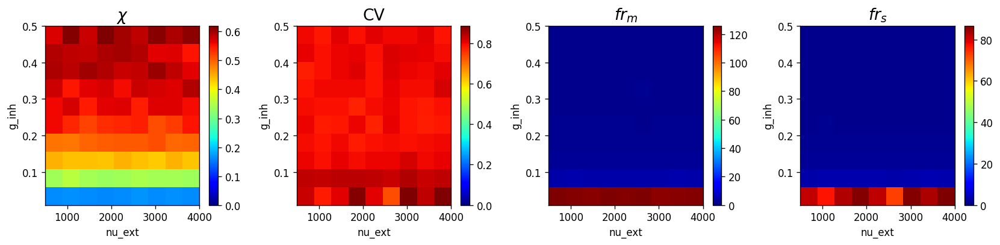

In [497]:
n_pinh = 4

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,n_pinh,:,:,0], axis=2)
    vary = "g_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("g_inh:", obj.controls["g_inh"][n_ginh], "p_min:", obj.controls["p_inh"][0])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## pI-nuext

g_inh: 0.227778 p_min: 0.01


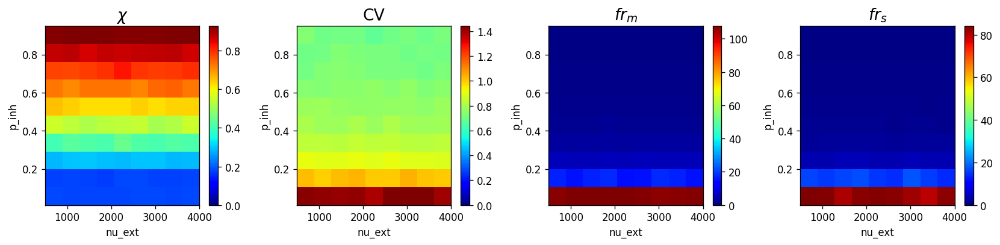

In [654]:
n_ginh = 4

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][n_ginh,:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("g_inh:", obj.controls["g_inh"][n_ginh], "p_min:", obj.controls["p_inh"][0])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [655]:
nid = [0,0,5,0]
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

g_inh: 0.010000
p_inh: 0.010000
nu_ext: 2687.500000

chi : 0.252493
cv  : 0.577103
fr_m: 104.083412


# gI_pI_nuext_ratio

In [1468]:
obj = hhtools.SummaryLoader("./gI_pI_nuext_ratio//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 10, 3, 3)
['g_inh', 'p_inh', 'nu_ext']


nu_ext: 2355.555556


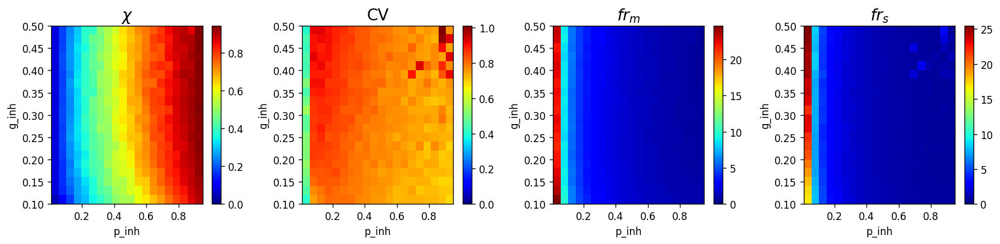

In [1469]:
n_ext = 5
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_ext,:,0], axis=2)
    vary = "g_inh"
    varx = "p_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

# print("beta:", obj.controls["beta"][nb])
print("nu_ext:", obj.controls["nu_ext"][n_ext])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## Strongly connected

In [645]:
nid = [10,1,n_ext,0]
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

g_inh: 0.310526
p_inh: 0.059474
nu_ext: 4000.000000

chi : 0.152863
cv  : 0.941078
fr_m: 12.736003


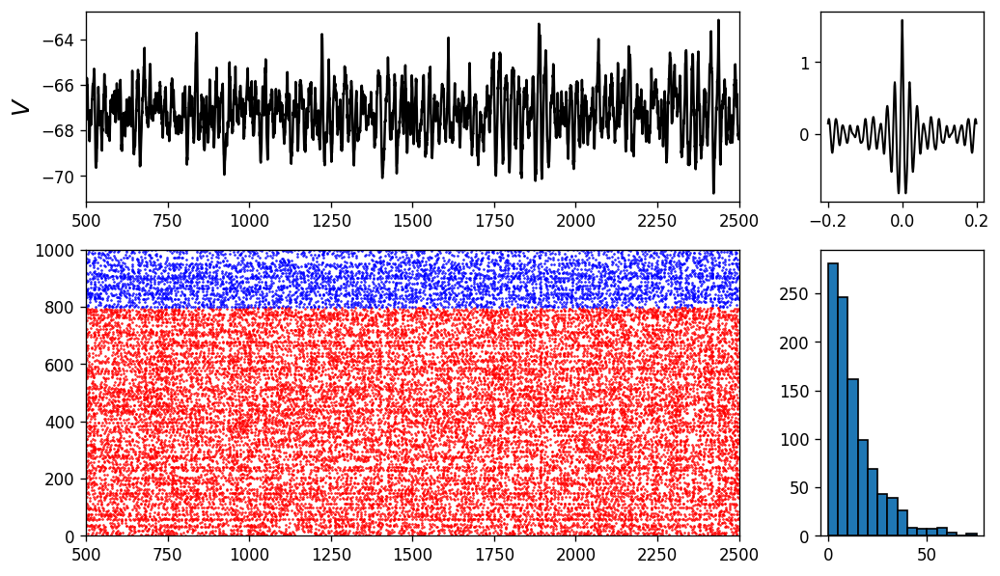

In [646]:
draw_detail(data)

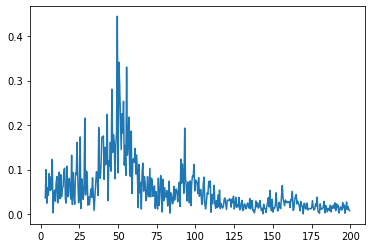

In [647]:
idt = (data["ts"] >= 0.5)
t = data["ts"][idt]
v = data["vlfp"][0][idt]

yf, f = get_fft(v, 2000)
idf = (f >= 3) & (f < 200)
yf = yf[idf]
f = f[idf]

plt.plot(f, yf)
plt.show()

## Weakly connected

In [648]:
nid = [0,1,n_ext,0]
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

g_inh: 0.100000
p_inh: 0.059474
nu_ext: 4000.000000

chi : 0.100542
cv  : 0.768796
fr_m: 14.21649


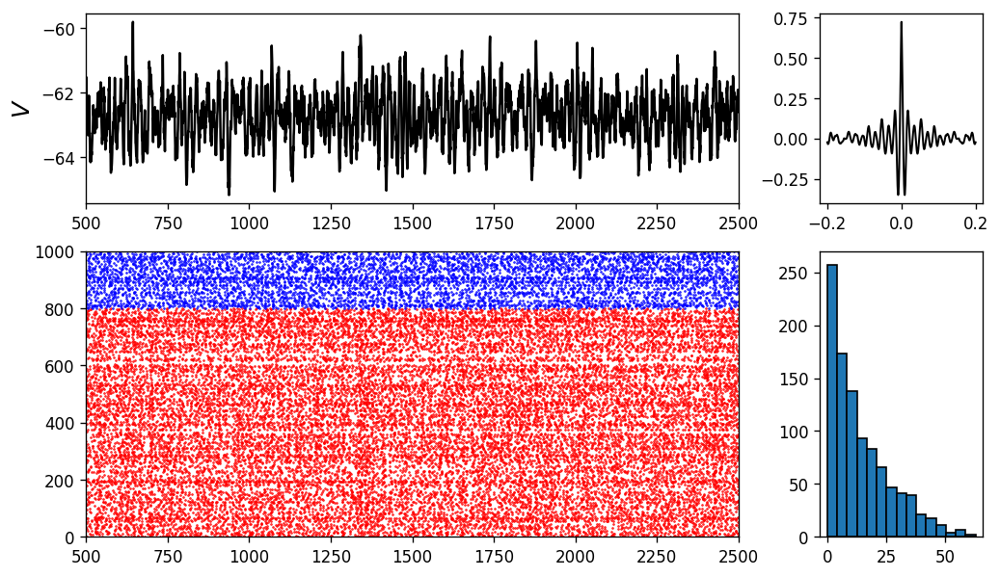

In [649]:
draw_detail(data)

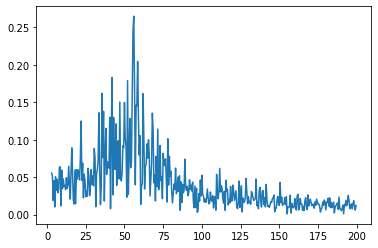

In [650]:
idt = (data["ts"] >= 0.5)
t = data["ts"][idt]
v = data["vlfp"][0][idt]

yf, f = get_fft(v, 2000)
idf = (f >= 3) & (f < 200)
yf = yf[idf]
f = f[idf]

plt.plot(f, yf)
plt.show()

# ab_gI

In [2183]:
obj = hhtools.SummaryLoader("./ab_gI/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 5, 5, 3)
['alpha', 'beta', 'g_inh']


## a-gI

beta: 0.111111


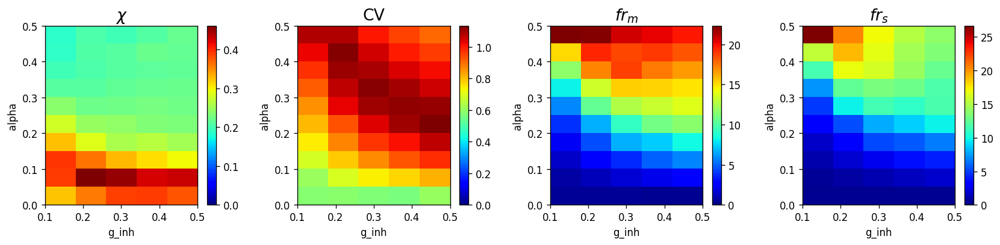

In [2184]:
nb = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,nb,:,:,0], axis=2)
    vary = "alpha"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("beta:", obj.controls["beta"][nb])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## b-gI

beta: 0.111111


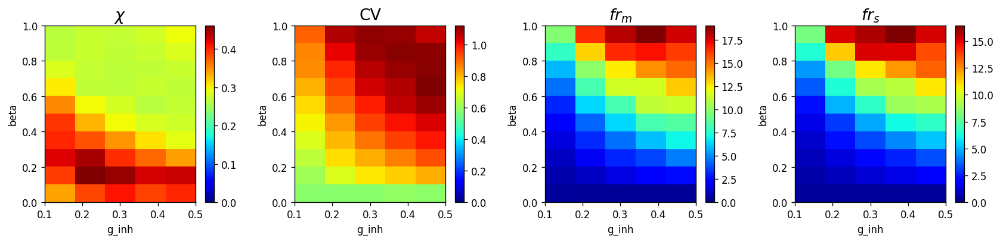

In [2186]:
na = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][na,:,:,:,0], axis=2)
    vary = "beta"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("beta:", obj.controls["beta"][nb])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## a-b

beta: 0.111111


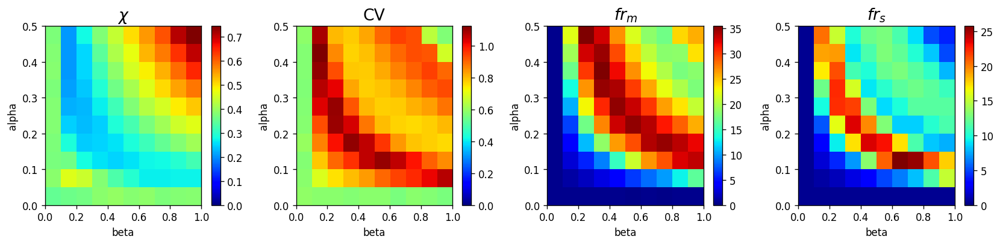

In [2188]:
n_gi = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gi,:,0], axis=2)
    vary = "alpha"
    varx = "beta"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("beta:", obj.controls["beta"][nb])
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# ab_gI_pI_nuext

In [559]:
obj = hhtools.SummaryLoader("./ab_gI_pI_nuext///")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 5, 5, 4, 2, 3)
['alpha', 'beta', 'g_inh', 'p_inh', 'nu_ext']


alpha: 0.055556, beta: 0.222222, p_inh: 0.950000


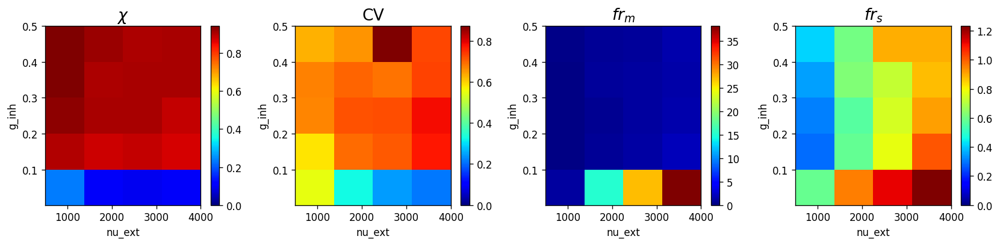

In [566]:
na = 5
nb = 2
n_pi = 4

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][na,nb,:,n_pi,:,:,0], axis=2)
    vary = "g_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("alpha: %f, beta: %f, p_inh: %f"%(obj.controls["alpha"][na], obj.controls["beta"][nb], obj.controls["p_inh"][n_pi]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# pI_nuext_ab

In [4500]:
obj = hhtools.SummaryLoader("./pI_nuext_ratio//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 2, 2, 3, 3)
['p_inh', 'nu_ext', 'alpha', 'beta']


## pI-nu_ext

alpha: 0.100000, beta: 0.500000


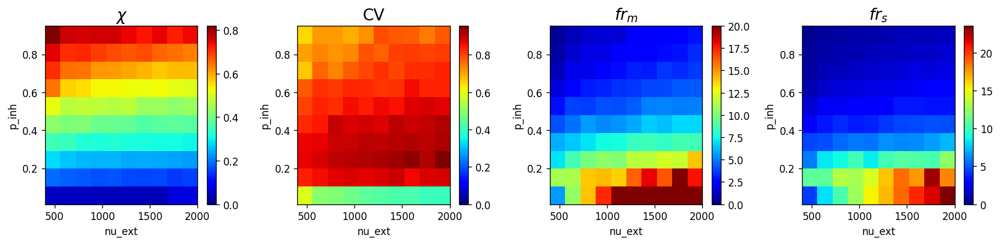

In [2750]:
na, nb = 1, 1

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,na,nb,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("alpha: %f, beta: %f"%(obj.controls["alpha"][na], obj.controls["beta"][nb]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=20, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [680]:
nid = [9,9,0,1,0]
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

p_inh: 0.950000
nu_ext: 2000.000000
alpha: 0.010000
beta: 0.500000

chi : 0.905033
cv  : 0.64787
fr_m: 0.884406


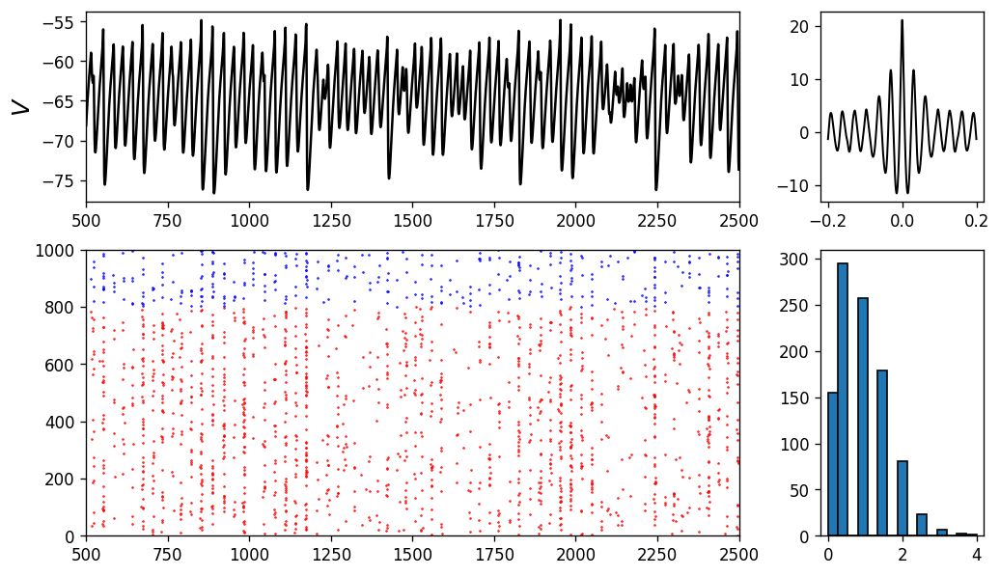

In [681]:
draw_detail(data)

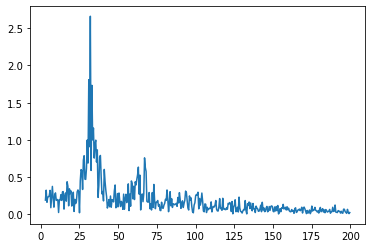

In [682]:
idt = (data["ts"] >= 0.5)
t = data["ts"][idt]
v = data["vlfp"][0][idt]

yf, f = get_fft(v, 2000)
idf = (f >= 3) & (f < 200)
yf = yf[idf]
f = f[idf]

plt.plot(f, yf)
plt.show()

In [669]:
na, nb = 1, 0
l = [np.average(obj.summary["chi"][n,2*n,na,nb,:,0]) for n in range(5)]
fr_m = [np.average(obj.summary["frs_m"][n,2*n,na,nb,:,0]) for n in range(5)]

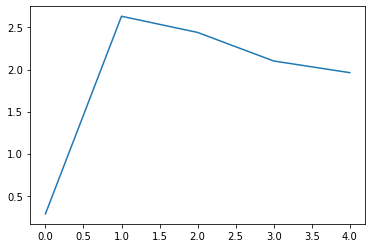

In [670]:
plt.plot(fr_m)

In [ ]:
obj = hhtools.SummaryLoader("./pI_nuext_ratio//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 2, 2, 3, 3)
['p_inh', 'nu_ext', 'alpha', 'beta']


## gI-nu_ext

In [554]:
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 2, 2, 3, 3)
['p_inh', 'nu_ext', 'alpha', 'beta']


In [ ]:
na, nb = 1, 0

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,na,nb,:,0], axis=2)
    vary = "g_in"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("alpha: %f, beta: %f"%(obj.controls["alpha"][na], obj.controls["beta"][nb]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [432]:
# obj = hhtools.SummaryLoader("./gI_pI_nuext/")
# obj = hhtools.SummaryLoader("./ab_gI/")
# obj = hhtools.SummaryLoader("./ab_gI_pI_nuext/")
obj = hhtools.SummaryLoader("./pI_nuext_ratio//")
print(obj.summary["chi"].shape)
print(obj.control_names)

(10, 10, 2, 2, 3, 3)
['p_inh', 'nu_ext', 'alpha', 'beta']


(10, 10)
(10, 10)
(10, 10)
(10, 10)


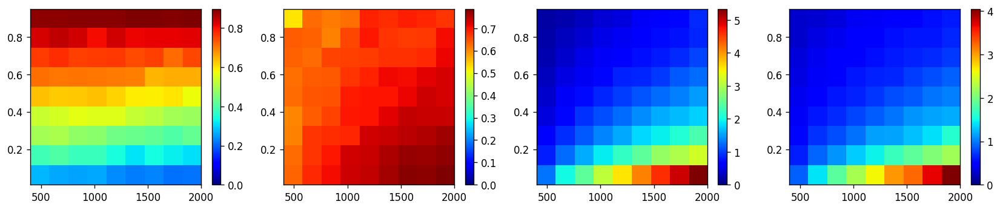

In [439]:
def draw_im(var_name, vmax=None, vmin=None):
    im_tot = np.average(obj.summary[var_name][:,:,0,1,:,0], axis=2)
    print(im_tot.shape)
    im = im_tot
    y = obj.controls["p_inh"]
    x = obj.controls["nu_ext"]
    hhtools.imshow_xy(im[1:,1:], x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0)
plt.tight_layout()
plt.show()

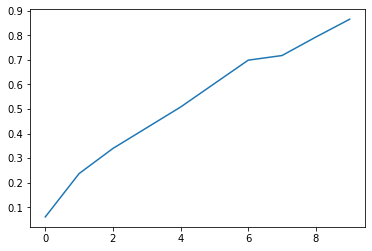

In [443]:
l1 = np.average(obj.summary["chi"][:,4,1,0,0], axis=1)
# l2 = np.average(obj.summary["frs_m"][0,:,1,:,0], axis=1)
plt.plot(l1)
# plt.plot(l2)

In [427]:
nid = [3,2,1,0]
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

g_inh: 0.163158
p_inh: 0.108947
nu_ext: 711.111111

chi : 0.314313
cv  : 0.686138
fr_m: 1.958399


In [465]:
def draw_detail(data):
    N = len(data['step_spk'])

    fig, axs = plt.subplots(2,2, dpi=120, figsize=(10, 6), height_ratios={0.4, 0.6}, width_ratios={0.8, 0.2})
    plt.axes(axs[0][0])
    hhtools.plot_sub(data['ts']*1e3, data['vlfp'][0], xl=(500, 2500), c='k')
    plt.ylabel(r"$V$", fontsize=15)

    plt.axes(axs[0][1])
    vm = data["vlfp"][0]; t  = data["ts"]
    idt = (t > 0.5)
    vm = vm[idt]
    t = t[idt]

    xcorr, tlags = get_autocorr(vm, t, 0.2)
    plt.plot(tlags, xcorr, 'k', lw=1.2)

    plt.axes(axs[1][0])
    hhtools.draw_spk(data['step_spk'], xl=[500, 2500], color_ranges=[N*0.8, N], colors=['r', 'b'])
    plt.ylim([0, 1000])

    plt.axes(axs[1][1])
    frs = []
    tlen, dt = 2, 0.01
    for t in data["step_spk"]:
        t_spk = np.array(t) * dt
        t_spk = t_spk[t_spk > 500]
        frs.append(len(t_spk)/tlen)

    plt.hist(frs, 15, edgecolor='k')

    plt.show()

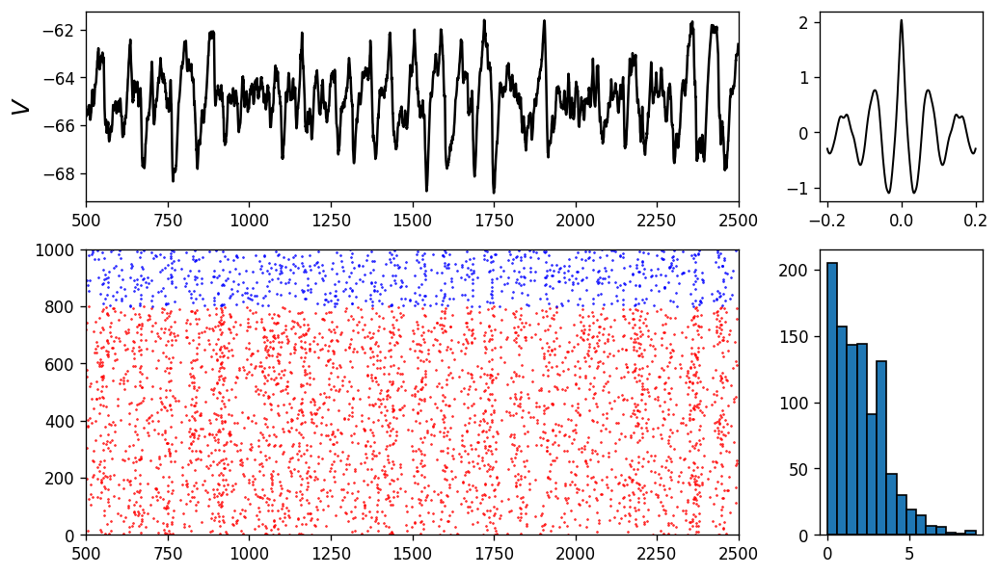

In [466]:
draw_detail(data)

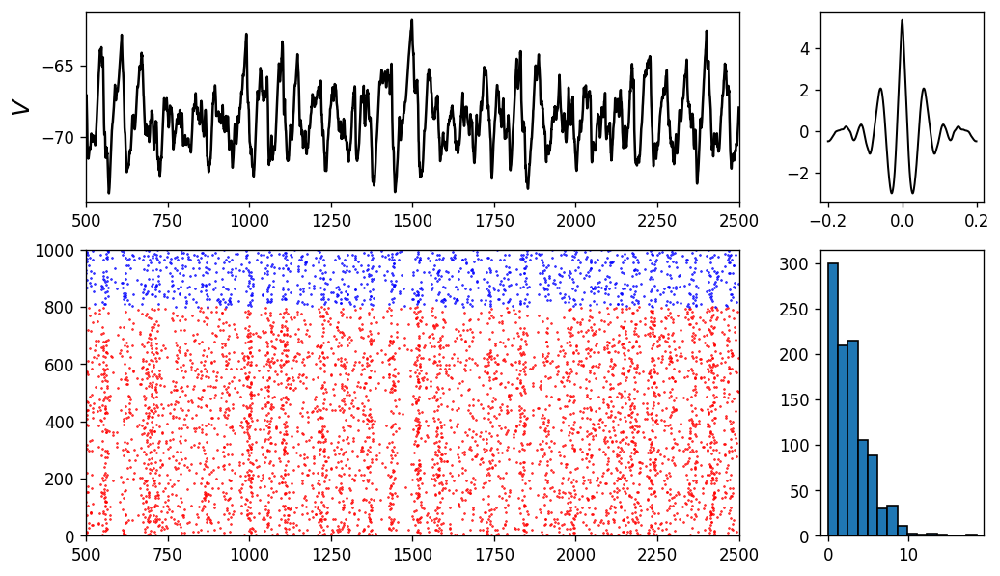

In [406]:
N = len(data['step_spk'])

fig, axs = plt.subplots(2,2, dpi=120, figsize=(10, 6), height_ratios={0.4, 0.6}, width_ratios={0.8, 0.2})
plt.axes(axs[0][0])
hhtools.plot_sub(data['ts']*1e3, data['vlfp'][0], xl=(500, 2500), c='k')
plt.ylabel(r"$V$", fontsize=15)

plt.axes(axs[0][1])
vm = data["vlfp"][0]; t  = data["ts"]
idt = (t > 0.5)
vm = vm[idt]
t = t[idt]

xcorr, tlags = get_autocorr(vm, t, 0.2)
plt.plot(tlags, xcorr, 'k', lw=1.2)

plt.axes(axs[1][0])
hhtools.draw_spk(data['step_spk'], xl=[500, 2500], color_ranges=[N*0.8, N], colors=['r', 'b'])
plt.ylim([0, 1000])

plt.axes(axs[1][1])
frs = []
tlen, dt = 2, 0.01
for t in data["step_spk"]:
    t_spk = np.array(t) * dt
    t_spk = t_spk[t_spk > 500]
    frs.append(len(t_spk)/tlen)

plt.hist(frs, 15, edgecolor='k')

plt.show()

# pI_nuext_gI_ratio

In [4488]:
obj = hhtools.SummaryLoader("./pI_nuext_gI_ratio//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 3, 3, 5, 3)
['p_inh', 'nu_ext', 'g_inh', 'alpha']


g_inh: 0.100000, na: 0.200000


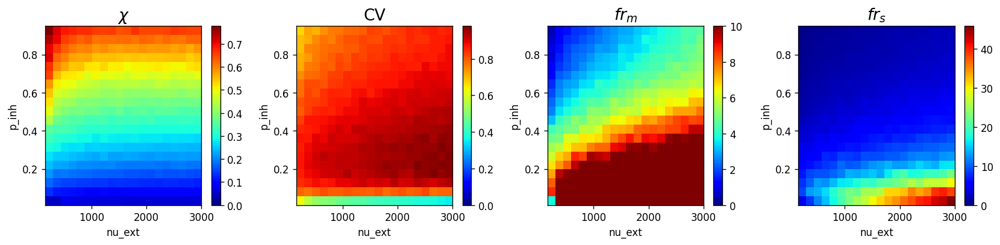

In [4497]:
n_gi = 0
na = 2
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gi,na,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

# print("beta:", obj.controls["beta"][nb])
# print("nu_ext:", obj.controls["nu_ext"][n_ext])
print("g_inh: %f, na: %f"%(obj.controls["g_inh"][n_gi], obj.controls["alpha"][na]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

g_inh: 0.100000, na: 0.100000


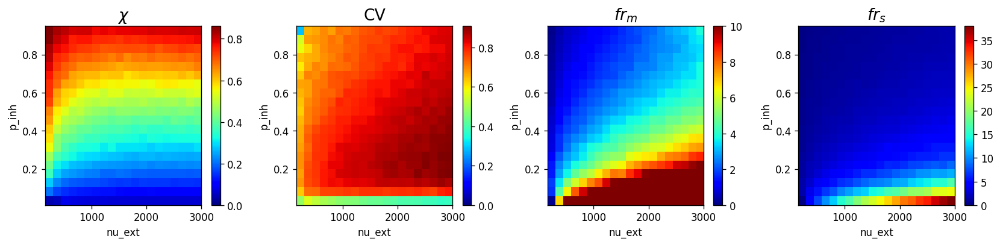

In [1493]:
n_gi = 0
na = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gi,na,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

# print("beta:", obj.controls["beta"][nb])
# print("nu_ext:", obj.controls["nu_ext"][n_ext])
print("g_inh: %f, na: %f"%(obj.controls["g_inh"][n_gi], obj.controls["alpha"][na]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

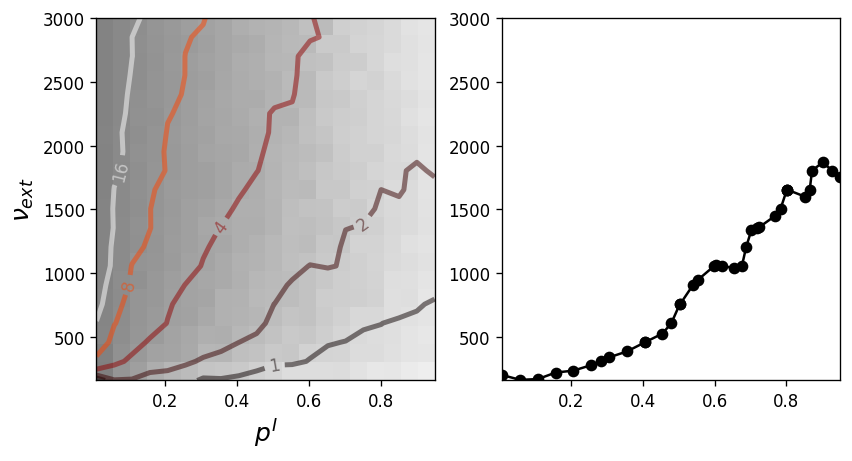

In [1202]:
im_chi = obj.summary["chi"][:,:,n_gi,na,0,0]
im_frs = obj.summary["frs_m"][:,:,n_gi,na,0,0]

x = np.array(obj.controls["p_inh"])
y = np.array(obj.controls["nu_ext"])

fig, ax = plt.subplots(1,2, dpi=120, figsize=(8,4))
# hhtools.imshow_xy(im_frs.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.axes(ax[0])
hhtools.imshow_xy(im_chi.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=1)
c = plt.contour(x, y, im_frs.T, [2**n for n in range(5)], linewidths=3, alpha=0.5, cmap="hot")
plt.xlabel(r"$p^I$", fontsize=15)
plt.ylabel(r"$\nu_{ext}$", fontsize=15)
ax[0].clabel(c, inline=1, fontsize=10)

# second axis
xc, yc = [], []
for p in c.collections[1].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
xc = np.array(xc)
yc = np.array(yc)
    
ax[1].plot(xc, yc, 'ko-')
ax[1].set_xlim([x[0], x[-1]])
ax[1].set_ylim([y[0], y[-1]])
plt.show()


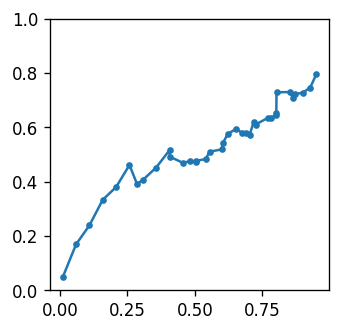

In [1187]:
xc = np.sort(xc)
yc = np.sort(yc)
vals, _ = extract_value_on_line(im_chi.T, x, y, xc, yc)

plt.figure(dpi=120, figsize=(3,3))
plt.plot(xc, vals, '.-')
plt.ylim([0, 1])
plt.show()

In [1203]:
nid = -1
nx = np.argmin(np.abs(x - xc[nid]))
ny = np.argmin(np.abs(y - yc[nid]))

In [ ]:
obj.get_id(

In [1204]:
nid = [nx,ny,n_gi,na,0]
print(obj.get_id(*nid))
data = obj.load_detail(*nid)
obj.print_params(*nid[:-1])

print()
exec("print('chi :', obj.summary['chi']%s[0])"%(nid))
exec("print('cv  :', obj.summary['cv']%s[0])"%(nid))
exec("print('fr_m:', obj.summary['frs_m']%s[0])"%(nid))

17600
p_inh: 0.950000
nu_ext: 1804.210526
g_inh: 0.100000
alpha: 0.100000

chi : 0.789851
cv  : 0.774861
fr_m: 2.1692


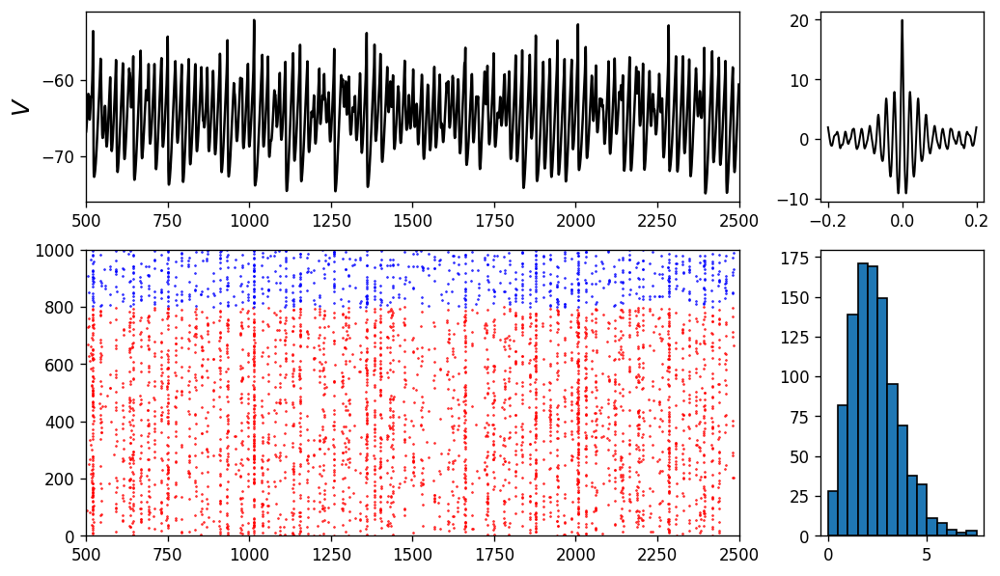

In [1195]:
draw_detail(data)

In [1205]:
!cat ./pI_nuext_gI_ratio/id017600_info.txt

Size: 1000
ntypes: 2
type_range:
w:
0.010000, 0.010000, 
0.100000, 0.100000, 
t_lag: 0.500000
nu_pos: 1804.210526
w_pos: 0.002000
mean indegree:
152.000000, 152.000000, 
190.000000, 190.000000, 
connection prob (out):
0.190000, 0.190000, 
0.950000, 0.950000, 


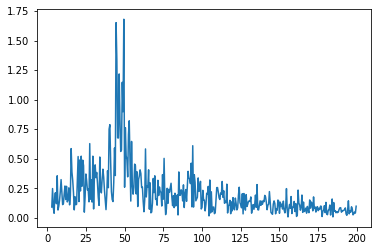

In [1196]:
idt = (data["ts"] >= 0.5)
t = data["ts"][idt]
v = data["vlfp"][0][idt]

yf, f = get_fft(v, 2000)
idf = (f >= 3) & (f < 200)
yf = yf[idf]
f = f[idf]

plt.plot(f, yf)
plt.show()

In [1197]:
def extract_value_on_line(im, x, y, xq=None, yq=None):
    if len(x) != im.shape[1] or len(y) != im.shape[0]:
        print("size is different")
        
    if xq is None:
        xq = x.copy()
    
    if xq[0] < x[0] or xq[-1] > x[-1]:
        print("Range exceed")
        return
    
    num = len(xq)
    vals = []
    for n in range(num):
        xq0 = xq[n]
        yq0 = yq[n]
        if (yq0 <= y[0]) or (yq0 > y[-1]):
            vals.append(np.nan)
            continue
        
        # find the nearest 4 points
        # print(np.where(xq0 <= x)[0])
        nx0 = np.where(xq0 <= x)[0][0]
        nx1 = np.where(xq0 >= x)[0][-1]
        ny0 = np.where(yq0 <= y)[0][0]
        ny1 = np.where(yq0 >= y)[0][-1]
        
        pts = [[nx0, ny0], [nx0, ny1], [nx1, ny0], [nx1, ny1]]
        ds = []
        tmp_vals = []
        flag = False
        for i in range(4):
            # get distance
            nx, ny = pts[i]
            x0, y0 = x[nx], y[ny]
            
            d = np.sqrt((x0 - xq0)**2 + (y0-yq0)**2)            
            v = im[ny, nx]
            
            if d == 0:
                vals.append(v)
                flag = True
                break
            
            ds.append(d)
            tmp_vals.append(v)

        if flag:
            continue
        vals.append(np.sum([tmp_vals[i] * ds[i] / np.sum(ds) for i in range(4)]))
    
    return vals, xq

In [ ]:
fig, ax = plt.subplots(1,1, dpi=120, figsize=(4,4))
hhtools.imshow_xy(im.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$p^I$", fontsize=15)
plt.ylabel(r"$\nu_{ext}$", fontsize=15)

c = plt.contour(x, y, im.T, [2**n for n in range(2)], linewidths=3, alpha=0.5, cmap="hot")
ax.clabel(c, inline=1, fontsize=10)
plt.show()

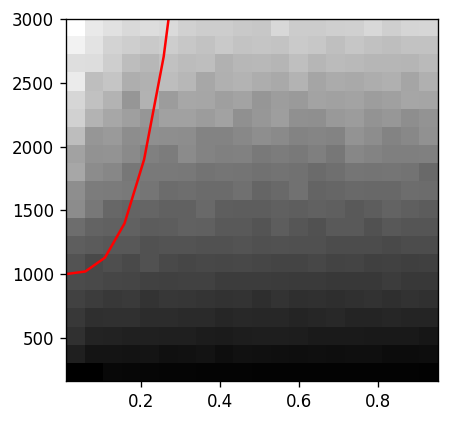

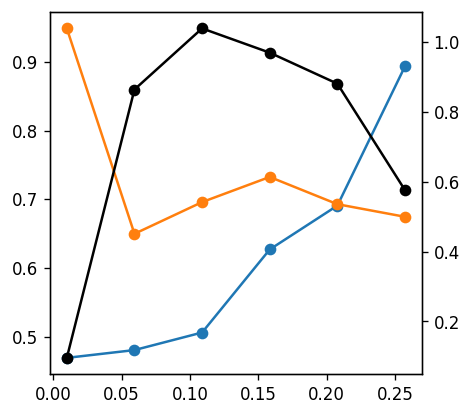

In [923]:
im = obj.summary["chi"][:,:,0,2,0,0]

x = np.array(obj.controls["p_inh"])
y = np.array(obj.controls["nu_ext"])
func = lambda x: 100000*x**3 + 1000

plt.figure(dpi=120, figsize=(4,4))
hhtools.imshow_xy(im, x=x, y=y, cmap="gray")
plt.plot(x, func(x), c='r')
plt.xlim([x[0], x[-1]])
plt.ylim([y[0], y[-1]])

plt.show()

lines = []
for vn in ["chi", "cv", "frs_m"]:
    im = obj.summary[vn][:,:,n_gi,na,0,0]
    vals, xq = extract_value_on_line(im, func, x, y)
    lines.append(vals)
    
    
plt.figure(dpi=120, figsize=(4,4))
for i in range(3):
    if i < 2:
        plt.plot(xq, lines[i], 'o-')
    else:
        plt.twinx()
        plt.plot(xq, lines[i], 'ko-')


plt.show()

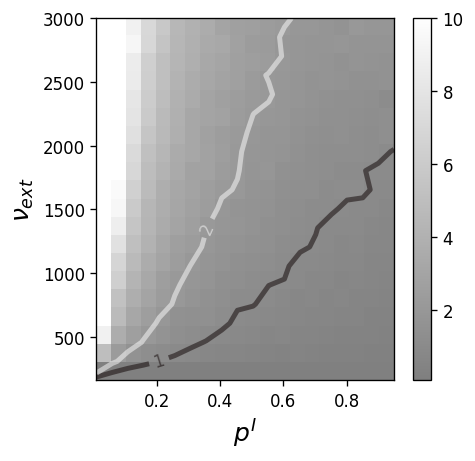

In [924]:
fig, ax = plt.subplots(1,1, dpi=120, figsize=(4,4))
hhtools.imshow_xy(im.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$p^I$", fontsize=15)
plt.ylabel(r"$\nu_{ext}$", fontsize=15)

c = plt.contour(x, y, im.T, [2**n for n in range(2)], linewidths=3, alpha=0.5, cmap="hot")
ax.clabel(c, inline=1, fontsize=10)
plt.show()

# pI_nuext_n_ratio

In [2135]:
obj = hhtools.SummaryLoader("./pI_nuext_n_ratio/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 4, 5, 3)
['p_inh', 'nu_ext', 'n_set']


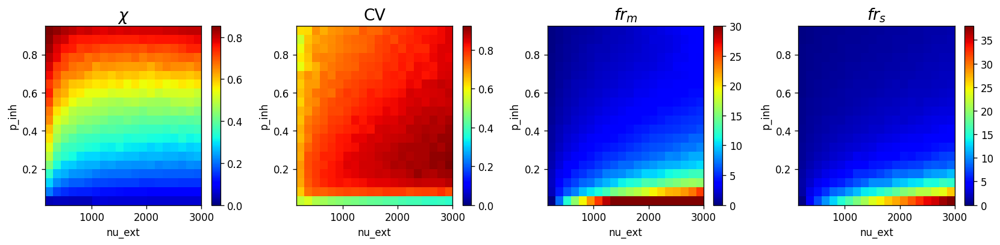

In [2136]:
n_n = 0

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_n,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=30, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

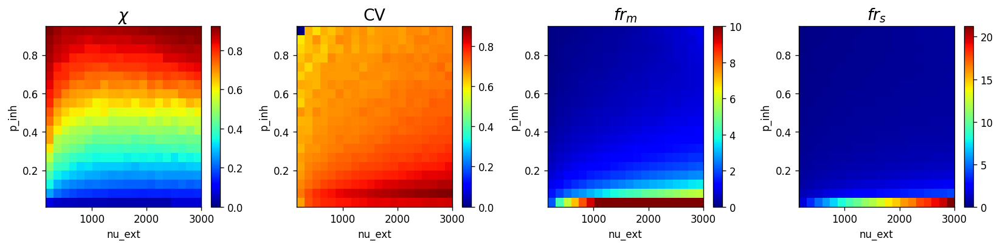

In [2137]:
n_n = 3

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_n,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

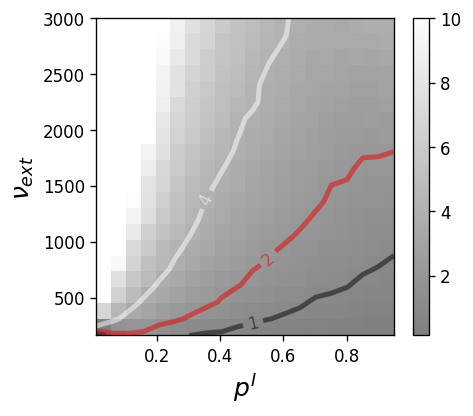

In [2138]:
x = np.array(obj.controls["p_inh"])
y = np.array(obj.controls["nu_ext"])

n_n = 0
im_chi = np.average(obj.summary["chi"][:,:,n_n,:,0], axis=2)
im_frs = np.average(obj.summary["frs_m"][:,:,n_n,:,0], axis=2)

fig, ax = plt.subplots(1,1, dpi=120, figsize=(4,3.5))
hhtools.imshow_xy(im_frs.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$p^I$", fontsize=15)
plt.ylabel(r"$\nu_{ext}$", fontsize=15)

c = plt.contour(x, y, im_frs.T, [2**n for n in range(3)], linewidths=3, alpha=0.5, cmap="hot")
ax.clabel(c, inline=1, fontsize=10)
plt.show()

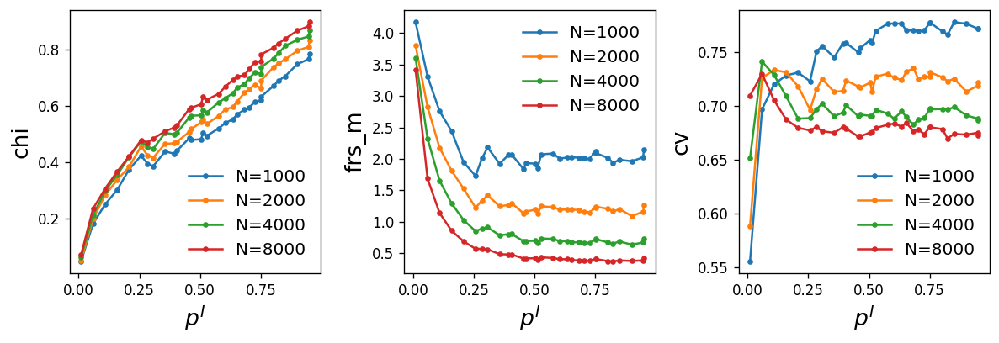

In [2139]:
# second axis
xc, yc = [], []
for p in c.collections[1].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
xc = np.sort(xc)
yc = np.sort(yc)


sz = [1000, 2000, 4000, 8000]
tags = ["chi", "frs_m", "cv"]
plt.figure(dpi=120, figsize=(10, 3.5))
for n in range(3):
    
    plt.subplot(1,3,n+1)
    
    for i in range(4):
        im = np.average(obj.summary[tags[n]][:,:,i,:,0], axis=2)
        vals, _, _ = extract_value_on_line(im.T, x, y, xc, yc)
        plt.plot(xc, vals, '.-', label="N=%d"%(sz[i]))
    
    plt.xlabel(r"$p^I$", fontsize=16)
    plt.ylabel(tags[n], fontsize=16)
    plt.legend(fontsize=12, edgecolor='none')

plt.tight_layout()
plt.show()

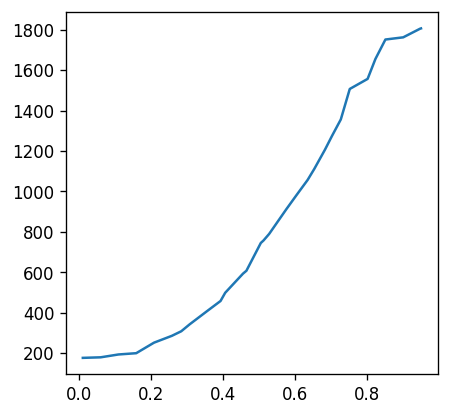

In [2142]:
plt.figure(dpi=120, figsize=(4,4))
plt.plot(xc, yc)
plt.show()

In [2133]:
# get network osc frequency
ys = []
for n_n in range(4):
    im_net = np.zeros(list(im.shape)+ [nitr])
    for i in tqdm(range(im_net.shape[0])):
        for j in range(im_net.shape[1]):
            for k in range(nitr):
                data = obj.load_detail(i, j, n_n, k)
                im_net[i, j, k] = hhtools.get_network_frequency(data['vlfp'][0])
    
    im = np.average(im_net, axis=2)
    vals, _, _ = extract_value_on_line(im.T, x, y, xc, yc)
    ys.append(vals)

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

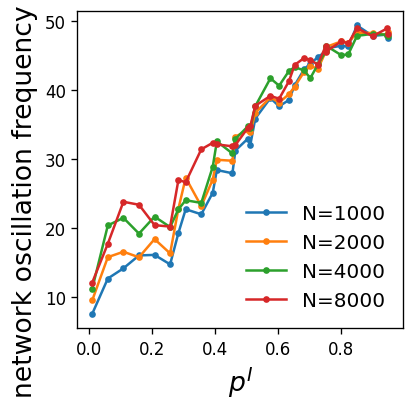

In [2134]:
sz = [1000, 2000, 4000, 8000]

plt.figure(dpi=120, figsize=(3.5, 3.5))    
for n_n in range(4):
    plt.plot(xc, ys[n_n], '.-', label="N=%d"%(sz[n_n]))

plt.xlabel(r"$p^I$", fontsize=16)
plt.ylabel('network oscillation frequency (Hz)', fontsize=16)
plt.legend(fontsize=12, edgecolor='none')

plt.show()

In [1544]:
def find_index(x, x0):
    return np.argmin(np.abs(x - x0))

nid_min = [find_index(obj.controls["p_inh"], xc[0]), find_index(obj.controls["nu_ext"], yc[0])]
nid_max = [find_index(obj.controls["p_inh"], xc[-1]), find_index(obj.controls["nu_ext"], yc[-1])]
print(nid_min, nid_max)


def get_network_frequency(data):
    vs = data['vlfp'][0]
    idt = (data['ts'] >= 0.5)
    vs = vs[idt]

    yf, freq = hhtools.get_fft(vs, 2000, nbin_t=0.5)
    idf = (freq >= 2) & (freq < 200)
    yf = yf[idf]
    freq = freq[idf]
    
    fosc = freq[np.argmax(yf)]
    return fosc, yf, freq

[0, 0] [19, 11]


In [1545]:
data_min = obj.load_detail(0,   0, 0, 0)
data_max = obj.load_detail(11, 19, 0, 0)

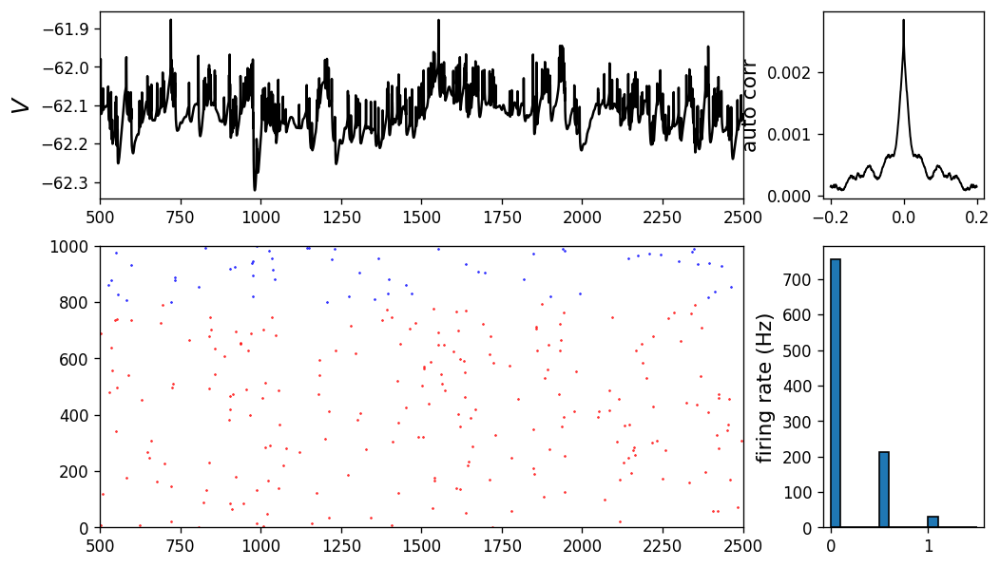

16.03206412825651


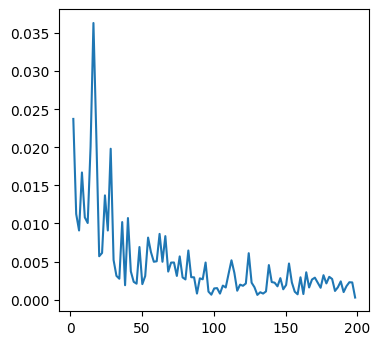

In [1547]:
draw_detail(data_min)

fosc, yf, freq = get_network_frequency(data_min)

print(fosc)
plt.figure(dpi=100, figsize=(4,4))
plt.plot(freq, yf)
plt.show()

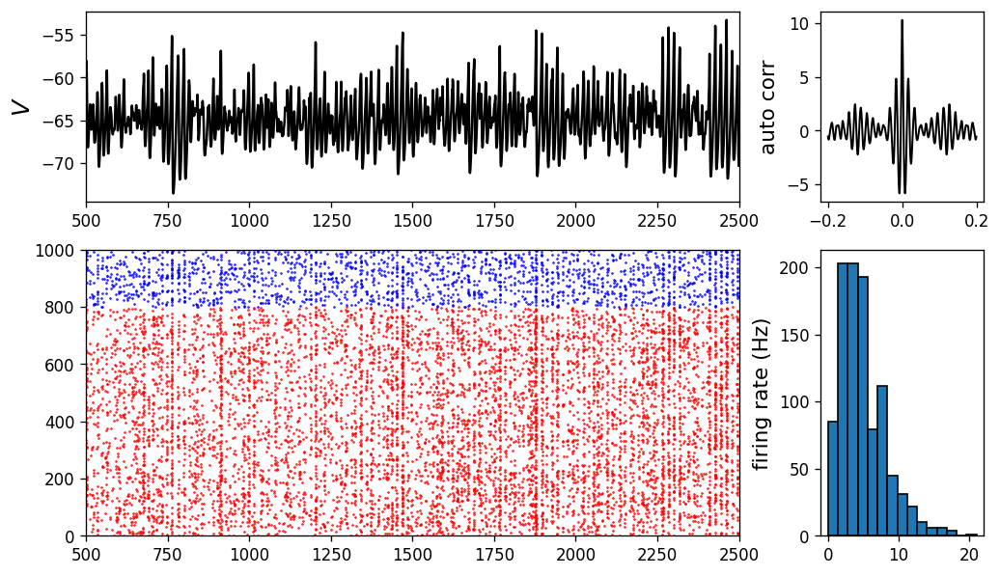

56.11222444889779


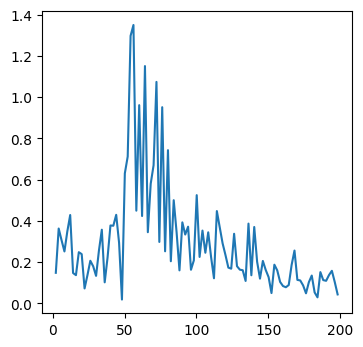

In [1548]:
draw_detail(data_max)

fosc, yf, freq = get_network_frequency(data_max)

print(fosc)
plt.figure(dpi=100, figsize=(4,4))
plt.plot(freq, yf)
plt.show()

In [1533]:
yc[0]

178.05233266653343

In [1532]:
yc[-1]

1805.543767731137

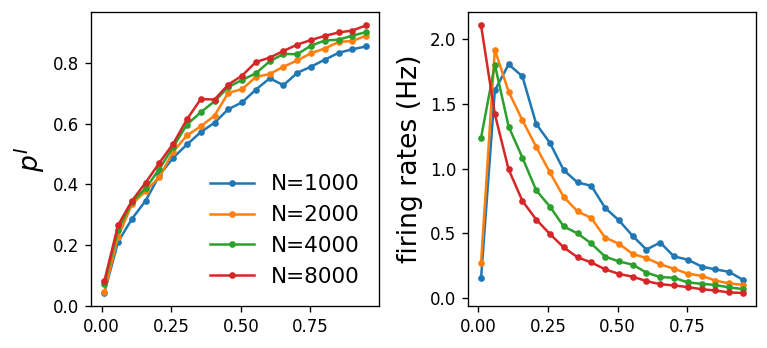

In [1527]:
# var_name = "chi"

plt.figure(dpi=120, figsize=(6.5,3))

plt.subplot(121)
l = np.average(obj.summary["chi"][:,0,:,:,0], axis=2)
plt.plot(obj.controls["p_inh"], l, '.-', label=["N=%d"%(n) for n in [1000, 2000, 4000, 8000]])
plt.ylabel(r"$\chi$", fontsize=16)
plt.ylabel(r"$p^I$", fontsize=16)
plt.legend(fontsize=13, loc="lower right", edgecolor='none')

plt.subplot(122)
l = np.average(obj.summary["frs_m"][:,0,:,:,0], axis=2)
plt.plot(obj.controls["p_inh"], l, '.-')
plt.ylabel(r"firing rates (Hz)", fontsize=16)

plt.tight_layout()
plt.show()

## Frequency 

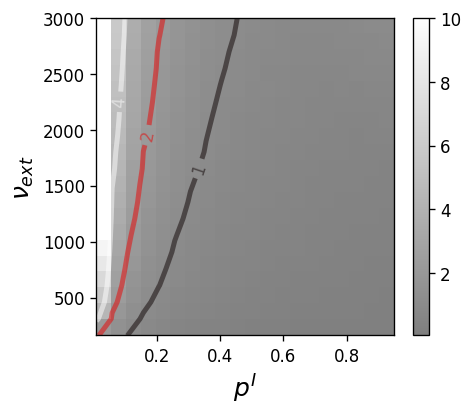

In [1357]:
x = np.array(obj.controls["p_inh"])
y = np.array(obj.controls["nu_ext"])

n_n = 3
im_chi = np.average(obj.summary["chi"][:,:,n_n,:,0], axis=2)
im_frs = np.average(obj.summary["frs_m"][:,:,n_n,:,0], axis=2)

fig, ax = plt.subplots(1,1, dpi=120, figsize=(4,3.5))
hhtools.imshow_xy(im_frs.T, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$p^I$", fontsize=15)
plt.ylabel(r"$\nu_{ext}$", fontsize=15)

c = plt.contour(x, y, im_frs.T, [2**n for n in range(3)], linewidths=3, alpha=0.5, cmap="hot")
ax.clabel(c, inline=1, fontsize=10)
plt.show()

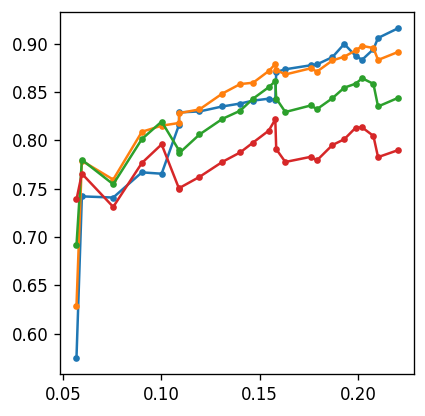

In [1359]:
# second axis
xc, yc = [], []
for p in c.collections[1].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
xc = np.sort(xc)
yc = np.sort(yc)

ys_interp = []
for n_n in range(4):
    im_chi = np.average(obj.summary["cv"][:,:,n_n,:,0], axis=2)
    vals, _ = extract_value_on_line(im_chi.T, x, y, xc, yc)
    ys_interp.append(vals)

plt.figure(dpi=120, figsize=(3.8,4))
for n in range(4):
    plt.plot(xc, ys_interp[n], '.-')
# plt.ylim([0, 2])
plt.show()

In [1363]:
# print(obj.get_id(10,10,0,0), obj.get_id(10,10,0,0), obj.get_id(10,10,0,0))
for n in range(4):
    print(obj.get_id(10,10,n,0))

4200
4205
4210
4215


In [1447]:
xc[0], yc[0]

(0.01, 178.05233266653343)

In [1451]:
obj.controls["nu_ext"][1]

309.473684

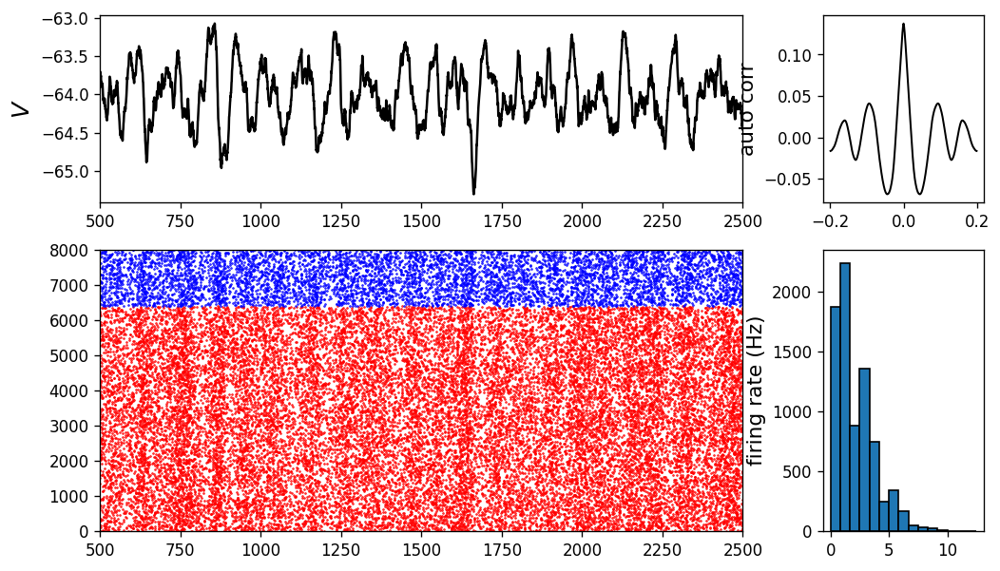

In [1454]:
data1 = obj.load_detail(0,0,3,0)
draw_detail(data1)

In [1455]:
obj.summary["chi"][0,0,3,0]

array([0.089259, 0.089555, 0.091329])

In [1452]:
data1 = obj.load_detail(19,11,3,0)
# data2 = obj.load_detail(10,10,3,0)

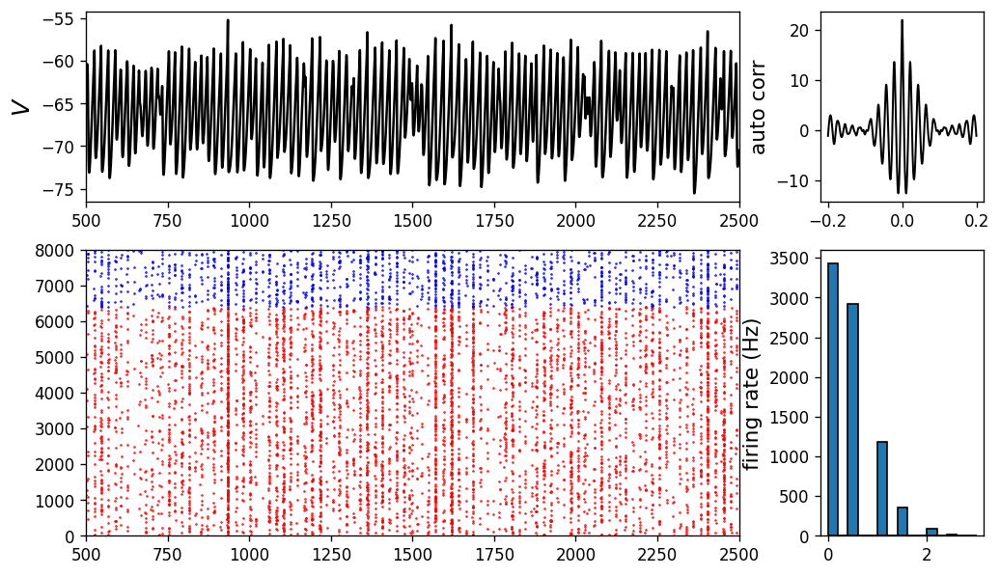

In [1453]:
draw_detail(data1)

In [ ]:
data1 = obj.load_detail(19,1,0,0)
# data2 = obj.load_detail(10,10,3,0)

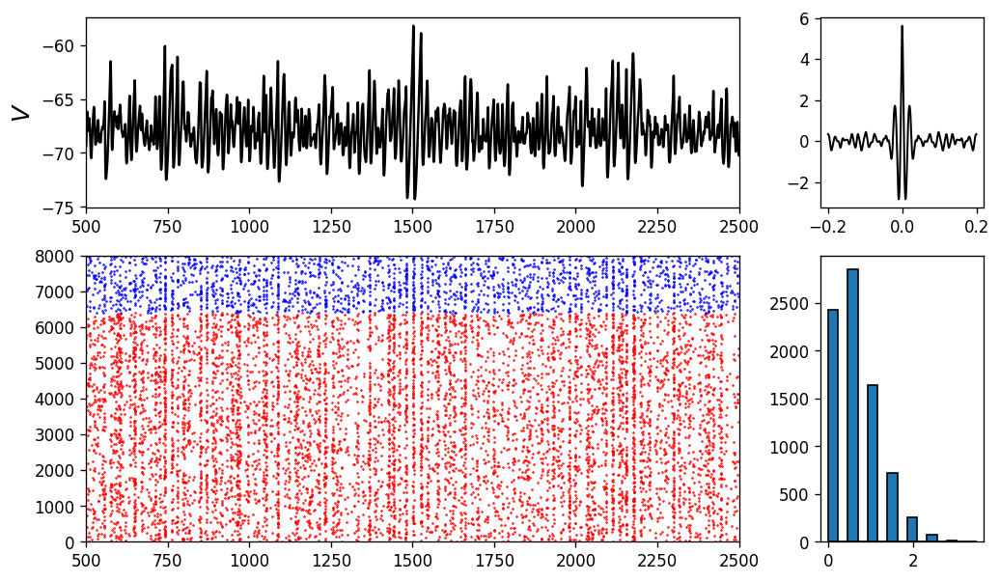

In [1384]:
draw_detail(data2)

## Check size distribution

In [1392]:
# nids = [4200, 4205, 4210, 4215]
nids = [4200, 4215]

# ntks = []
mdeg_in_e = []
mdeg_in_i = []

for n in nids:
    ntk, _ = hhtools.load_network("pI_nuext_n_ratio_ntk/id%06d_ntk_e.txt"%(n))
    mdeg_in_e.append([len(adj) for adj in ntk])
    
    ntk, _ = hhtools.load_network("pI_nuext_n_ratio_ntk/id%06d_ntk_i.txt"%(n))
    mdeg_in_i.append([len(adj) for adj in ntk])

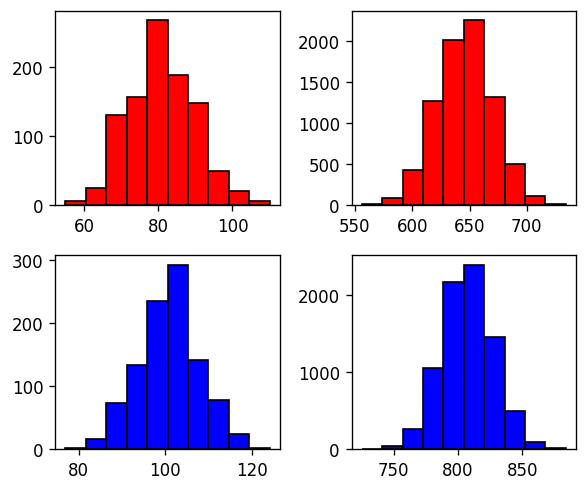

In [1398]:
plt.figure(dpi=120, figsize=(5, 4.2))
plt.subplot(221)
plt.hist(mdeg_in_e[0], edgecolor='k', facecolor='r')

plt.subplot(222)
plt.hist(mdeg_in_e[1], edgecolor='k', facecolor='r')

plt.subplot(223)
plt.hist(mdeg_in_i[0], edgecolor='k', facecolor='b')

plt.subplot(224)
plt.hist(mdeg_in_i[1], edgecolor='k', facecolor='b')

plt.tight_layout()
plt.show()

# pI_nuext_change_int

In [1515]:
obj = hhtools.SummaryLoader("./pI_nuext_change_int/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 5, 3)
['p_inh', 'nu_ext']


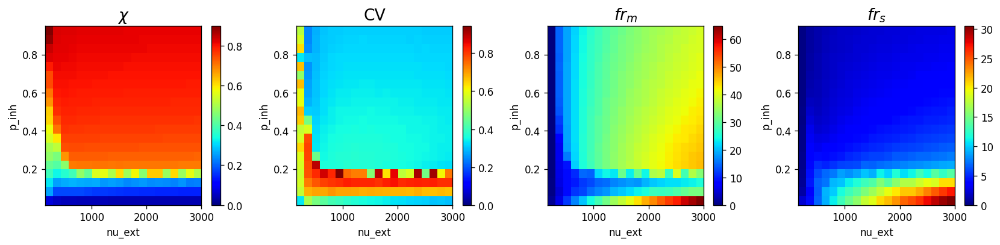

In [1516]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

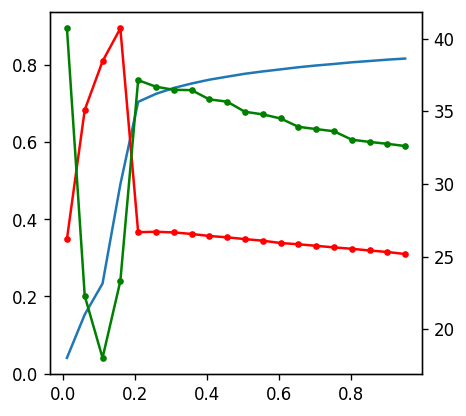

In [1517]:
plt.figure(dpi=120, figsize=(4,4))
plt.plot(obj.controls["p_inh"], np.average(obj.summary["chi"][:,10,:,0], axis=1))
plt.plot(obj.controls["p_inh"], np.average(obj.summary["cv"][:,10,:,0], axis=1), 'r.-')
plt.twinx()

plt.plot(obj.controls["p_inh"], np.average(obj.summary["frs_m"][:,10,:,0], axis=1), 'g.-')
plt.show()

In [1518]:
obj.summary["chi"].shape

(20, 20, 5, 3)

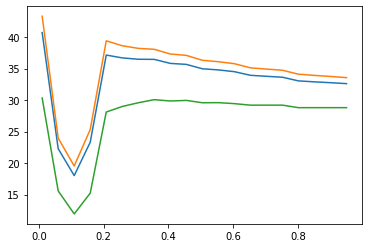

In [1519]:
plt.plot(obj.controls["p_inh"], np.average(obj.summary["frs_m"][:,10,:,0], axis=1))
plt.plot(obj.controls["p_inh"], np.average(obj.summary["frs_m"][:,10,:,1], axis=1))
plt.plot(obj.controls["p_inh"], np.average(obj.summary["frs_m"][:,10,:,2], axis=1))

In [1520]:
data = obj.load_detail(10, 10, 0)

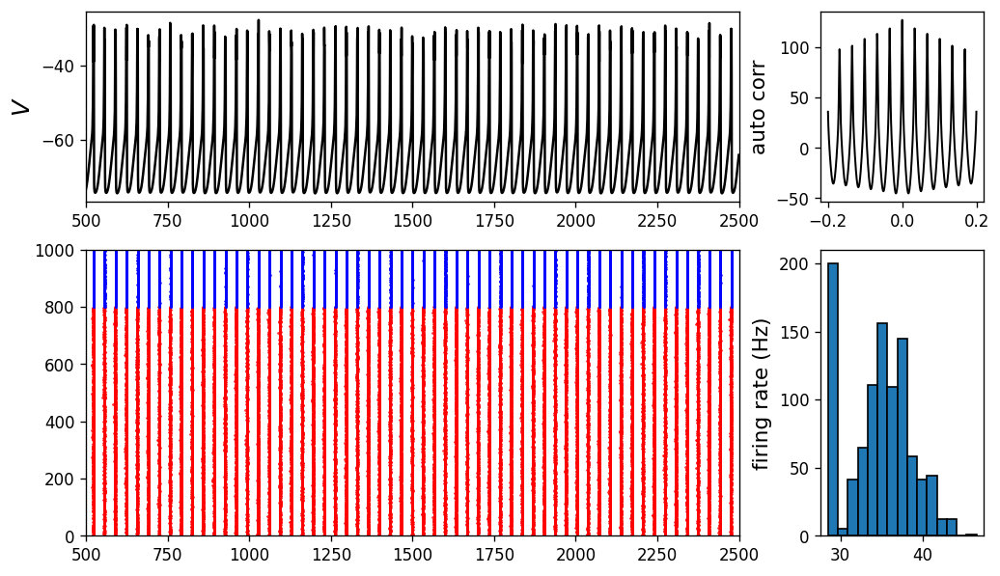

In [1521]:
draw_detail(data)

# gE_gI_nuext

In [4770]:
obj = hhtools.SummaryLoader("./gE_gI_nuext///")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 5, 5, 3)
['g_exc', 'g_inh', 'nu_ext']


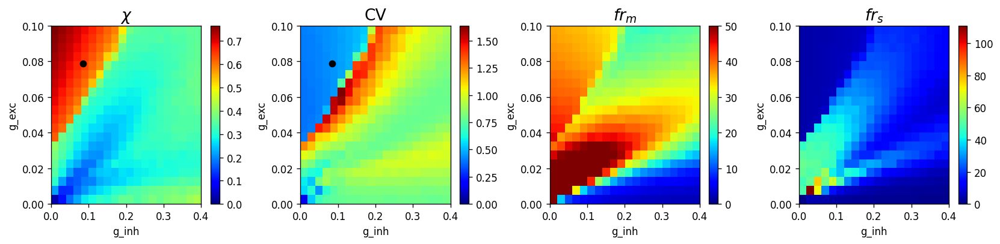

In [4776]:
n_nu = 2

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_nu,:,0], axis=2)
    vary = "g_exc"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    
nr = 15
nc = 4

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.plot(obj.controls["g_inh"][nc], obj.controls["g_exc"][nr], 'ko')
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.plot(obj.controls["g_inh"][nc], obj.controls["g_exc"][nr], 'ko')
plt.axes(axs[2]); draw_im("frs_m", vmax=50, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
ob

In [4800]:
!cat gE_gI_nuext/id000000_info.txt

Size: 1000
ntypes: 2
type_range:
w:
0.000000, 0.000000, 
0.000000, 0.000000, 
t_lag: 0.500000
nu_pos: 160.000000
w_pos: 0.002000
mean indegree:
80.000000, 80.000000, 
80.000000, 80.000000, 
connection prob (out):
0.100000, 0.100000, 
0.400000, 0.400000, 


In [2747]:
data = obj.load_detail(nr, nc, n_nu, 0)
print(obj.summary["chi"][nr,nc,n_nu,0,0])

0.608133


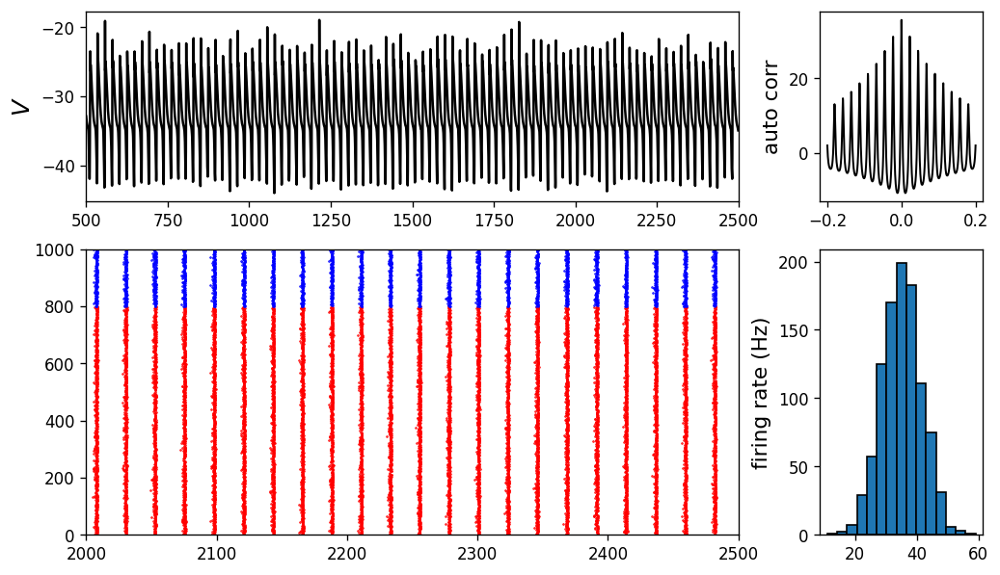

In [2748]:
draw_detail(data, xl=(2000, 2500))

In [1502]:
data = obj.load_detail(18, 5, n_nu, 0)

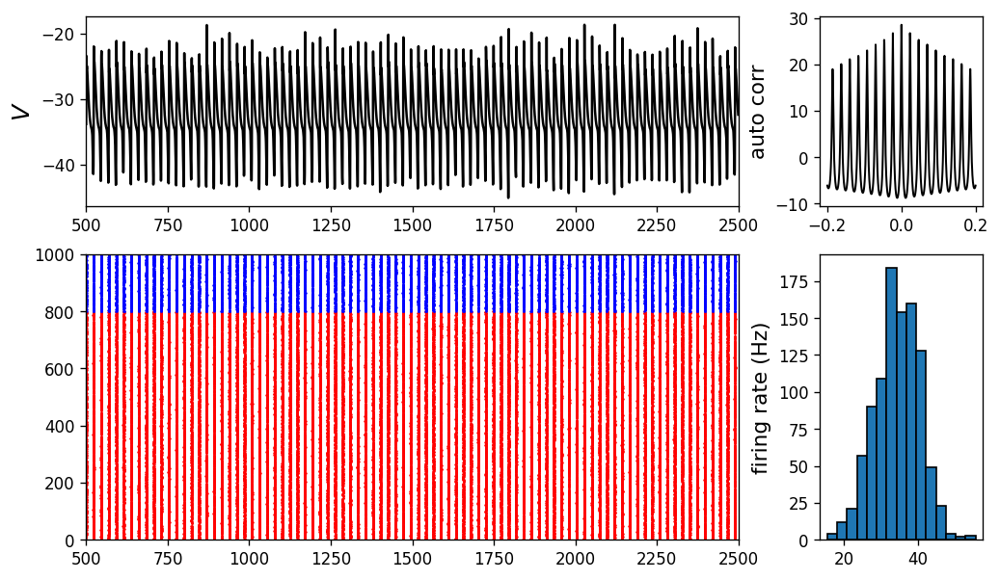

In [1503]:
draw_detail(data)

# pI_nuext_taud

In [2751]:
obj = hhtools.SummaryLoader("./pI_nuext_taud/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 5, 3, 3)
['p_inh', 'nu_ext', 'tau_ds']


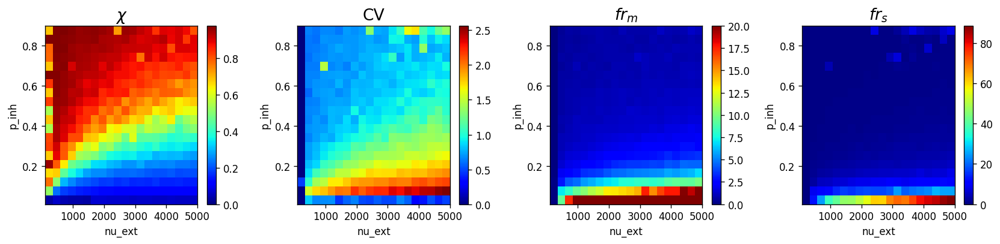

In [2754]:
nd = 3
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,nd,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

# print("beta:", obj.controls["beta"][nb])
# print("nu_ext:", obj.controls["nu_ext"][n_ext])
# print("g_inh: %f, na: %f"%(obj.controls["g_inh"][n_gi], obj.controls["alpha"][na]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=20, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## network oscillation frequency

In [2148]:
from tqdm.notebook import tqdm

im_osc = np.zeros(obj.summary['chi'].shape[:-1])
for n1 in tqdm(range(im_osc.shape[0])):
    for n2 in range(im_osc.shape[1]):
        for n3 in range(im_osc.shape[2]):
            for n4 in range(im_osc.shape[3]):
                data = obj.load_detail(n1, n2, n3, n4)
                im_osc[n1, n2, n3, n4] = hhtools.get_network_frequency(data['vlfp'][0])

  0%|          | 0/20 [00:00<?, ?it/s]

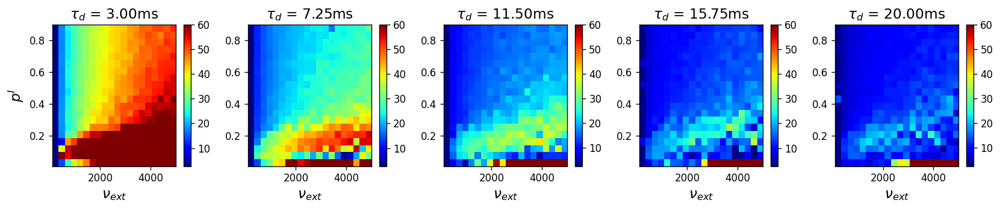

In [2149]:
x = obj.controls["nu_ext"]
y = obj.controls["p_inh"]

fig, axs = plt.subplots(1, 5, dpi=120, figsize=(14, 3))
for nd in range(im_osc.shape[2]):
    plt.axes(axs[nd])
    hhtools.imshow_xy(np.average(im_osc[:,:,nd,:], axis=2), cmap="jet", vmax=60, x=x, y=y)
    
    plt.colorbar()
    plt.title(r"$\tau_d$ = %.2fms"%(obj.controls["tau_ds"][nd]), fontsize=14)
    plt.xlabel(r"$\nu_{ext}$", fontsize=14)
    if nd == 0:
        plt.ylabel(r"$p^I$", fontsize=14)

plt.tight_layout()
plt.show()

## chi

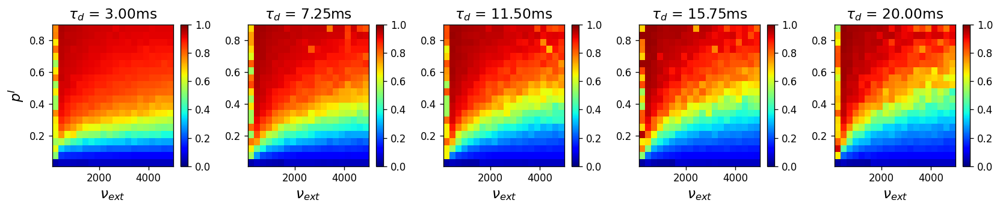

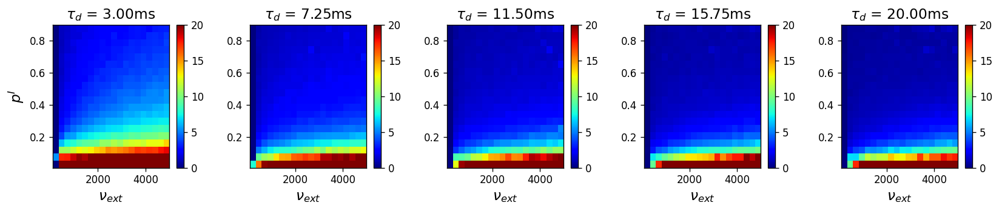

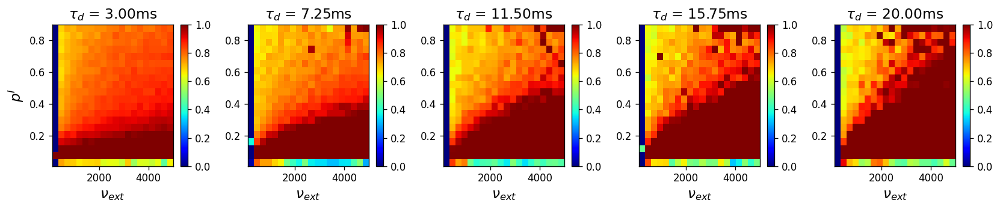

In [2150]:
x = obj.controls["nu_ext"]
y = obj.controls["p_inh"]

vmins = [0, 0, 0]
vmaxs = [1, 20, 1]

for i, var in enumerate(["chi", "frs_m", "cv"]):

    fig, axs = plt.subplots(1, 5, dpi=120, figsize=(14, 3))
    for nd in range(im_osc.shape[2]):
        plt.axes(axs[nd])
        hhtools.imshow_xy(np.average(obj.summary[var][:,:,nd,:,0], axis=2), cmap="jet", vmax=vmaxs[i], vmin=vmins[i], x=x, y=y)

        plt.colorbar()
        plt.title(r"$\tau_d$ = %.2fms"%(obj.controls["tau_ds"][nd]), fontsize=14)
        plt.xlabel(r"$\nu_{ext}$", fontsize=14)
        if nd == 0:
            plt.ylabel(r"$p^I$", fontsize=14)
            
    plt.tight_layout()
    plt.show()

## extract value

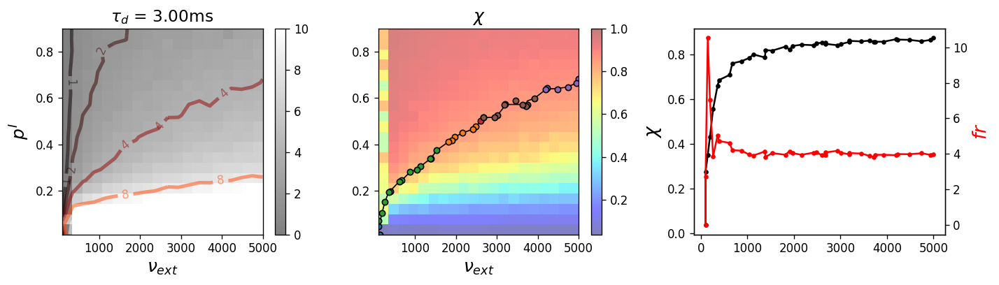

In [2160]:
y = np.array(obj.controls["p_inh"])
x = np.array(obj.controls["nu_ext"])
nd = 0
num_fr = 2

im_frs = np.average(obj.summary["frs_m"][:,:,nd,:,0], axis=2)
im_chi = np.average(obj.summary["chi"][:,:,nd,:,0], axis=2)
fig, axs = plt.subplots(1,3, dpi=120, figsize=(12,3.5))
ax = axs[0]
plt.axes(ax)
hhtools.imshow_xy(im_frs, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.ylabel(r"$p^I$", fontsize=15)

c = plt.contour(x, y, im_frs, [2**n for n in range(5)], linewidths=3, alpha=0.5, cmap="hot", nchunk=10)
ax.clabel(c, inline=1, fontsize=10)
plt.title(r"$\tau_d$ = %.2fms"%(obj.controls["tau_ds"][nd]), fontsize=14)

# get the line
xc, yc = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
xc = np.sort(xc)
yc = np.sort(yc)

plt.axes(axs[1])
hhtools.imshow_xy(im_chi, x=x, y=y, alpha=0.5, cmap="jet", vmax=1, interpolation="none")
plt.plot(xc, yc, 'k-', lw=1)
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    plt.plot(v[:,0], v[:,1], '.', ms=10, markeredgecolor='k')
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.colorbar()
plt.title(r"$\chi$", fontsize=15)
    
plt.axes(axs[2])
# extract firing rate
fr_line, xq, yq = hhtools.extract_value_on_line(im_frs, x, y, xc, yc)
chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc, yc)
plt.plot(xq, chi_line, 'k.-')
plt.ylabel(r"$\chi$", fontsize=16)
plt.twinx()
plt.plot(xq, fr_line, 'r.-')
plt.ylabel(r"$fr$", fontsize=16, color='r')
plt.xlabel(r"$p^I$", fontsize=15)

plt.tight_layout()
plt.show()

### test extract value

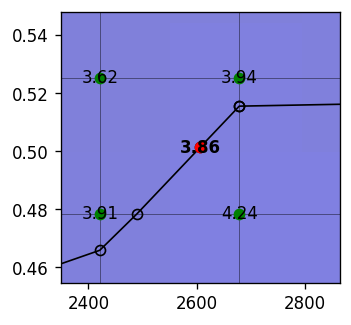

In [2161]:
def draw_grid(x=None, y=None, n0=None):
    if x is None and y is None:
        return
    if x is None:
        x = np.ones_like(y) * n0
    elif y is None:
        y = np.ones_like(x) * n0
    plt.plot(x, y, 'k', lw=0.5, alpha=0.5)
    

def is_in(r0, rlim):
    cond = True
    for i in range(2):
        cond = cond and (rlim[i][0] <= r0[i]) and (rlim[i][1] >= r0[i])
    return cond
    

nid = 21
x0, y0 = xc[nid], yc[nid]

dx = x[1] - x[0]
dy = y[1] - y[0]

plt.figure(dpi=120, figsize=(3,3))
# plt.pcolor(x, y, im_frs, edgecolors=[0.2,0.2,0.2], linewidths=1, cmap='jet', alpha=0.5)
hhtools.imshow_xy(im_frs, x=x, y=y, cmap='jet', alpha=0.5)

for n in range(len(y)):
    draw_grid(x, y=None, n0=y[n])
for n in range(len(x)):
    draw_grid(x=None, y=y, n0=x[n])

plt.plot(xc, yc, 'ko-', lw=1, markerfacecolor='none')
plt.plot(x0, y0, 'ro-', lw=1)

nx0 = np.where(x <= x0)[0][-1]
nx1 = np.where(x >= x0)[0][0]
ny0 = np.where(y <= y0)[0][-1]
ny1 = np.where(y >= y0)[0][0]
nids = np.array([[nx0, ny0], [nx0, ny1], [nx1, ny0], [nx1, ny1]])

plt.plot(x[nids[:,0]], y[nids[:,1]], 'go')

r0 = np.array([x0, y0])
ds = []
frs = []
for n in nids:
    r = np.array([x[n[0]], y[n[1]]])
    d = np.sqrt((r[1] - r0[1])**2 + (r[0] - r0[0])**2)
    ds.append(d)
    frs.append(im_frs[n[1], n[0]])

f0 = 0
for i in range(4):
    f0 += ds[i]/sum(ds) * frs[i]
    
xl = [x0-dx, x0+dx]
yl = [y0-dy, y0+dy]
    
for i in range(len(x)):
    for j in range(len(y)):
        if is_in([x[i], y[j]], [xl, yl]):
            plt.text(x[i], y[j], "%.2f"%(im_frs[j,i]), horizontalalignment='center', verticalalignment='center')

plt.text(x0, y0, "%.2f"%(f0), horizontalalignment='center', verticalalignment='center', fontweight='bold')
            
plt.ylim([y0-dy, y0+dy])
plt.xlim([x0-dx, x0+dx])
plt.show()



### get line function

#### polyfit

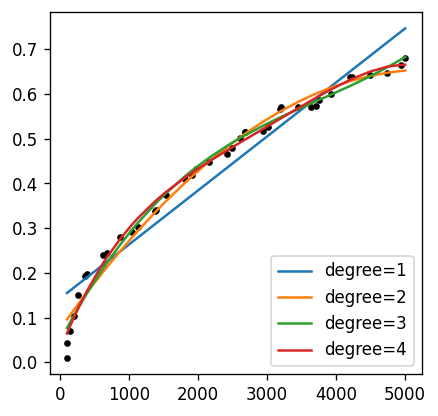

In [2162]:
def fit_poly(xc, yc, num_p=1):
    p = np.polyfit(xc, yc, num_p)
    ynew = 0
    for n in range(num_p+1):
        ynew += p[n] * xc**(num_p-n)
    return ynew, p

plt.figure(dpi=120, figsize=(4,4))
plt.plot(xc, yc, 'k.')

for num_p in range(1, 5):
    ynew, p = fit_poly(xc, yc, num_p)
    plt.plot(xc, ynew, label="degree=%d"%(num_p))
plt.legend(loc="lower right")
plt.show()

#### log fit

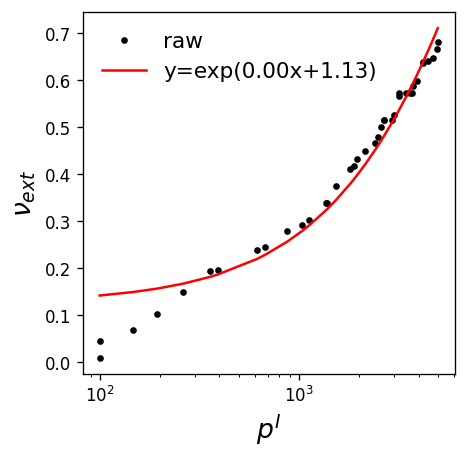

In [2163]:
ytmp = np.exp(yc)
p = np.polyfit(xc, ytmp, 1)

plt.figure(dpi=120, figsize=(4,4), facecolor='w')
plt.plot(xc, yc, 'k.', lw=1, label='raw')
plt.plot(xc, np.log(p[0]*xc + p[1]), c='r', label='y=exp(%.2fx+%.2f)'%(p[0], p[1]))
plt.xlabel(r"$p^I$", fontsize=16)
plt.ylabel(r"$\nu_{ext}$", fontsize=16)
plt.legend(fontsize=13, loc="upper left", edgecolor='none')
plt.xscale("log")
plt.show()

#### square root

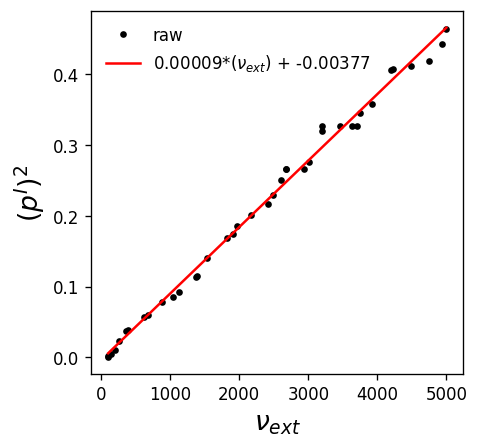

In [2164]:
p = np.polyfit(xc, yc**2, 1)

plt.figure(dpi=120, figsize=(4,4), facecolor='w')
plt.plot(xc, yc**2, 'k.', lw=1, label='raw')
plt.plot(xc, p[0]*xc + p[1], 'r', label=r"%.5f*($\nu_{ext}$) + %.5f"%(p[0], p[1]))
plt.xlabel(r"$\nu_{ext}$", fontsize=16)
plt.ylabel(r"$(p^I)^2$", fontsize=16)
plt.legend(fontsize=10, loc="upper left", edgecolor='none')
plt.show()

yline = np.sqrt(p[0]*xc + p[1])

# pI ~ \sqrt(I)

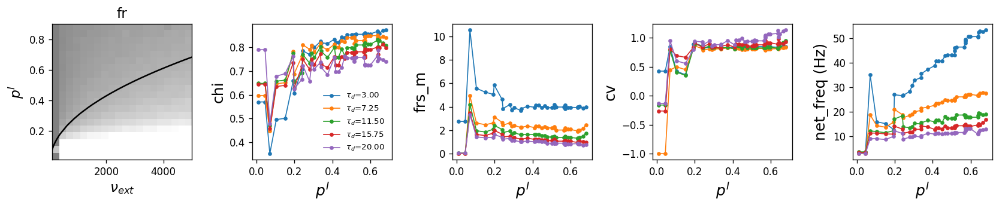

In [2165]:
num_nd = 5
lbs = [r"$\tau_d$=%.2f"%(d) for d in obj.controls["tau_ds"]]

fig, axs = plt.subplots(1, 5, dpi=120, figsize=(14, 3))
plt.axes(axs[0])
hhtools.imshow_xy(im_frs, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.plot(xc, yline, 'k')
plt.ylabel(r"$p^I$", fontsize=14)
plt.xlabel(r"$\nu_{ext}$", fontsize=14)
plt.title(r"fr", fontsize=14)

for i, var in enumerate(["chi", "frs_m", "cv", "net_freq (Hz)"]):
    
    ys_interp = []
    for nd in range(num_nd):
        if i < 3:
            im = np.average(obj.summary[var][:,:,nd,:,0], axis=2)
        else:
            im = np.average(im_osc[:,:,nd,:], axis=2)
        vals, xq, yq = extract_value_on_line(im, x, y, xc, yline)
        ys_interp.append(vals)
    
    axs[i+1].plot(yc, np.transpose(ys_interp), '.-', label=lbs, lw=1)
    axs[i+1].set_xlabel(r"$p^I$", fontsize=15)
    axs[i+1].set_ylabel(var, fontsize=15)
    # axs[i+1].set_legend(lbs)
    plt.axes(axs[i+1])
    
    if i == 0:
        plt.legend(lbs, edgecolor='none', loc="lower right", fontsize=8)

plt.tight_layout()
plt.show()

# gE_gI_sparse

In [2377]:
obj = hhtools.SummaryLoader("./gE_gI_sparse/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 10, 5, 3)
['g_exc', 'g_inh']


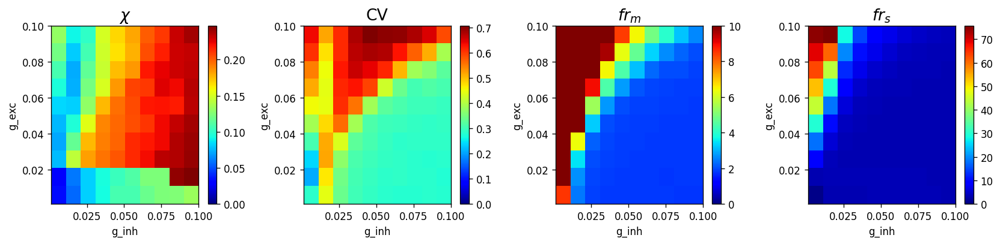

In [2168]:
nd = 0
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2)
    vary = "g_exc"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

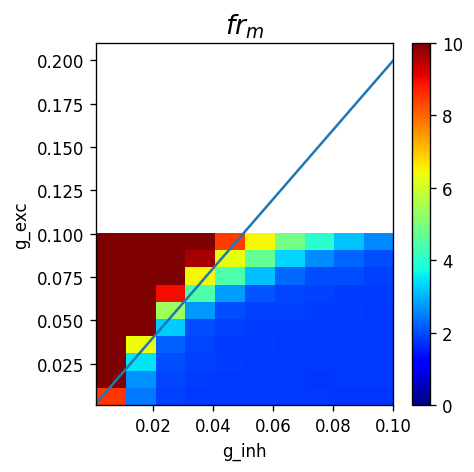

In [2182]:
x = np.array(obj.controls["g_inh"])

plt.figure(dpi=120, figsize=(4,4))
draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.plot(x, 2*x)

plt.show()

# pI_nuext_b_gI

In [2380]:
obj.summary.keys()

dict_keys(['chi', 'cv', 'frs_m', 'frs_s', 'spike_sync'])

In [2381]:
obj = hhtools.SummaryLoader("./pI_nuext_b_gI/")
print(obj.summary['chi'].shape)
print(obj.control_names)

# correction
for key in obj.summary.keys():
    obj.summary[key] = obj.summary[key][:,:,:4,:,:,:]
obj.controls["beta"] = obj.controls["beta"][:4]

(10, 10, 10, 5, 4, 3)
['p_inh', 'nu_ext', 'beta', 'g_inh']


## pI-nu_ext

b = 0.733333, g_inh = 0.105000


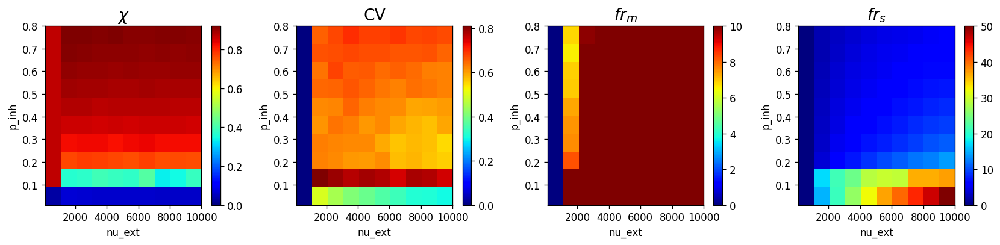

In [2300]:
nb = 1
ng_inh = 2

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,nb,ng_inh,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)

print("b = %f, g_inh = %f"%(obj.controls["beta"][nb], obj.controls["g_inh"][ng_inh]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [2296]:
obj.controls["nu_ext"][1]

1200.0

In [2284]:
im_osc = np.zeros([10, 10, 4])
for np_inh in range(10):
    for n_ext in range(10):
        for i in range(4):
            data = obj.load_detail(np_inh, n_ext, nb, ng_inh, i)
            im_osc[np_inh, n_ext, i] = hhtools.get_network_frequency(data['vlfp'][0])

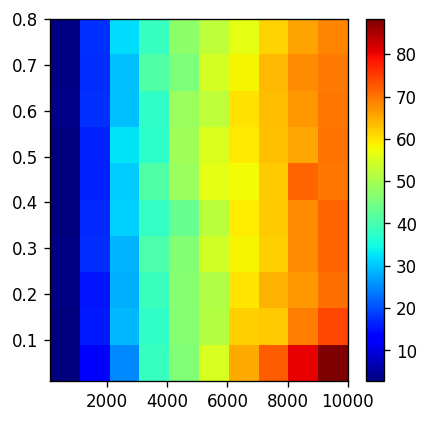

In [2285]:
plt.figure(dpi=120, figsize=(4,4))
hhtools.imshow_xy(np.average(im_osc, axis=2), x=obj.controls["nu_ext"], y=obj.controls["p_inh"], cmap="jet")
plt.colorbar()
plt.show()

## pI-b

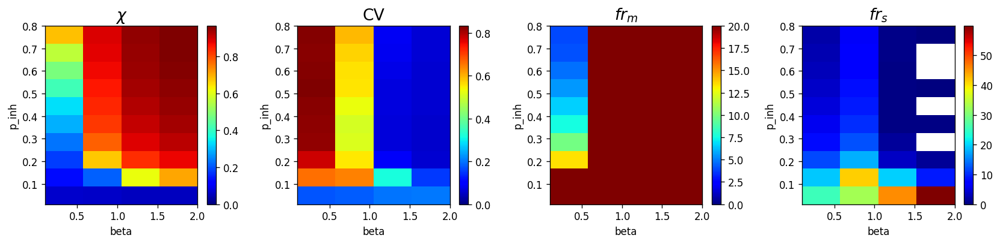

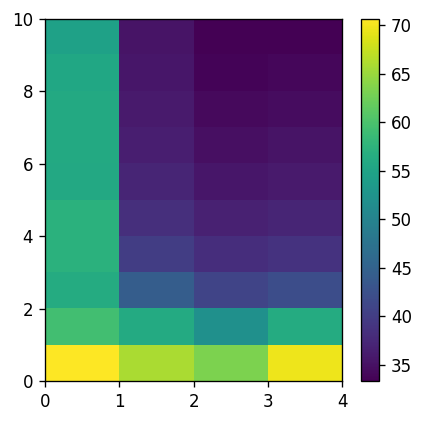

In [2388]:
n_ext = 9
ng_inh = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,n_ext,:,ng_inh,:,0], axis=2)
    vary = "p_inh"
    varx = "beta"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


# print("nu_ext = %f, g_inh = %f"%(obj.controls["nu_ext"][n_ext], obj.controls["g_inh"][ng_inh]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=20, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

im_osc = np.zeros([10, 4, 5])
for n1 in range(10):
    for n2 in range(4):
        for n3 in range(4):
            data = obj.load_detail(n1,n_ext,n2,ng_inh,n3)
            im_osc[n1, n2, n3] = hhtools.get_network_frequency(data['vlfp'][0])

plt.figure(dpi=120, figsize=(4,4))
hhtools.imshow_xy(np.average(im_osc, axis=2))
plt.colorbar()
plt.show()

## b-nu_ext

p_inh = 0.185556, g_inh = 0.105000


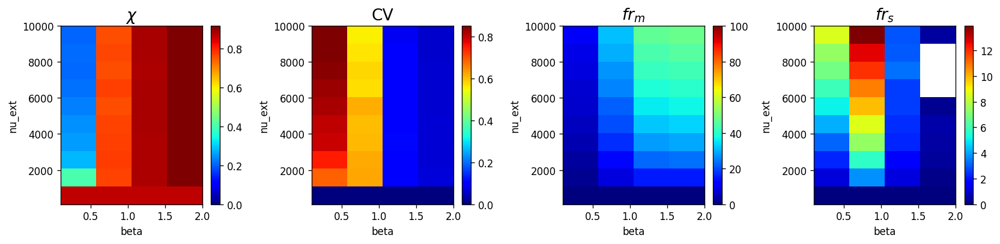

In [2254]:
np_inh = 2
ng_inh = 2
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][np_inh,:,:,ng_inh,:,0], axis=2)
    vary = "nu_ext"
    varx = "beta"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


print("p_inh = %f, g_inh = %f"%(obj.controls["p_inh"][np_inh], obj.controls["g_inh"][ng_inh]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=100, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

## b-gI

nu_ext = 1200.000000, g_inh = 0.200000


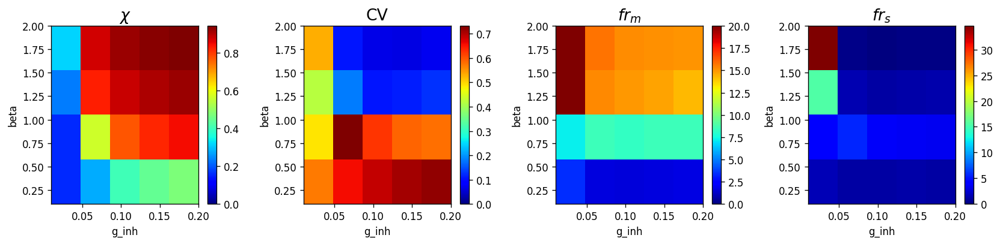

In [2251]:
np_inh = 2
n_ext  = 1
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][np_inh,n_ext,:,:,:,0], axis=2)
    vary = "beta"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


print("nu_ext = %f, g_inh = %f"%(obj.controls["nu_ext"][n_ext], obj.controls["g_inh"][ng_inh]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=20, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# pI_nuext_gI_ver2

In [2421]:
obj = hhtools.SummaryLoader("./pI_nuext_gI_ver2/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(8, 8, 5, 3, 3)
['p_inh', 'nu_ext', 'g_inh']


g_inh = 0.227500


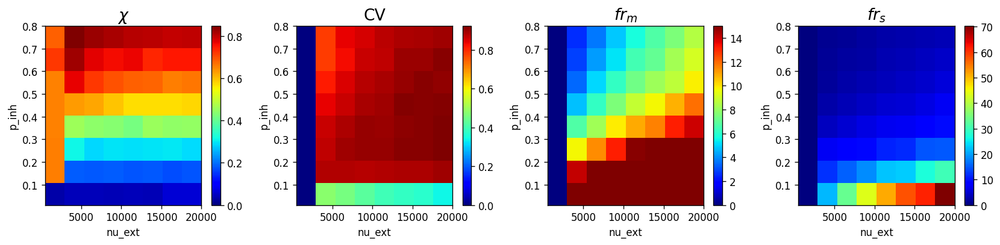

In [2513]:
ng_inh = 3
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,ng_inh,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


print("g_inh = %f"%(obj.controls["g_inh"][ng_inh]))
fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

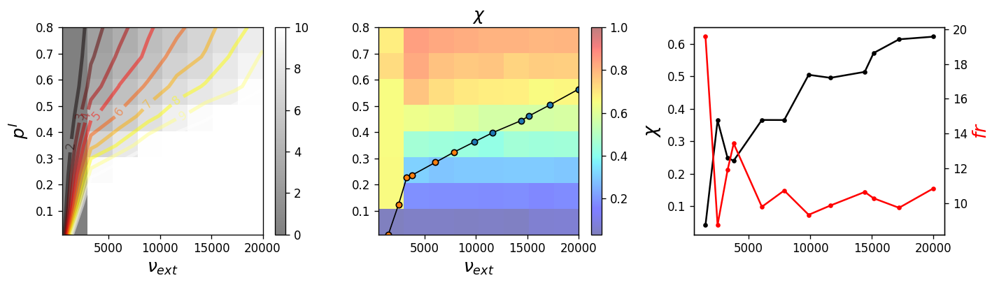

In [2512]:
y = np.array(obj.controls["p_inh"])
x = np.array(obj.controls["nu_ext"])
num_fr = 8

im_frs = np.average(obj.summary["frs_m"][:,:,ng_inh,:,0], axis=2)
im_chi = np.average(obj.summary["chi"][:,:,ng_inh,:,0], axis=2)
fig, axs = plt.subplots(1,3, dpi=120, figsize=(12,3.5))
ax = axs[0]
plt.axes(ax)
hhtools.imshow_xy(im_frs, x=x, y=y, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.ylabel(r"$p^I$", fontsize=15)

c = plt.contour(x, y, im_frs, np.arange(2, 11), linewidths=3, alpha=0.5, cmap="hot", nchunk=10)
ax.clabel(c, inline=1, fontsize=10)
# plt.title(r"$\tau_d$ = %.2fms"%(obj.controls["tau_ds"][nd]), fontsize=14)

# get the line
xc, yc = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
xc = np.sort(xc)
yc = np.sort(yc)

plt.axes(axs[1])
hhtools.imshow_xy(im_chi, x=x, y=y, alpha=0.5, cmap="jet", vmax=1, interpolation="none")
plt.plot(xc, yc, 'k-', lw=1)
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    plt.plot(v[:,0], v[:,1], '.', ms=10, markeredgecolor='k')
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.colorbar()
plt.title(r"$\chi$", fontsize=15)
    
plt.axes(axs[2])
# extract firing rate
fr_line, xq, yq = hhtools.extract_value_on_line(im_frs, x, y, xc, yc)
chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc, yc)
plt.plot(xq, chi_line, 'k.-')
plt.ylabel(r"$\chi$", fontsize=16)
plt.twinx()
plt.plot(xq, fr_line, 'r.-')
plt.ylabel(r"$fr$", fontsize=16, color='r')
plt.xlabel(r"$p^I$", fontsize=15)

plt.tight_layout()
plt.show()

In [2508]:
im_osc = np.zeros([8, 8, 3])
for n1 in range(8):
    for n2 in range(8):
        for n3 in range(3):
            data = obj.load_detail(n1, n2, ng_inh, n3)
            im_osc[n1,n2,n3] = hhtools.get_network_frequency(data['vlfp'][0])

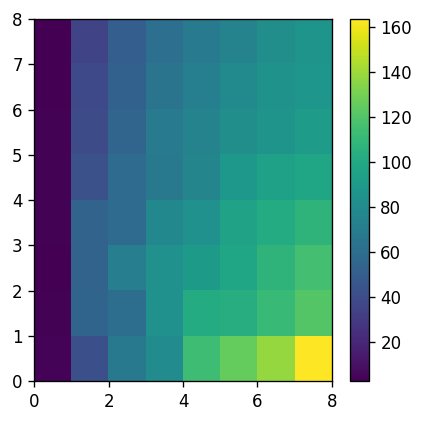

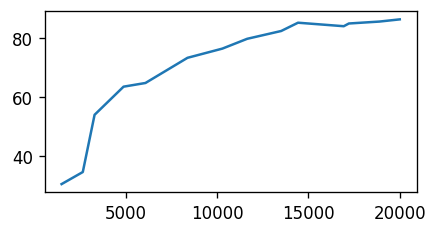

In [2509]:
plt.figure(dpi=120, figsize=(4,4))
hhtools.imshow_xy(np.average(im_osc, axis=2))
plt.colorbar()
plt.show()

vary = "p_inh"
varx = "nu_ext"

y = obj.controls[vary]
x = obj.controls[varx]
zline, _, _ = hhtools.extract_value_on_line(np.average(im_osc, axis=2), x, y, xc, yc)

plt.figure(dpi=120, figsize=(4,2))
plt.plot(xc, zline)
plt.show()

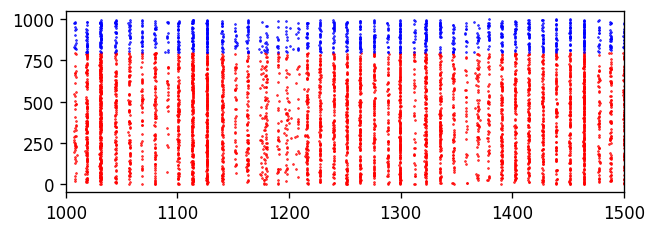

In [2510]:
data = obj.load_detail(7, 7, ng_inh, 0)
plt.figure(dpi=120, figsize=(6, 2))
hhtools.draw_spk(data['step_spk'], color_ranges=[800, 1000], colors=["r", "b"])
plt.xlim([1e3, 1.5e3])
plt.show()

# pI_nuext_ver2

## temporal code: 합치기

In [5148]:
obj = hhtools.SummaryLoader("./pI_nuext_ver4/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(40, 49, 5, 3)
['p_inh', 'nu_ext']


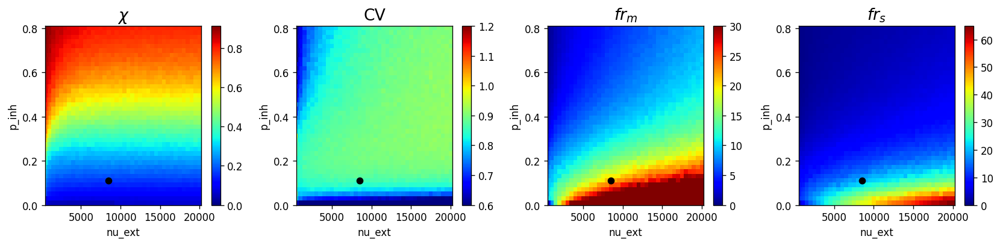

In [5149]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x[25], y[5], 'ko')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=30, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

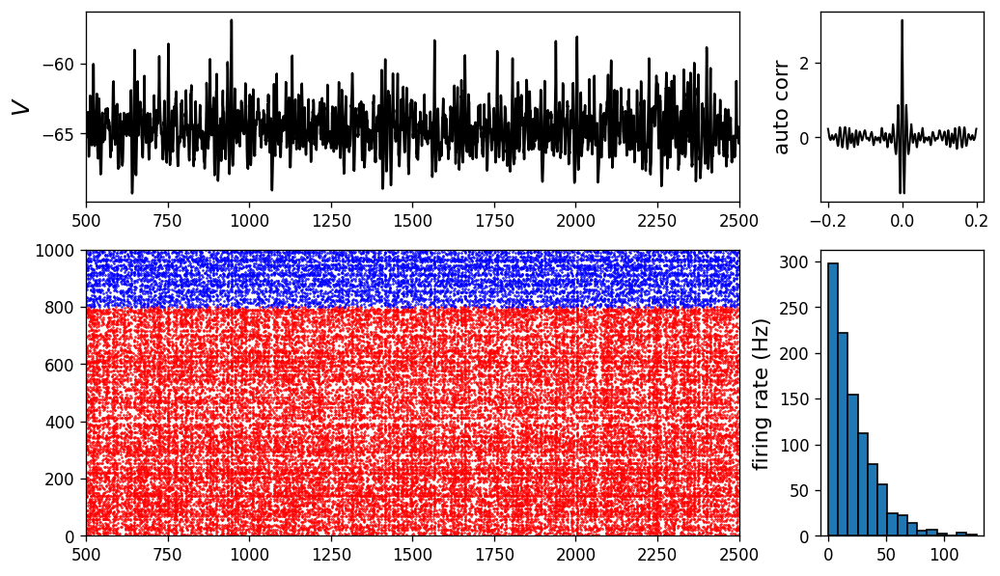

In [4760]:
data = obj.load_detail(5, 25, 0)
draw_detail(data)

In [5150]:
s = np.std(obj.summary["chi"][:,:,:,0], axis=2)

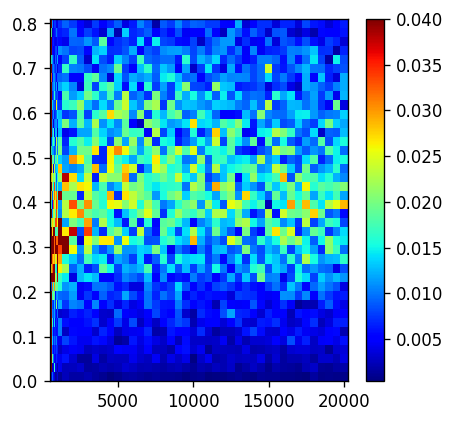

In [5151]:
plt.figure(dpi=120, figsize=(4,4))
plt.pcolormesh(obj.controls["nu_ext"], obj.controls["p_inh"], s, cmap="jet", vmax=0.04)
plt.colorbar()
plt.show()

In [4196]:
im_osc = np.zeros(obj.summary['chi'].shape[:3])
for n1 in range(im_osc.shape[0]):
    for n2 in range(im_osc.shape[1]):
        for n3 in range(im_osc.shape[2]):
            data = obj.load_detail(n1, n2, n3)
            im_osc[n1, n2, n3] = hhtools.get_network_frequency(data['vlfp'][0])

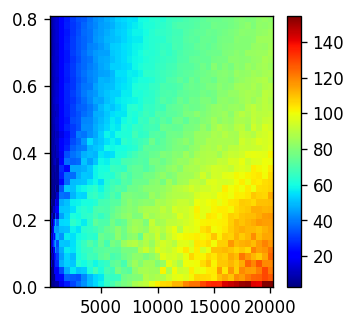

In [4197]:
y = obj.controls["p_inh"]
x = obj.controls["nu_ext"]

plt.figure(dpi=120, figsize=(3,3))
plt.pcolormesh(x, y, np.average(im_osc, axis=2), cmap='jet')
plt.colorbar()
plt.show()

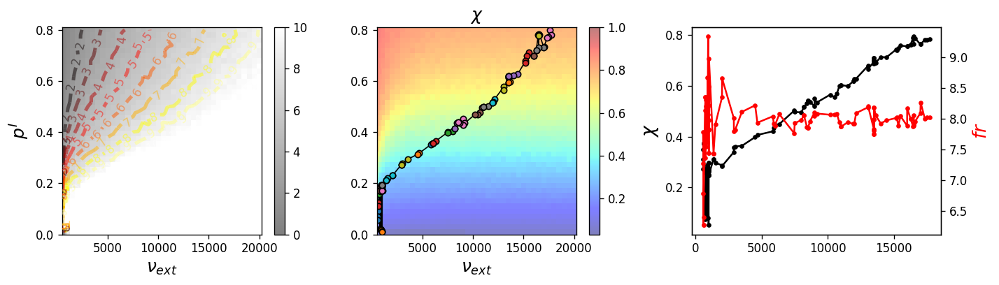

In [5152]:
y = np.array(obj.controls["p_inh"])
x = np.array(obj.controls["nu_ext"])
num_fr = 6

im_frs = np.average(obj.summary["frs_m"][:,:,:,0], axis=2)
im_chi = np.average(obj.summary["chi"][:,:,:,0], axis=2)
fig, axs = plt.subplots(1,3, dpi=120, figsize=(12,3.5))
ax = axs[0]
plt.axes(ax)
plt.pcolormesh(x, y, im_frs, alpha=0.5, cmap="gray", vmax=10)
plt.colorbar()
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.ylabel(r"$p^I$", fontsize=15)

frs = np.arange(2, 11)
c = plt.contour(x, y, im_frs, frs, linewidths=3, alpha=0.5, cmap="hot", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)
# plt.title(r"$\tau_d$ = %.2fms"%(obj.controls["tau_ds"][nd]), fontsize=14)

# get the line
xc, yc = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc.extend(v[:,0])
    yc.extend(v[:,1])
ind = np.argsort(xc)
xc = np.array(xc)[ind]
yc = np.array(yc)[ind]

plt.axes(axs[1])
plt.pcolormesh(x, y, im_chi, alpha=0.5, cmap="jet", vmax=1)
# hhtools.imshow_xy(im_chi, x=x, y=y, alpha=0.5, cmap="jet", vmax=1, interpolation="none")
plt.plot(xc, yc, 'k-', lw=1)
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    plt.plot(v[:,0], v[:,1], '.', ms=10, markeredgecolor='k')
plt.xlabel(r"$\nu_{ext}$", fontsize=15)
plt.colorbar()
plt.title(r"$\chi$", fontsize=15)
    
plt.axes(axs[2])
# extract firing rate
fr_line, xq, yq = hhtools.extract_value_on_line(im_frs, x, y, xc, yc)
chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc, yc)
plt.plot(xq, chi_line, 'k.-')
plt.ylabel(r"$\chi$", fontsize=16)
plt.twinx()
plt.plot(xq, fr_line, 'r.-')
plt.ylabel(r"$fr$", fontsize=16, color='r')
plt.xlabel(r"$p^I$", fontsize=15)

plt.tight_layout()
plt.show()

In [5155]:
len(xq)

102

p_inh: 0.200000, nu_ext: 1000.000000
chi: 0.296732
frs: 7.161994
cvs: 0.855775


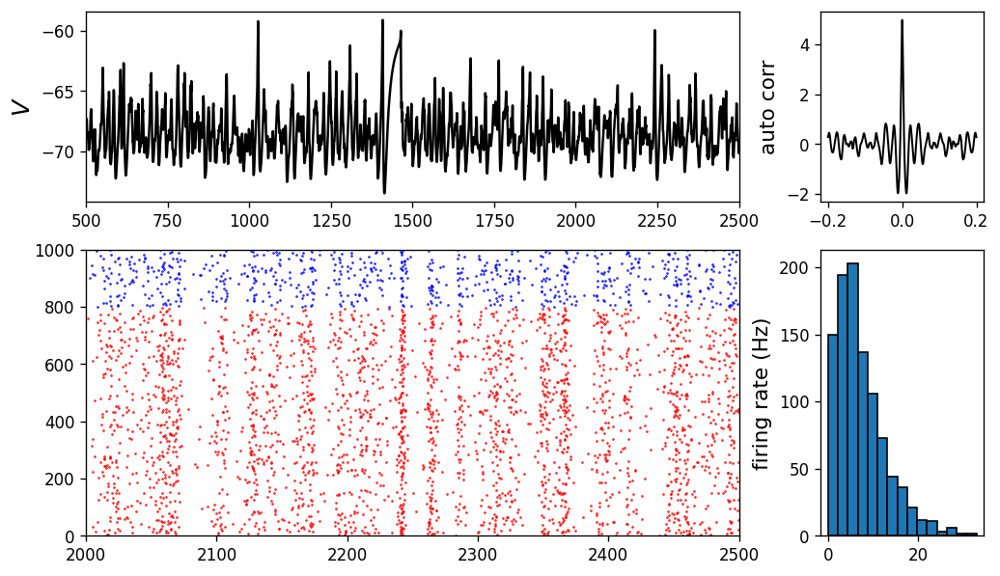

In [5157]:
x = obj_sub.controls["nu_ext"]
y = obj_sub.controls["p_inh"]

nid = 100
n1 = np.argmin(np.abs(y - yq[nid]))
n2 = np.argmin(np.abs(x - xq[nid]))
print("p_inh: %f, nu_ext: %f"%(obj_sub.controls["p_inh"][n1], obj_sub.controls["nu_ext"][n2]))

print("chi:", obj_sub.summary["chi"][n1, n2, 0, 0])
print("frs:", obj_sub.summary["frs_m"][n1, n2, 0, 0])
print("cvs:", obj_sub.summary["cv"][n1, n2, 0, 0])

data = obj_sub.load_detail(n1, n2, 0)

draw_detail(data, xl=(2000, 2500))

In [4199]:
def get_palette(cmap="jet"):
    from matplotlib.cm import get_cmap
    return get_cmap(cmap)

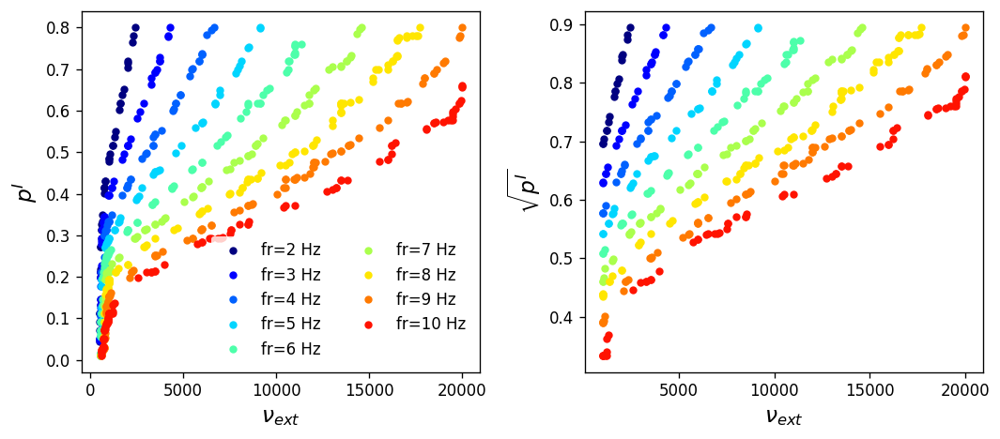

In [4356]:
xc_frs = []
yc_frs = []
num_frs = len(c.collections)

for nf in range(num_frs):
    xc_tmp, yc_tmp = [], []
    for p in c.collections[nf].get_paths():
        v = p.vertices
        xc_tmp.extend(v[:,0])
        yc_tmp.extend(v[:,1])
    xc_frs.append(np.sort(xc_tmp))
    yc_frs.append(np.sort(yc_tmp))
    
fig, axs = plt.subplots(1, 2, dpi=120, figsize=(9, 4))
cmap = get_palette("jet")

plt.axes(axs[0])
for n in range(num_frs):
    idx = (xc_frs[n] >= 0)
    plt.plot(xc_frs[n][idx], yc_frs[n][idx], 'o', markersize=4, c=cmap(n/num_frs), label="fr=%d Hz"%(frs[n]))
plt.xlabel(r"$\nu_{ext}$", fontsize=14)
plt.ylabel(r"$p^I$", fontsize=14)
plt.legend(fontsize=10, loc="lower right", edgecolor="none", ncol=2)
# plt.ylim([0.2, 0.9])

plt.axes(axs[1])
for n in range(num_frs):
    idx = (xc_frs[n] >= 1000)
    plt.plot(xc_frs[n][idx], np.sqrt(yc_frs[n][idx]), 'o', markersize=4, c=cmap(n/num_frs))
plt.xlabel(r"$\nu_{ext}$", fontsize=14)
plt.ylabel(r"$\sqrt{p^I}$", fontsize=14)
# plt.ylim([0.4, 1])
# plt.xlim([50, 2000])
# plt.ylim([0, 0.4])

plt.tight_layout()
plt.show()

In [4357]:
idx = (xc >= 1000) & (xc < 18000)
fr_line = np.array(fr_line)
chi_line = np.array(chi_line)
osc_line, xq, yq = hhtools.extract_value_on_line(np.average(im_osc, axis=2), x, y, xc, yc)
osc_line = np.array(osc_line)

[25903.99048955 -2645.9744876 ]


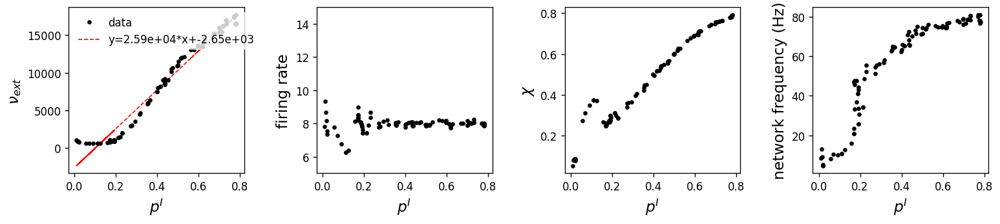

In [4358]:
# xc = xc[1:]; yc = yc[1:]
fr_line = np.array(fr_line)
chi_line = np.array(chi_line)
osc_line, xq, yq = hhtools.extract_value_on_line(np.average(im_osc, axis=2), x, y, xc, yc)
osc_line = np.array(osc_line)
xq = np.array(xq)
yq = np.array(yq)
idx = (yq >= 0.)
# idx = (xq >= 1300) & (xq < 18000)

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(13, 3.))

plt.axes(axs[0])
plt.plot(yq[idx], xq[idx], 'k.', label="data")
plt.ylabel(r"$\nu_{ext}$", fontsize=14)
plt.xlabel(r"$p^I$", fontsize=14)
# plt.yticks(np.linspace(xq[idx][0], xq[idx][-1], 5))
# plt.xticks(np.linspace(yq[idx][0], yq[idx][-1], 5))

p_fit = np.polyfit(yq[idx], xq[idx], 1)
plt.plot(yq[idx], p_fit[0]*yq[idx] + p_fit[1], 'r', zorder=-1, lw=1, linestyle='--', label="y=%.3g*x+%.3g"%(p_fit[0], p_fit[1]))
plt.legend(loc="upper left", fontsize=10, edgecolor='none')
print(p_fit)

plt.axes(axs[1])
plt.plot(yq[idx], fr_line[idx], 'k.')
plt.ylim([5, 15])
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("firing rate", fontsize=14)

plt.axes(axs[2])
plt.plot(yq[idx], chi_line[idx], 'k.')
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel(r"$\chi$", fontsize=14)

plt.axes(axs[3])
plt.plot(yq[idx], osc_line[idx], 'k.')
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel(r"network frequency (Hz)", fontsize=14)

plt.tight_layout()
plt.show()

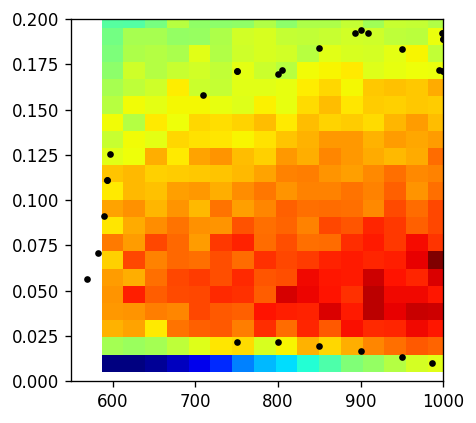

In [4111]:
plt.figure(dpi=120, figsize=(4,4))
plt.pcolormesh(x, y, im_frs, cmap="jet")
plt.plot(xq, yq, 'k.')
plt.xlim([550, 1000])
plt.ylim([0, 0.2])
plt.show()

## sub

In [5137]:
obj_sub = hhtools.SummaryLoader("./pI_nuext_ver4_sub/")
print(obj_sub.summary['chi'].shape)
print(obj_sub.control_names)
print(obj_sub.controls["p_inh"][0], obj_sub.controls["p_inh"][-1])

(20, 21, 8, 3)
['p_inh', 'nu_ext']
0.01 0.2


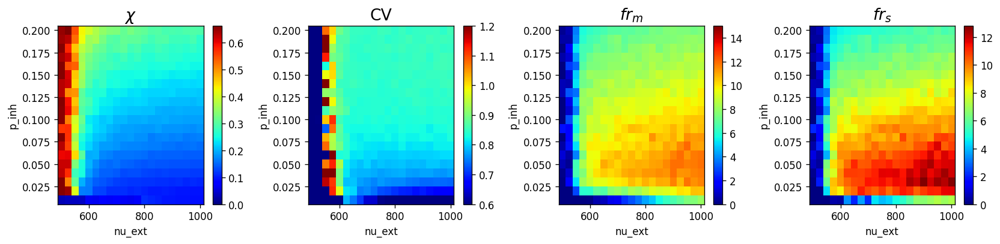

In [5138]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj_sub.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj_sub.controls[vary]
    x = obj_sub.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

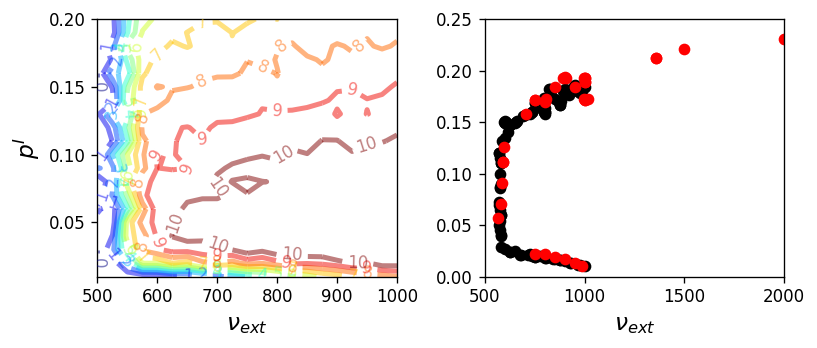

In [5139]:
def sort_line(x, y):
    ind = np.argsort(x)
    x = np.array(x)[ind]
    y = np.array(y)[ind]
    return x, y

y = np.array(obj_sub.controls["p_inh"])
x = np.array(obj_sub.controls["nu_ext"])
num_fr = 8
frs = np.arange(11)
im_frs = np.average(obj_sub.summary["frs_m"][:,:,:,0], axis=2)
im_chi = np.average(obj_sub.summary["chi"][:,:,:,0], axis=2)

fig, axs = plt.subplots(1, 2, dpi=120, figsize=(7,3))

plt.axes(axs[0])
c = plt.contour(x, y, im_frs, frs, linewidths=3, alpha=0.5, cmap="jet", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)
plt.xlabel(r"$\nu_{ext}$", fontsize=14)
plt.ylabel(r"$p^I$", fontsize=14)

xc_sub, yc_sub = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc_sub.extend(v[:,0])
    yc_sub.extend(v[:,1])
xc_sub = np.array(xc_sub)
yc_sub = np.array(yc_sub)
    
# split by two types of ~
# id1 = (yc <= 0.05)
# xc_s, yc_s = sort_line(xc[id1], yc[id1])
# xc_l, yc_l = sort_line(xc[~id1], yc[~id1])

plt.axes(axs[1])
plt.plot(xc_sub, yc_sub, 'ko')
plt.plot(xc, yc, 'ro')
plt.xlabel(r"$\nu_{ext}$", fontsize=14)
plt.xlim([500, 2000])
plt.ylim([0, 0.25])

plt.tight_layout()
plt.show()

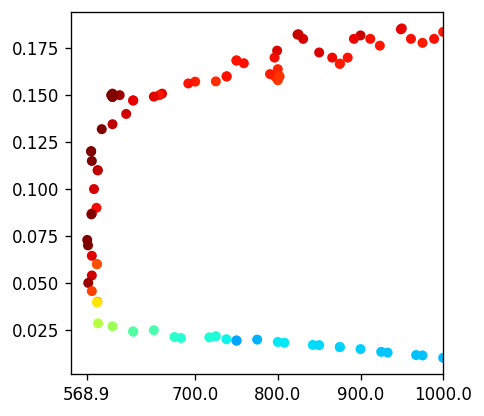

(array([13, 30, 36]),)


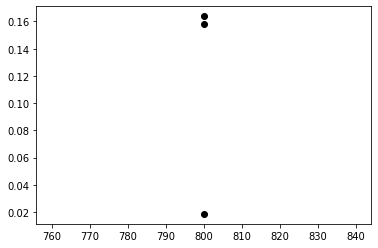

In [5140]:
cmap = get_palette("jet")
cs = [cmap(c*0.3) for c in chi_line]

plt.figure(dpi=120, figsize=(4,4))

chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc_sub, yc_sub)
plt.scatter(xc_sub, yc_sub, c=chi_line, facecolor="none", edgecolor="none", cmap="jet", vmin=0, vmax=0.3)
xt = np.array([min(xc)] +list(plt.xticks()[0])[2:])
plt.xticks(xt)
plt.xlim([550, 1000])
plt.show()

nid = np.argsort(chi_line)
xc_sub = xc_sub[nid]
yc_sub = yc_sub[nid]

xc_target = 800
targets = np.where(np.abs(xc_sub - xc_target) < 1e-3)
plt.plot(xc_sub[targets], yc_sub[targets], 'ko')
print(targets)

In [5147]:
len(yc_sub)

92

p_inh: 0.020000, nu_ext: 750.000000
chi: 0.121654
frs: 6.785199
cvs: 0.698782


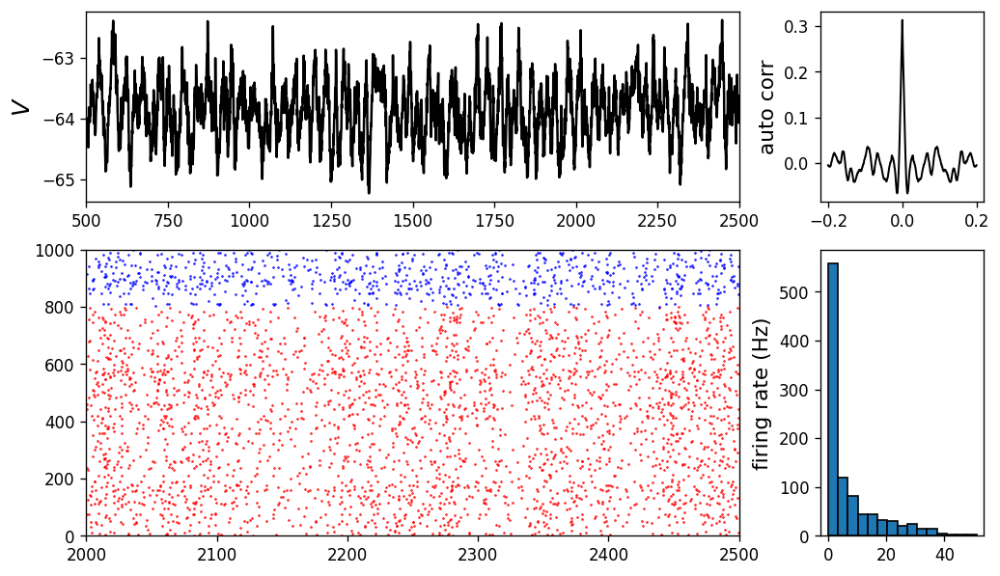

In [5158]:
x = obj_sub.controls["nu_ext"]
y = obj_sub.controls["p_inh"]

nid = 0
n1 = np.argmin(np.abs(y - yc_sub[nid]))
n2 = np.argmin(np.abs(x - xc_sub[nid]))
print("p_inh: %f, nu_ext: %f"%(obj_sub.controls["p_inh"][n1], obj_sub.controls["nu_ext"][n2]))

print("chi:", obj_sub.summary["chi"][n1, n2, 0, 0])
print("frs:", obj_sub.summary["frs_m"][n1, n2, 0, 0])
print("cvs:", obj_sub.summary["cv"][n1, n2, 0, 0])

data = obj_sub.load_detail(n1, n2, 0)

draw_detail(data, xl=(2000, 2500))

p_inh: 0.160000, nu_ext: 800.000000
chi: 0.243086
frs: 8.396396
cvs: 0.843252


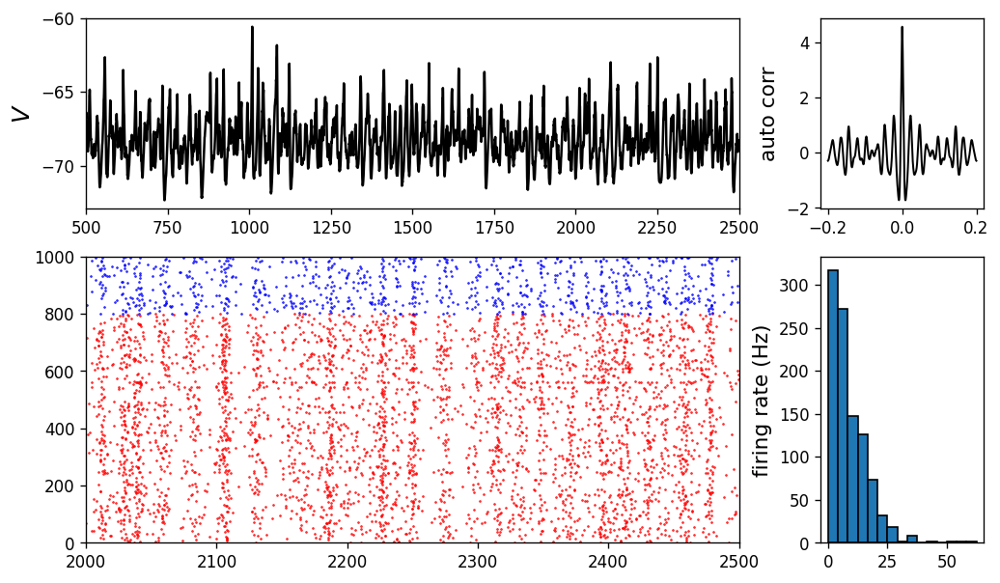

In [4516]:
x = obj_sub.controls["nu_ext"]
y = obj_sub.controls["p_inh"]

# nid = 30
# n1 = np.argmin(np.abs(y - yc_sub[nid]))
# n2 = np.argmin(np.abs(x - xc_sub[nid]))
print("p_inh: %f, nu_ext: %f"%(obj_sub.controls["p_inh"][n1], obj_sub.controls["nu_ext"][n2]))

print("chi:", obj_sub.summary["chi"][n1, n2, 0, 0])
print("frs:", obj_sub.summary["frs_m"][n1, n2, 0, 0])
print("cvs:", obj_sub.summary["cv"][n1, n2, 0, 0])

data = obj_sub.load_detail(n1, n2, 0)

draw_detail(data, xl=(2000, 2500))

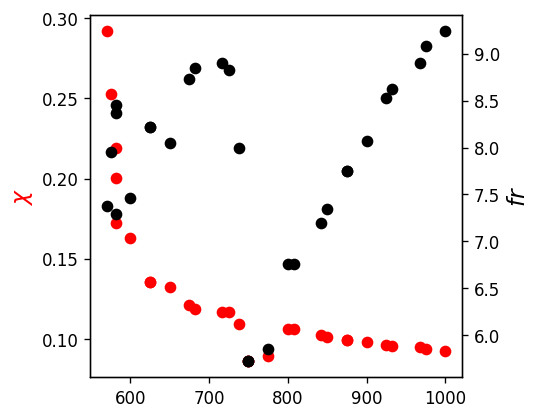

In [4507]:
def get_summary(xc, yc):
    y = np.array(obj_sub.controls["p_inh"])
    x = np.array(obj_sub.controls["nu_ext"])
    
    fr_line, xq, yq = hhtools.extract_value_on_line(im_frs, x, y, xc, yc)
    chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc, yc)
    return fr_line, chi_line, xq, yq


fr_line, chi_line, xq_s, yq_s = get_summary(xc_s, yc_s)

plt.figure(dpi=120, figsize=(4,4))
plt.plot(xc_s, chi_line, 'ro')
plt.ylabel(r"$\chi$", fontsize=14, color="r")
plt.twinx()

plt.plot(xc_s, fr_line, 'ko')
plt.ylabel(r"$fr$", fontsize=14, color="k")
plt.show()

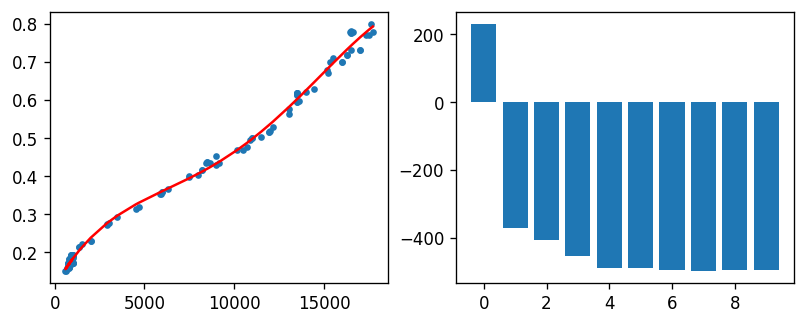

In [4285]:
# use pI > 0.15
nid = yc_sub > 0.15
xc_sub1 = xc_sub[nid]
yc_sub1 = yc_sub[nid]

nid = yc > 0.15
xc_sub2 = xc[nid]
yc_sub2 = yc[nid]

xc_tot = np.array(list(xc_sub1) + list(xc_sub2))
yc_tot = np.array(list(yc_sub1) + list(yc_sub2))

plt.figure(dpi=120, figsize=(8,3))
ax = plt.subplot(121)
plt.plot(xc_tot, yc_tot, '.')

def get_yfit(x, y, p_fit):
    yfit = np.zeros_like(x)
    p = np.polyfit(x, y, p_fit)
    for n in range(p_fit+1):
        yfit += p[n] * x**(p_fit-n)
    return yfit

num_fit = 10
aic = np.zeros(num_fit)
for p_fit in range(num_fit):
    yfit = get_yfit(xc_tot, yc_tot, p_fit)
    aic[p_fit] += len(yfit)*np.log(np.sum((yfit - yc_tot)**2)) + 2*p_fit

# plt.figure(dpi=120, figsize=(4,4))
plt.subplot(122)
plt.bar(np.arange(num_fit), aic)
ax.plot(xc_tot, get_yfit(xc_tot, yc_tot, 4), 'r')
    
# plt.plot(xc_tot, get_yfit(, c='r')
plt.show()

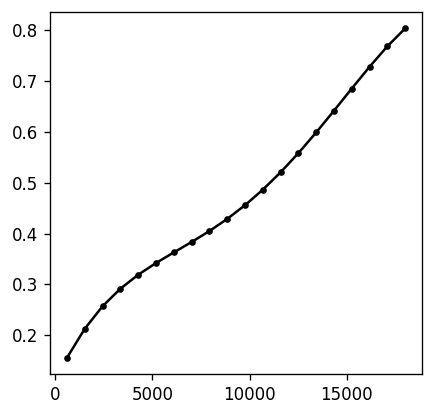

In [4303]:
x_fit = np.linspace(600, 18000, 20)
y_fit = np.zeros_like(x_fit)

order = 4
fit_param = np.polyfit(xc_tot, yc_tot, order)
for n in range(order+1):
    y_fit += fit_param[n] * x_fit**(order-n)
    
plt.figure(dpi=120, figsize=(4,4))
plt.plot(x_fit, y_fit, 'k.-')
plt.show()

p_inh: 0.160000, nu_ext: 600.000000
chi: 0.308426
frs: 7.712794


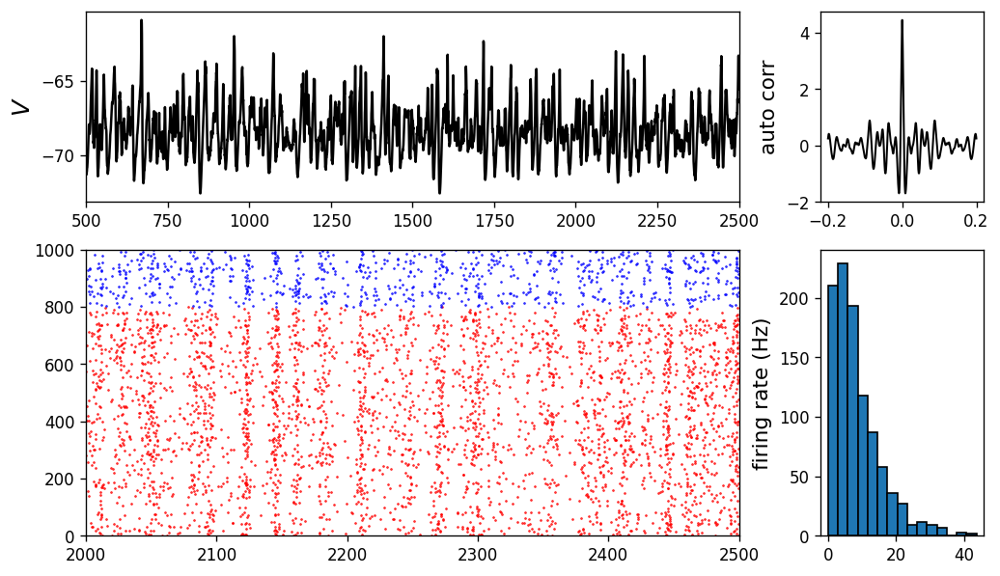

In [4321]:
x = obj_sub.controls["nu_ext"]
y = obj_sub.controls["p_inh"]

nid = 0
n1 = np.argmin(np.abs(y - y_fit[nid]))
n2 = np.argmin(np.abs(x - x_fit[nid]))
print("p_inh: %f, nu_ext: %f"%(obj_sub.controls["p_inh"][n1], obj_sub.controls["nu_ext"][n2]))

print("chi:", obj_sub.summary["chi"][n1, n2, 0, 0])
print("frs:", obj_sub.summary["frs_m"][n1, n2, 0, 0])

data = obj_sub.load_detail(n1, n2, 0)

draw_detail(data, xl=(2000, 2500))

In [3718]:
yfft, f, t = hhtools.get_stfft(data["vlfp"][0], data["ts"], 2000, f_range=[20, 110], mbin_t=0.005, wbin_t=0.5)

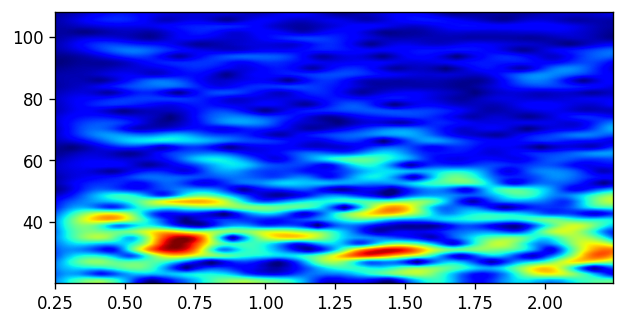

In [3719]:
plt.figure(dpi=120, figsize=(6, 3))
# plt.pcolormesh(t, f, yfft, cmap="jet", interpolation="spline16")
hhtools.imshow_xy(yfft, x=t, y=f, cmap="jet", interpolation="spline16")
# plt.ylim([60, 100])
plt.show()

# pI_nuext_slow

In [4547]:
obj_slow = hhtools.SummaryLoader("./pI_nuext_slow/")
print(obj_slow.summary['chi'].shape)
print(obj_slow.control_names)
print(obj_slow.controls["p_inh"][0], obj_slow.controls["p_inh"][-1])

(21, 21, 4, 3)
['p_inh', 'nu_ext']
0.01 0.8


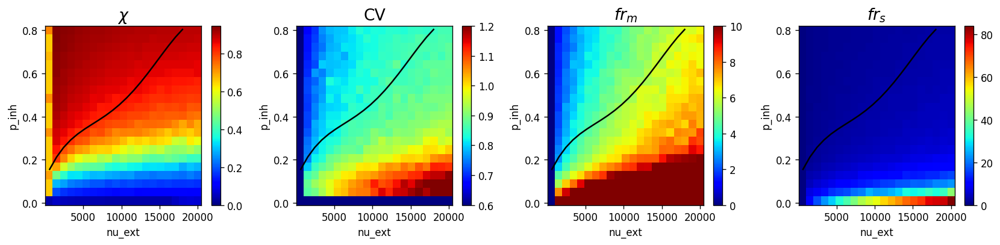

In [4548]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj_slow.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj_slow.controls[vary]
    x = obj_slow.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

In [4549]:
print("relation between pE and nu_ext")
x_fit, y_fit * 0.1

relation between pE and nu_ext


(array([  600.        ,  1515.78947368,  2431.57894737,  3347.36842105,
         4263.15789474,  5178.94736842,  6094.73684211,  7010.52631579,
         7926.31578947,  8842.10526316,  9757.89473684, 10673.68421053,
        11589.47368421, 12505.26315789, 13421.05263158, 14336.84210526,
        15252.63157895, 16168.42105263, 17084.21052632, 18000.        ]),
 array([0.01557051, 0.02129133, 0.02571109, 0.02915055, 0.03189633,
        0.03420092, 0.03628267, 0.03832583, 0.0404805 , 0.04286266,
        0.04555416, 0.04860273, 0.05202197, 0.05579134, 0.05985619,
        0.06412772, 0.06848303, 0.07276507, 0.07678268, 0.08031056]))

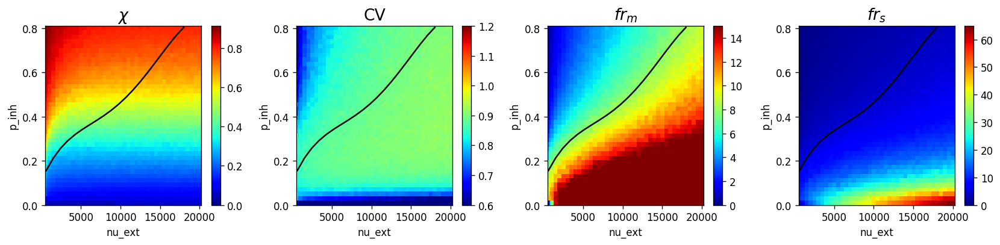

In [4552]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# pI_nuext_ab_syn2
- Raw data are in optimizer

In [5125]:
obj = hhtools.load_summary("./pI_nuext_ab_syn2.pkl")
print(obj.summary['chi'].shape)
print(obj.control_names)

(21, 21, 5, 5, 2, 4, 3)
['p_inh', 'nu_ext', 'alpha_set', 'beta_set', 'id_syn']


alpha: 0.3, beta: 0.1625


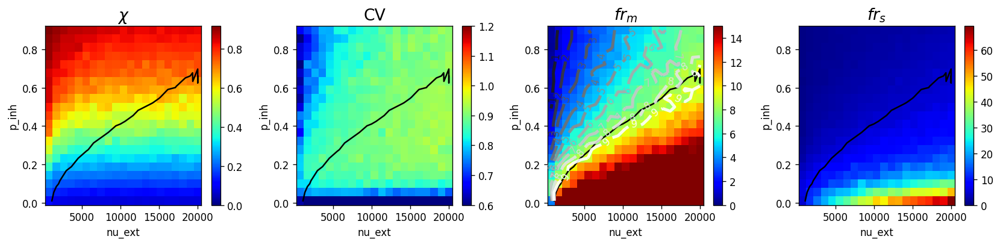

In [5136]:
na = 4
nb = 3
nid_syn = 0

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,na,nb,nid_syn,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(xc_tmp, yc_tmp, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    return im, x, y

print(f'alpha: {obj.controls["alpha_set"][na]}, beta: {obj.controls["beta_set"][nb]}')

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); im_chi, _, _ = draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]);

frs = np.arange(10)
im_frs, x, y = draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
c = plt.contour(x, y, im_frs, frs, linewidths=3, alpha=0.9, cmap="gray", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)

plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

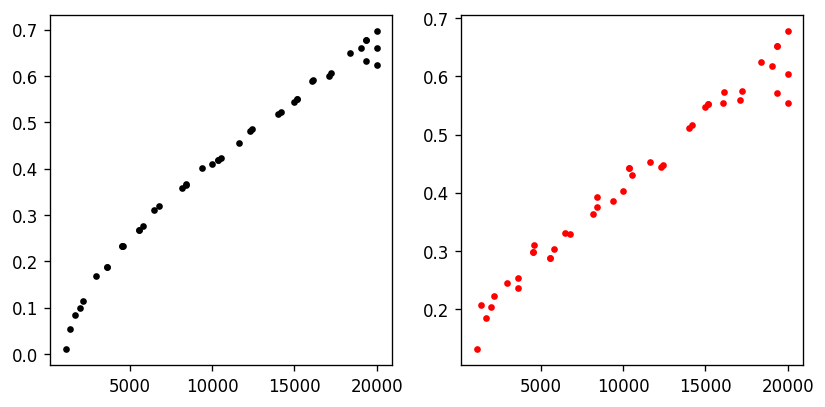

In [5131]:
num_fr = 6
xc_tmp, yc_tmp = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc_tmp.extend(v[:,0])
    yc_tmp.extend(v[:,1])
xc_tmp = np.array(xc_tmp)
yc_tmp = np.array(yc_tmp)

ind = np.argsort(xc_tmp)
xc_tmp = xc_tmp[ind]
yc_tmp = yc_tmp[ind]

chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc_tmp, yc_tmp)

plt.figure(dpi=120, figsize=(7,3.5))
plt.subplot(121)
plt.plot(xc_tmp, yc_tmp, 'k.')

plt.subplot(122)
plt.plot(xq, chi_line, 'r.')

plt.tight_layout()
plt.show()

In [5128]:
x = obj.controls["nu_ext"]
y = obj.controls["p_inh"]

nid = 3
n1 = np.argmin(np.abs(y - yc_sub[nid]))
n2 = np.argmin(np.abs(x - xc_sub[nid]))
print("p_inh: %f, nu_ext: %f"%(obj.controls["p_inh"][n1], obj.controls["nu_ext"][n2]))

print("chi:", obj.summary["chi"][n1, n2, 0, 0])
print("frs:", obj.summary["frs_m"][n1, n2, 0, 0])
print("cvs:", obj.summary["cv"][n1, n2, 0, 0])

data = obj.load_detail(n1, n2, 0)

draw_detail(data, xl=(2000, 2500))

p_inh: 0.010000, nu_ext: 700.000000
chi: [[[0.052602 0.051943 0.09027 ]
  [0.05155  0.051458 0.081409]
  [0.055531 0.054505 0.091117]
  [0.053383 0.051754 0.090575]]

 [[0.06804  0.06779  0.09437 ]
  [0.070703 0.071274 0.09875 ]
  [0.066219 0.065273 0.0961  ]
  [0.069871 0.067641 0.105901]]]
frs: [[[0.542498 0.546252 0.5275  ]
  [0.553498 0.549378 0.57    ]
  [0.554998 0.558128 0.5425  ]
  [0.544499 0.548753 0.5275  ]]

 [[0.544998 0.548128 0.5325  ]
  [0.523997 0.521253 0.535   ]
  [0.543498 0.547503 0.5275  ]
  [0.548498 0.551878 0.535   ]]]
cvs: [[[0.498904 0.506116 0.459429]
  [0.50471  0.503023 0.510167]
  [0.520411 0.522683 0.510333]
  [0.506048 0.505895 0.506635]]

 [[0.53565  0.539158 0.518413]
  [0.523439 0.530107 0.498633]
  [0.509821 0.525297 0.417783]
  [0.507688 0.503992 0.524177]]]
The number of arguments does not match to expected #


FileNotFoundError: [Errno 2] No such file or directory: './pI_nuext_ab_syn2/id000000_spk.dat'

# pI_nuext_gi_b_slow_ver2

In [5081]:
obj = hhtools.SummaryLoader("./pI_nuext_gi_b_slow_ver2//")
print(obj.summary['chi'].shape)
print(obj.control_names)

Expected number of # results and exact file number are different!: 4759/5184
(12, 12, 6, 6, 1, 3)
['p_inh', 'nu_ext', 'ginh_set', 'beta_set']


g_inh: 0.150000, beta: 0.084000


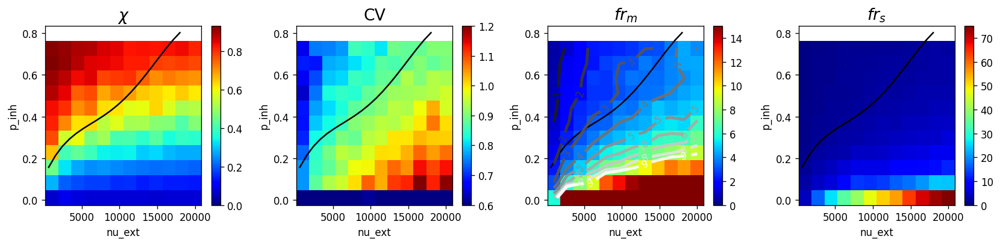

In [5113]:
n_ginh = 5
nb = 4

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_ginh,nb,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    return im, x, y

print("g_inh: %f, beta: %f"%(obj.controls["ginh_set"][n_ginh], obj.controls["beta_set"][nb]))

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]);
im, x, y = draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
c = plt.contour(x, y, im, frs, linewidths=3, alpha=0.9, cmap="gray", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)

plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

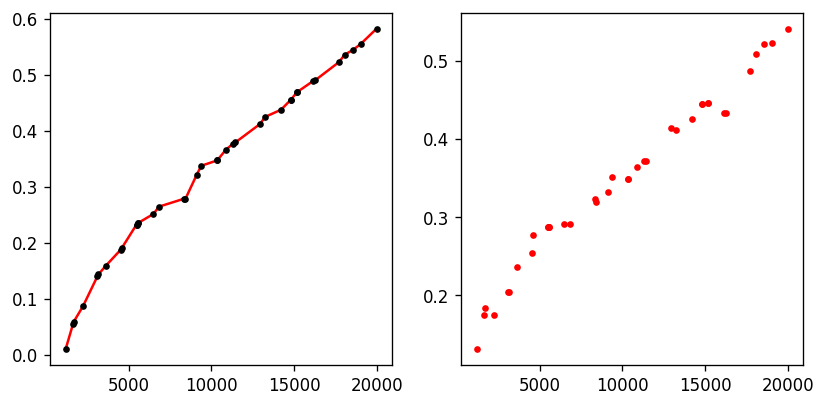

In [5123]:
num_fr = 7
xc_tmp, yc_tmp = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc_tmp.extend(v[:,0])
    yc_tmp.extend(v[:,1])
xc_tmp = np.array(xc_tmp)
yc_tmp = np.array(yc_tmp)

ind = np.argsort(xc_tmp)
xc_tmp = xc_tmp[ind]
yc_tmp = yc_tmp[ind]

chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc_tmp, yc_tmp)

plt.figure(dpi=120, figsize=(7,3.5))
plt.subplot(121)
plt.plot(xc_tmp, yc_tmp, 'k.')
plt.plot(xq, yq, 'r', zorder=-1)

plt.subplot(122)
plt.plot(xq, chi_line, 'r.')

plt.tight_layout()
plt.show()

In [5124]:
x = obj.controls["nu_ext"]
y = obj.controls["p_inh"]

nid = 0
n1 = np.argmin(np.abs(y - yq[nid]))
n2 = np.argmin(np.abs(x - xq[nid]))
print("p_inh: %f, nu_ext: %f"%(obj.controls["p_inh"][n1], obj.controls["nu_ext"][n2]))

print("chi:", obj.summary["chi"][n1, n2, n_ginh, nb, 0])
print("frs:", obj.summary["frs_m"][n1, n2, n_ginh, nb, 0])
print("cvs:", obj.summary["cv"][n1, n2, n_ginh, nb, 0])

data = obj.load_detail(n1, n2, n_ginh, nb, 0)

draw_detail(data, xl=(2000, 2500))

p_inh: 0.010000, nu_ext: 700.000000


IndexError: index 5 is out of bounds for axis 2 with size 5

p_inh: 0.297273, nu_ext: 14818.181818
chi: [0.423797 0.423761 0.428423]
frs: [6.159995 6.179996 6.079999]
cvs: [0.998791 0.995082 1.013667]


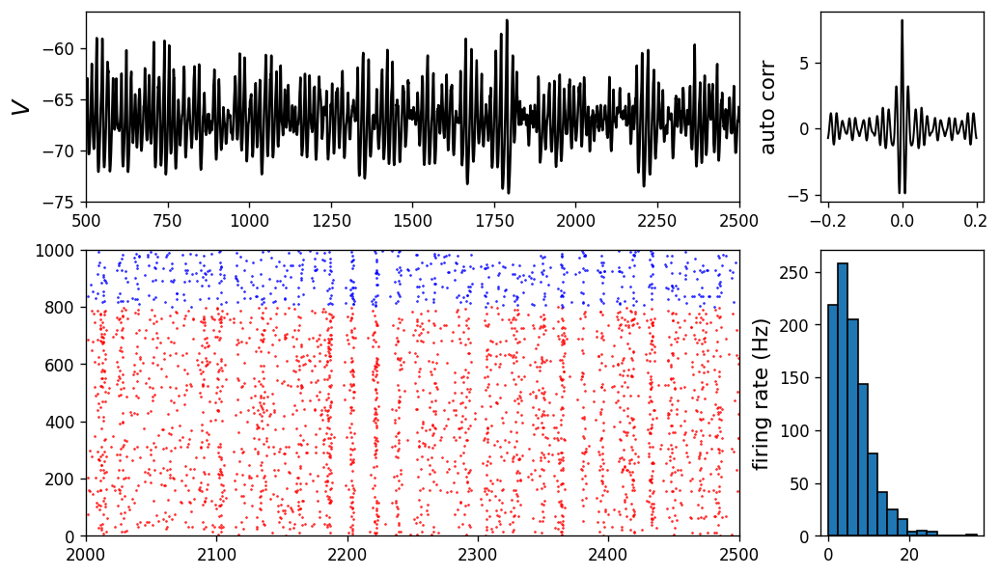

In [5116]:
x = obj.controls["nu_ext"]
y = obj.controls["p_inh"]

nid = 15
n1 = np.argmin(np.abs(y - yq[nid]))
n2 = np.argmin(np.abs(x - xq[nid]))
print("p_inh: %f, nu_ext: %f"%(obj.controls["p_inh"][n1], obj.controls["nu_ext"][n2]))

print("chi:", obj.summary["chi"][n1, n2, n_ginh, nb, 0])
print("frs:", obj.summary["frs_m"][n1, n2, n_ginh, nb, 0])
print("cvs:", obj.summary["cv"][n1, n2, n_ginh, nb, 0])

data = obj.load_detail(n1, n2, n_ginh, nb, 0)

draw_detail(data, xl=(2000, 2500))

In [5117]:
yf, freq = hhtools.get_fft(data["vlfp"][0], 2000)
idf = (freq >= 2) & (freq < 100)
yf = yf[idf]
freq = freq[idf]



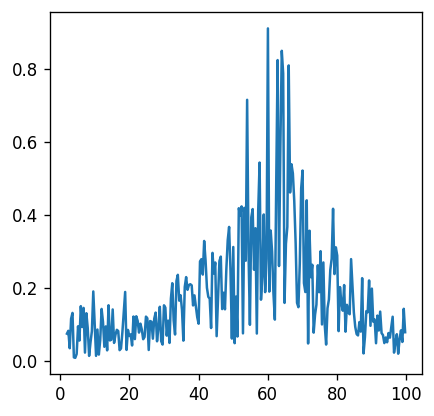

In [5118]:
plt.figure(dpi=120, figsize=(4,4))
plt.plot(freq, yf)
plt.show()

# pI_nuext_gi_b_slow

In [4997]:
obj = hhtools.SummaryLoader("./pI_nuext_gi_b_slow/")
print(obj.summary['chi'].shape)
print(obj.control_names)

Expected number of # results and exact file number are different!: 12322/16200
(15, 15, 6, 6, 2, 3)
['p_inh', 'nu_ext', 'g_inh', 'beta_set']


g_inh: 0.100000, beta: 0.064000


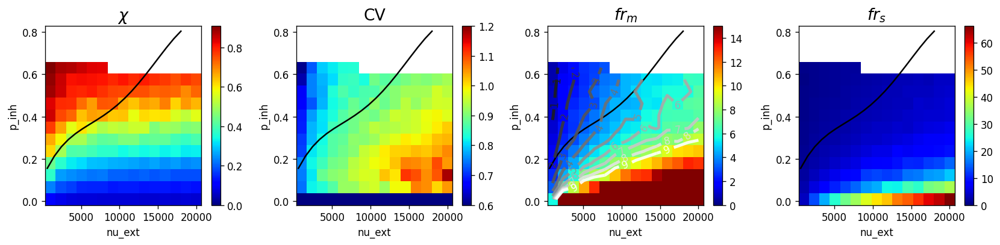

In [4998]:
n_ginh = 5
nb = 3

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_ginh,nb,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    return im, x, y

print("g_inh: %f, beta: %f"%(obj.controls["g_inh"][n_ginh], obj.controls["beta_set"][nb]))

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]);
im, x, y = draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
c = plt.contour(x, y, im, frs, linewidths=3, alpha=0.9, cmap="gray", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)

plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

size is different


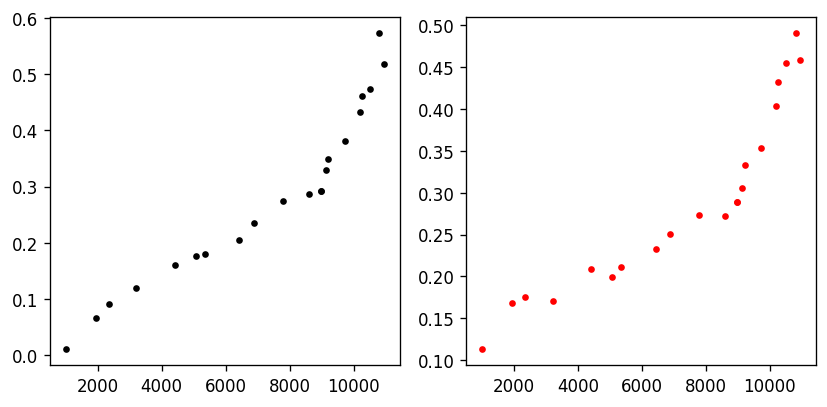

In [4988]:
num_fr = 6
xc_tmp, yc_tmp = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc_tmp.extend(v[:,0])
    yc_tmp.extend(v[:,1])
xc_tmp = np.array(xc_tmp)
yc_tmp = np.array(yc_tmp)

ind = np.argsort(xc_tmp)
xc_tmp = xc_tmp[ind]
yc_tmp = yc_tmp[ind]

chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc_tmp, yc_tmp)

plt.figure(dpi=120, figsize=(7,3.5))
plt.subplot(121)
plt.plot(xc_tmp, yc_tmp, 'k.')

plt.subplot(122)
plt.plot(xq, chi_line, 'r.')

plt.tight_layout()
plt.show()

# pI_nuext_slow_ver5

In [4990]:
obj = hhtools.SummaryLoader("./pI_nuext_slow_ver5/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(15, 15, 2, 3)
['p_inh', 'nu_ext']


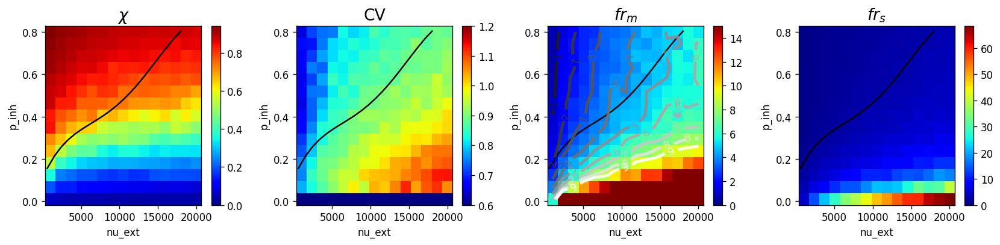

In [4991]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2)
    vary = "p_inh"
    varx = "nu_ext"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    return im, x, y

fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=1.2, vmin=0.6); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]);
im, x, y = draw_im("frs_m", vmax=15, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
c = plt.contour(x, y, im, frs, linewidths=3, alpha=0.9, cmap="gray", nchunk=5)
ax.clabel(c, inline=1, fontsize=10)

plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

size is different


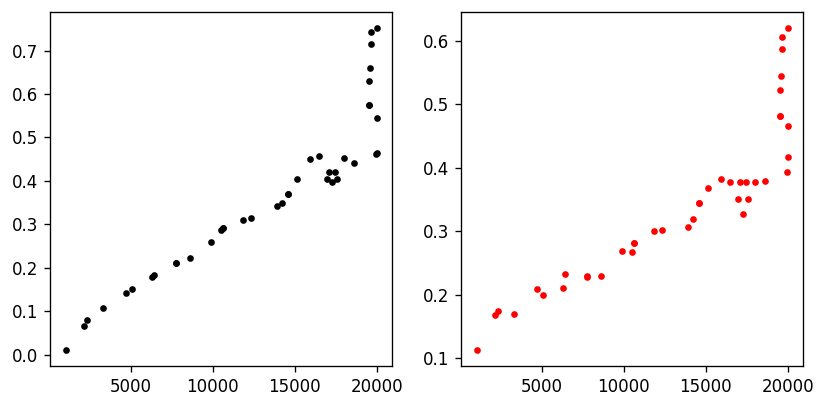

In [4983]:
num_fr = 6
xc_tmp, yc_tmp = [], []
for p in c.collections[num_fr].get_paths():
    v = p.vertices
    xc_tmp.extend(v[:,0])
    yc_tmp.extend(v[:,1])
xc_tmp = np.array(xc_tmp)
yc_tmp = np.array(yc_tmp)

ind = np.argsort(xc_tmp)
xc_tmp = xc_tmp[ind]
yc_tmp = yc_tmp[ind]

chi_line, xq, yq = hhtools.extract_value_on_line(im_chi, x, y, xc_tmp, yc_tmp)

plt.figure(dpi=120, figsize=(7,3.5))
plt.subplot(121)
plt.plot(xc_tmp, yc_tmp, 'k.')

plt.subplot(122)
plt.plot(xq, chi_line, 'r.')

plt.tight_layout()
plt.show()

# 1dge-nu_pi_gi

In [4636]:
obj = hhtools.SummaryLoader("./1dge-nu_pi_gi/")
print(obj.summary['chi'].shape)
print(obj.control_names)

FileNotFoundError: [Errno 2] No such file or directory: './1dge-nu_pi_gi/control_params.txt'

IndexError: too many indices for array: array is 4-dimensional, but 7 were indexed

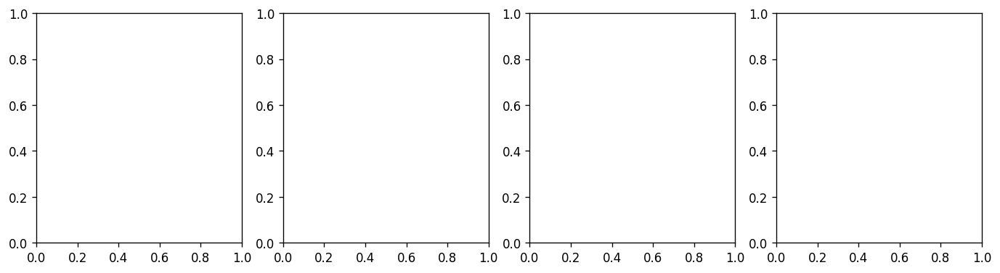

In [4637]:
n_gi = 0
n_gie = 0
n_gei = 0

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gi,n_gie,n_gei,:,0], axis=2).T
    # im = obj.summary[var_name][:,:,ng,0,0]
    varx = "nid"
    vary = "p_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    plt.pcolormesh(x, y, im, cmap="jet", vmin=vmin, vmax=vmax)
    # plt.plot(x_fit, y_fit, 'k')
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=None); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# 1dline

In [4350]:
obj = hhtools.SummaryLoader("./1dline//")
print(obj.summary['chi'].shape)
print(obj.control_names)

Expected number of # results and exact file number are different!: 317/400
(20, 2, 10, 3)
['nid', 'tau_set_number']


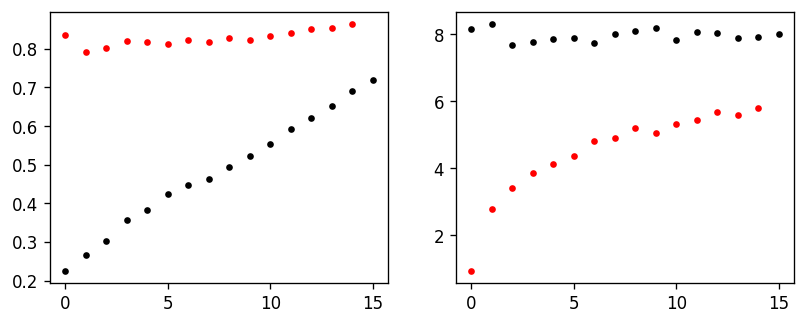

In [4351]:
fig, axs = plt.subplots(1, 2, dpi=120, figsize=(8, 3))
plt.axes(axs[0])
plt.plot(np.average(obj.summary["chi"][:,0,:,0], axis=1), 'k.')
plt.plot(np.average(obj.summary["chi"][:,1,:,0], axis=1), 'r.')

plt.axes(axs[1])
plt.plot(np.average(obj.summary["frs_m"][:,0,:,0], axis=1), 'k.')
plt.plot(np.average(obj.summary["frs_m"][:,1,:,0], axis=1), 'r.')
plt.show()

# 1dline_gi_gei_gie

In [4455]:
obj = hhtools.SummaryLoader("./1dline_gi_gei_gie/")
print(obj.summary['chi'].shape)
print(obj.control_names)

nid = [int(n) for n in obj.controls["nid"]]

(20, 10, 5, 5, 4, 3)
['nid', 'ginh', 'gei_ratio', 'gie_ratio']


In [4410]:
pi_sample = np.array([0.15570513, 0.21291326, 0.25711091, 0.29150554, 0.31896332,
       0.34200916, 0.36282669, 0.38325827, 0.40480496, 0.42862656,
       0.4555416 , 0.48602732, 0.52021969, 0.55791339, 0.59856185,
       0.6412772 , 0.68483031, 0.72765074, 0.76782682, 0.80310557])
nu_sample = np.array([600.        ,  1515.78947368,  2431.57894737,  3347.36842105,
        4263.15789474,  5178.94736842,  6094.73684211,  7010.52631579,
        7926.31578947,  8842.10526316,  9757.89473684, 10673.68421053,
       11589.47368421, 12505.26315789, 13421.05263158, 14336.84210526,
       15252.63157895, 16168.42105263, 17084.21052632, 18000])

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gei_ratio,n_gie_ratio,:,0], axis=2)
    varx = "nid"
    vary = "ginh"
    
    y = obj.controls[vary]
    x = pi_sample[nid]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.ylabel(vary)
    plt.xlabel(r"$p^I$")
    
    
def draw_summary():
    x = [yq[int(n)] for n in obj.controls["nid"]]
    
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=None); plt.title(r"$\chi$", fontsize=16)
    plt.axes(axs[1]); draw_im("cv", vmax=1.5, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

In [4418]:
print(obj.controls["gie_ratio"], obj.controls["gei_ratio"])

[0.5, 0.625, 0.75, 0.875, 1.0] [0.5, 0.75, 1.0, 1.25, 1.5]


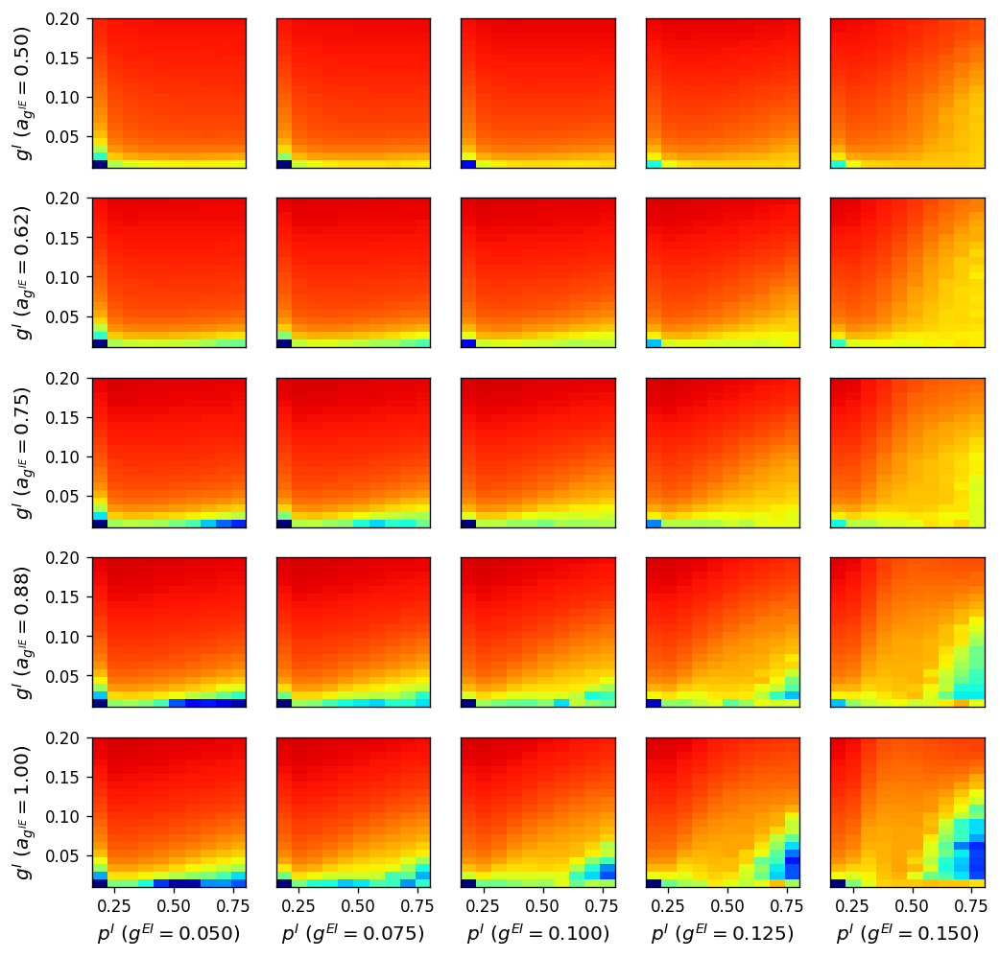

In [4475]:
var_name = "chi"
vmax = 1
vmin = 0.5

fig, axs = plt.subplots(5,5,figsize=(10, 10), dpi=120)
for i in range(5):
    for j in range(5):
        plt.axes(axs[i][j])
        
        y = obj.controls["ginh"]
        x = pi_sample[nid]
        
        im = np.average(obj.summary[var_name][:,:,i,j,:,0], axis=2)
        hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
        
        if i != 4:
            plt.xticks([])
        else:
            plt.xlabel(r"$p^I$ $(g^{EI}=%.3f)$"%(obj.controls["gei_ratio"][j]*0.1), fontsize=12)
            
        if j != 0:
            plt.yticks([])
        else:
            plt.ylabel(r"$g^I$ $(a_{g^{IE}}=%.2f)$"%(obj.controls["gie_ratio"][i]), fontsize=12)

plt.show()

fmin: 0, fmax: 40


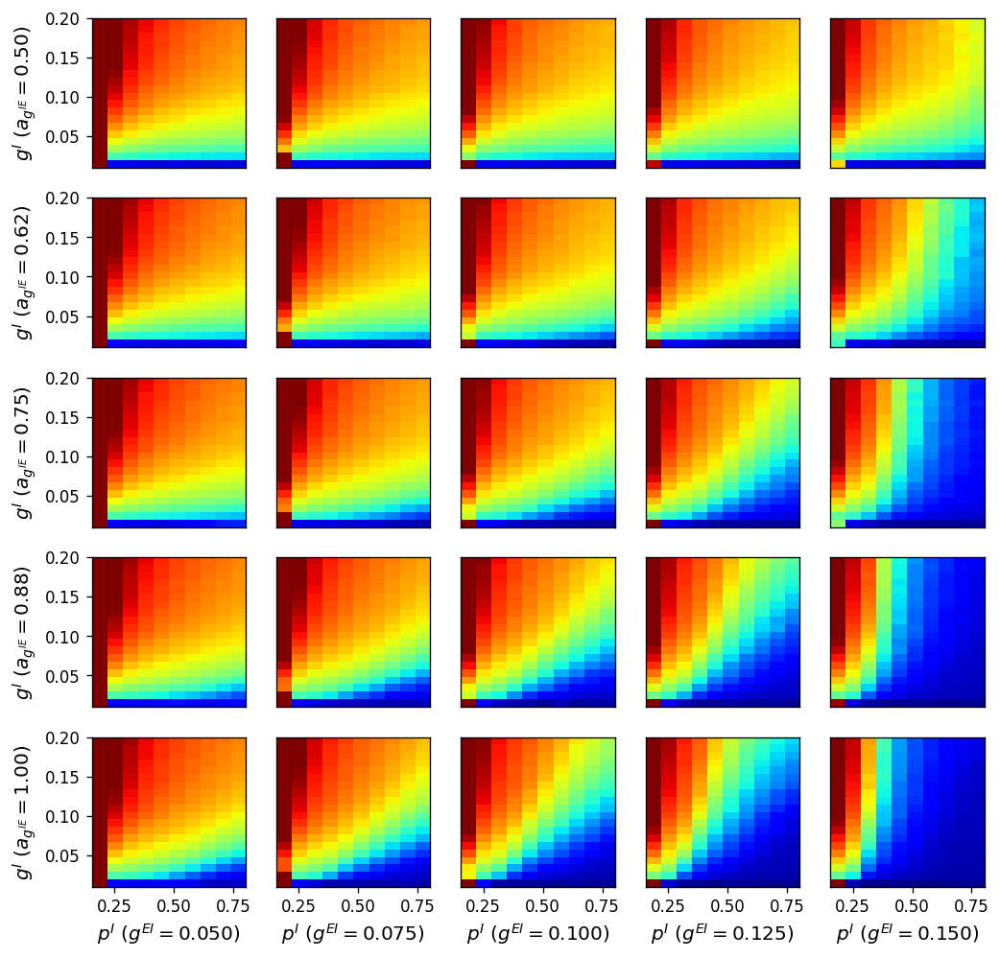

In [4472]:
var_name = "frs_m"
vmax = 40
vmin = 0

print("fmin: %d, fmax: %d"%(vmin, vmax))
fig, axs = plt.subplots(5,5,figsize=(10, 10), dpi=120)
for i in range(5):
    for j in range(5):
        plt.axes(axs[i][j])
        
        y = obj.controls["ginh"]
        x = pi_sample[nid]
        
        im = np.average(obj.summary[var_name][:,:,i,j,:,0], axis=2)
        hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
        
        if i != 4:
            plt.xticks([])
        else:
            plt.xlabel(r"$p^I$ $(g^{EI}=%.3f)$"%(obj.controls["gei_ratio"][j]*0.1), fontsize=12)
            
        if j != 0:
            plt.yticks([])
        else:
            plt.ylabel(r"$g^I$ $(a_{g^{IE}}=%.2f)$"%(obj.controls["gie_ratio"][i]), fontsize=12)

plt.show()

gie ratio: 1.000000, gei: 0.050000


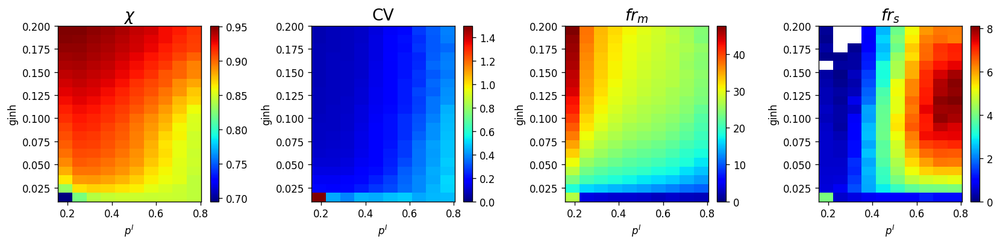

In [4449]:
n_gei_ratio = 0
n_gie_ratio = 4

print("gie ratio: %f, gei: %f"%(obj.controls["gie_ratio"][n_gie_ratio], obj.controls["gei_ratio"][n_gei_ratio] * 0.1))
draw_summary()

# 1dline_test_w

In [3067]:
obj = hhtools.SummaryLoader("./1dline_test_w//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 5, 5, 3)
['p_inh', 'w_ext_sd']


In [3068]:
im_osc = np.zeros(obj.summary["chi"].shape[:-1])
for n1 in range(im_osc.shape[0]):
    for n2 in range(im_osc.shape[1]):
        for n3 in range(im_osc.shape[2]):
            data = obj.load_detail(n1, n2, n3)
            im_osc[n1, n2, n3] = hhtools.get_network_frequency(data['vlfp'][0])

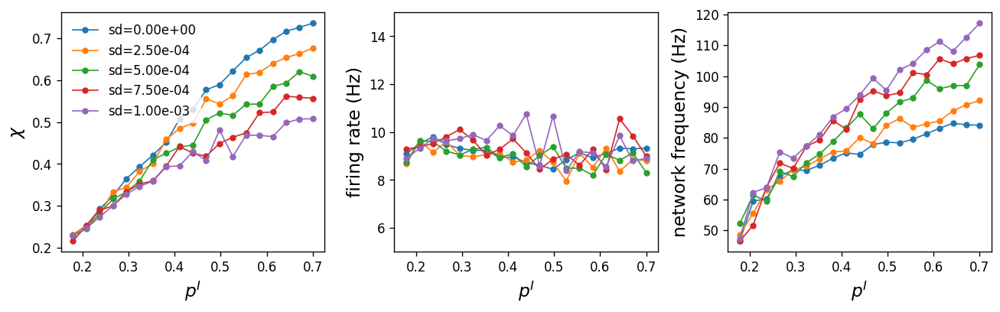

In [3069]:
fig, axs = plt.subplots(1, 3, dpi=120, figsize=(11,3.5))
plt.axes(axs[0])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["chi"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4, label=["sd=%.2e"%(s) for s in obj.controls["w_ext_sd"]])
plt.legend(loc="upper left", fontsize=10, edgecolor="none")
plt.ylabel(r"$\chi$", fontsize=14)
plt.xlabel(r"$p^I$", fontsize=14)

plt.axes(axs[1])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["frs_m"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4)
plt.ylim([5, 15])
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("firing rate (Hz)", fontsize=14)

plt.axes(axs[2])
plt.plot(obj.controls["p_inh"][1:], np.average(im_osc[1:,:,:], axis=2), 'o-', lw=1, ms=4)
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("network frequency (Hz)", fontsize=14)

plt.tight_layout()
plt.show()

asynchronous (left) / synchronous (right)


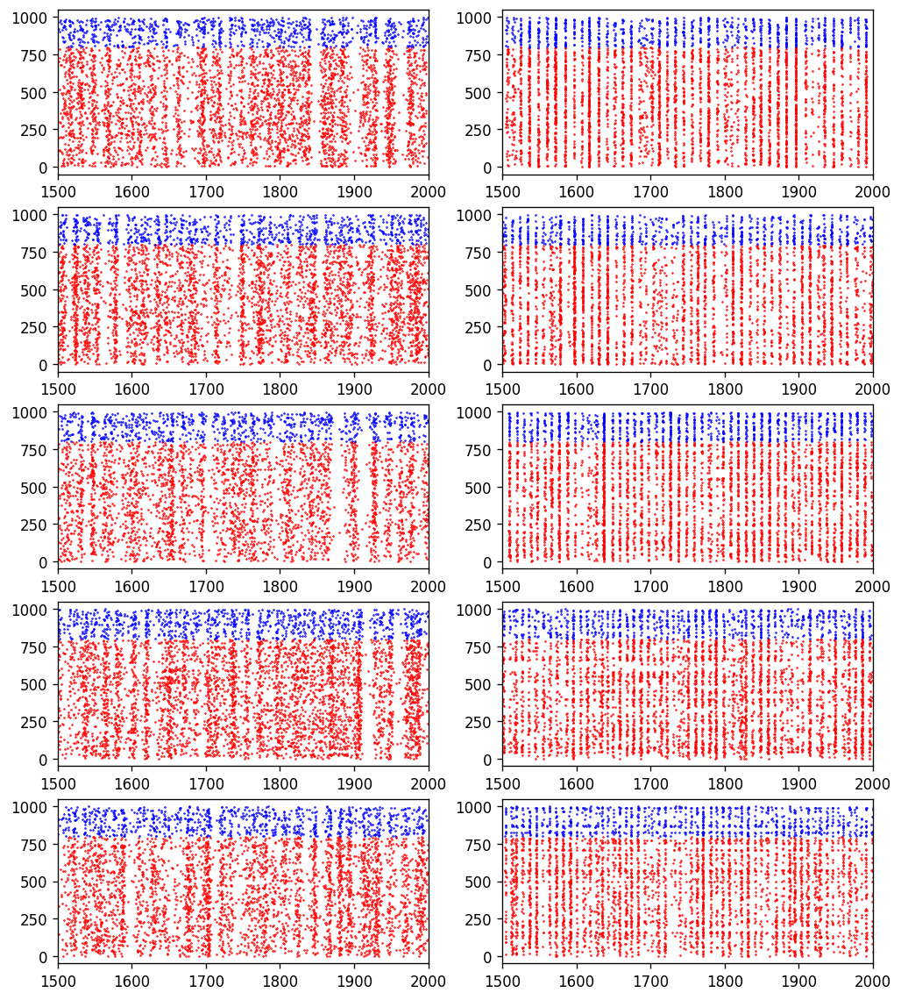

In [3070]:
nids = [1, 19]
print("asynchronous (left) / synchronous (right)")

fig, axs = plt.subplots(5, 2, dpi=120, figsize=(10, 12))
for n_sd in range(5):
    for i in range(2):
        data = obj.load_detail(nids[i], n_sd, 2)
        plt.axes(axs[n_sd][i])
        hhtools.draw_spk(data['step_spk'], color_ranges=[800, 1000], colors=["r", "b"], xl=(1500, 2000))
plt.show()

# 1dline_test_nu

In [3071]:
obj = hhtools.SummaryLoader("./1dline_test_nu/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 5, 5, 3)
['p_inh', 'nu_sd_ratio']


In [3072]:
im_osc = np.zeros(obj.summary["chi"].shape[:-1])
for n1 in range(im_osc.shape[0]):
    for n2 in range(im_osc.shape[1]):
        for n3 in range(im_osc.shape[2]):
            data = obj.load_detail(n1, n2, n3)
            im_osc[n1, n2, n3] = hhtools.get_network_frequency(data['vlfp'][0])

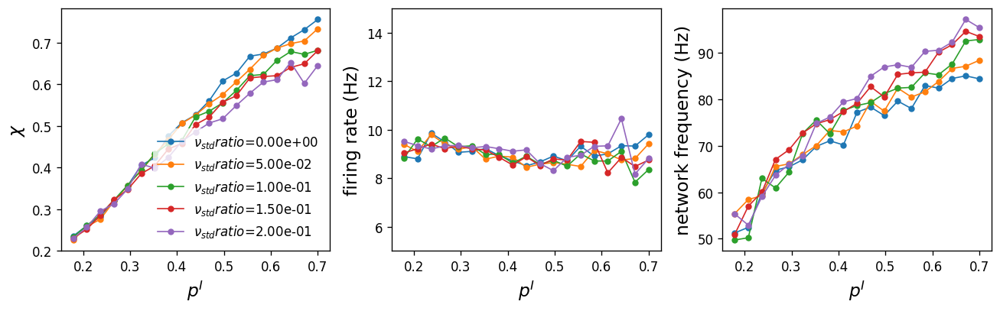

In [3075]:
fig, axs = plt.subplots(1, 3, dpi=120, figsize=(11,3.5))
plt.axes(axs[0])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["chi"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4, label=[r"$\nu_{std} ratio$=%.2e"%(s) for s in obj.controls["nu_sd_ratio"]])
plt.legend(loc="lower right", fontsize=10, edgecolor="none")
plt.ylabel(r"$\chi$", fontsize=14)
plt.xlabel(r"$p^I$", fontsize=14)

plt.axes(axs[1])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["frs_m"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4)
plt.ylim([5, 15])
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("firing rate (Hz)", fontsize=14)

plt.axes(axs[2])
plt.plot(obj.controls["p_inh"][1:], np.average(im_osc[1:,:,:], axis=2), 'o-', lw=1, ms=4)
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("network frequency (Hz)", fontsize=14)

plt.tight_layout()
plt.show()

# Synapse parameter

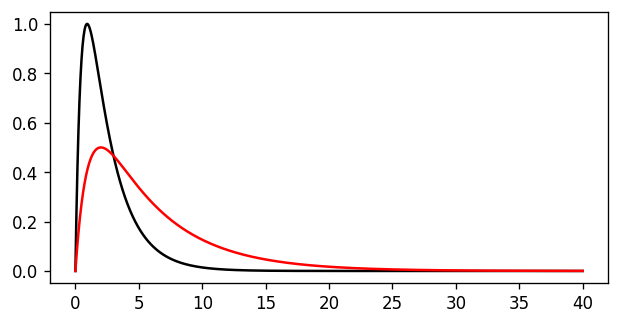

In [3740]:
taur0 = 0.5; taud0 = 2
taur  = 1 ; taud = 5

t = np.linspace(0, 40, 1000)

def gen_rsyn(r, d):
    tp = r*d/(d-r) * np.log(d/r)
    A = 1/(np.exp(-tp/r) - np.exp(-tp/d))
    return A*(np.exp(-t/r) - np.exp(-t/d))
    
plt.figure(dpi=120, figsize=(6, 3))
plt.plot(t, gen_rsyn(taur0, taud0), 'k')
plt.plot(t, gen_rsyn(taur, taud)*0.5, 'r')
plt.show()

# 1dline_gI_taur

In [3228]:
obj = hhtools.SummaryLoader("./1dline_gI_taur/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(10, 25, 8, 3, 3)
['g_inh', 'nid', 'taur']


In [3285]:
try:
    del n_taur
except:
    pass

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_taur,:,0], axis=2)
    varx = "nid"
    vary = "g_inh"
    
    y = obj.controls[vary]
    x = [yq[int(n)] for n in obj.controls["nid"]]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.ylabel(vary)
    plt.xlabel(r"$p^I$")
    
    
def draw_summary():
    x = [yq[int(n)] for n in obj.controls["nid"]]
    
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.plot([x[0], x[-1]], [0.2, 0.2], 'k')
    plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

# -> need to fit 8Hz

taur=0.500000


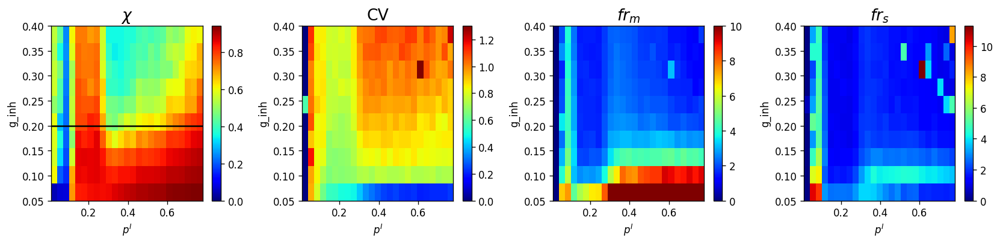

taur=1.142857


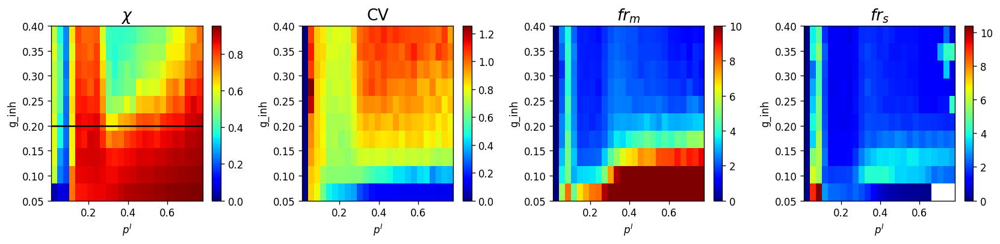

taur=2.000000


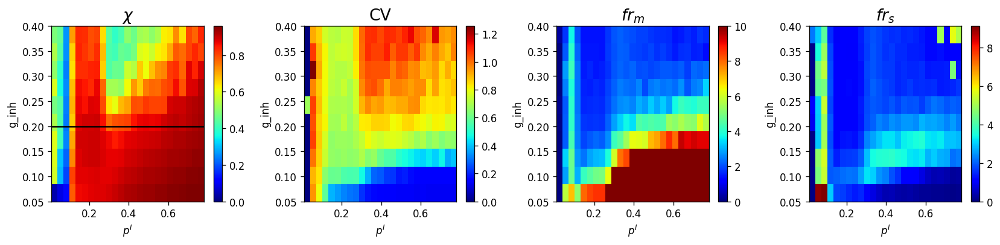

In [3286]:
n_taur = 0
print("taur=%f"%(obj.controls["taur"][n_taur]))
draw_summary()

n_taur = 3
print("taur=%f"%(obj.controls["taur"][n_taur]))
draw_summary()

n_taur = 7
print("taur=%f"%(obj.controls["taur"][n_taur]))
draw_summary()

# 1dline_gi_gei_taur

In [3367]:
xq = [  597.49069543,   600.        ,   600.        ,   624.53335633,
          640.05674222,   650.        ,   650.        ,   669.3375784 ,
          678.21249354,   694.61330864,   700.        ,   700.        ,
          700.        ,   700.        ,   700.        ,   701.71395299,
          716.46216715,   742.21030729,   750.        ,   750.        ,
          750.        ,   750.        ,   800.        ,   800.        ,
          850.        ,   850.        ,   873.95385943,   900.        ,
          900.        ,   932.79533279,   932.79533279,   950.        ,
          950.        ,   972.28748347,   972.28748347,  1000.        ,
         1000.        ,  1000.        ,  1000.        ,  1153.16343085,
         1195.25382708,  1195.25382708,  1200.06716343,  1299.14742185,
         2548.8261884 ,  3000.        ,  3297.40575018,  3297.40575018,
         3500.        ,  3500.        ,  3994.64243169,  5723.46628489,
         6000.        ,  6000.        ,  6425.33090333,  6500.        ,
         6866.14936954,  7000.        ,  7133.85132472,  7500.        ,
         7577.12272835,  7577.12272835,  8000.        ,  8500.        ,
         8500.        ,  8545.1252655 , 10401.86676789, 10500.        ,
        11000.        , 12700.08305663, 13000.        , 13231.12573398,
        13231.12573398, 13500.        , 13500.        , 13881.6370715 ,
        15536.18882148, 16000.        , 16000.        , 16217.92825515,
        16217.92825515, 16226.69696092, 16435.3966804 , 18057.16492616,
        18065.12765455, 18500.        , 18500.        , 18583.53600138,
        19000.        , 19247.46734119, 19404.70659082, 19500.        ,
        19500.        , 19500.        , 19500.        , 19661.21752507,
        19822.58809204, 19822.58809204, 19959.47500731, 20000.        ,
        20000.        , 20000.        ]
yq = [0.01      , 0.02002575, 0.02002575, 0.02362672, 0.02678498,
        0.02695832, 0.02695832, 0.02731876, 0.0282392 , 0.02950658,
        0.02969049, 0.0298156 , 0.030256  , 0.03357873, 0.04858244,
        0.050513  , 0.050513  , 0.050513  , 0.070769  , 0.070769  ,
        0.070769  , 0.07376927, 0.07376927, 0.08055608, 0.08408706,
        0.08408706, 0.08711787, 0.08763589, 0.091026  , 0.091026  ,
        0.091026  , 0.09519733, 0.09610686, 0.10005999, 0.10005999,
        0.111282  , 0.111282  , 0.111282  , 0.111282  , 0.111282  ,
        0.111282  , 0.11608299, 0.131538  , 0.13656296, 0.19794335,
        0.21057668, 0.212564  , 0.212564  , 0.21437205, 0.21437205,
        0.22983753, 0.27867996, 0.28434   , 0.28434   , 0.29312359,
        0.29359   , 0.29359   , 0.29359   , 0.29504673, 0.30368123,
        0.313846  , 0.313846  , 0.32555653, 0.32555653, 0.32722286,
        0.33237729, 0.36783584, 0.37155461, 0.37244193, 0.40572441,
        0.41053171, 0.415128  , 0.415128  , 0.43275748, 0.43355916,
        0.43355916, 0.47885916, 0.48363707, 0.48363707, 0.496154  ,
        0.51641   , 0.51641   , 0.52329814, 0.55389672, 0.556923  ,
        0.57148028, 0.57148028, 0.57336715, 0.57336715, 0.577179  ,
        0.577179  , 0.577179  , 0.58618052, 0.59290018, 0.597436  ,
        0.60385588, 0.617692  , 0.617692  , 0.62432651, 0.65571679,
        0.658205  , 0.65997667]

(25, 5, 5, 3, 2, 3)
['nid', 'g_ei', 'g_inh', 'taur']


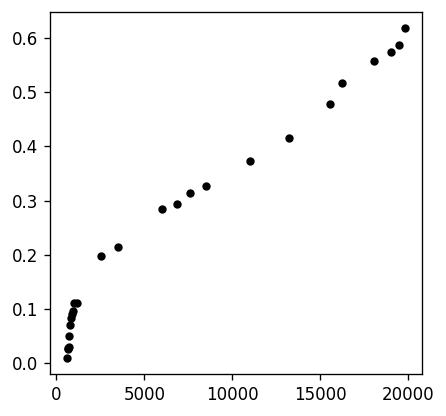

In [3645]:
obj = hhtools.SummaryLoader("./1dline_gi_gei_taur/")
print(obj.summary['chi'].shape)
print(obj.control_names)

# obj.controls["nid"] = np.array(obj.controls["nid"]).astype("int")
nu_sample = [xq[int(n)] for n in obj.controls["nid"]]
pi_sample = [yq[int(n)] for n in obj.controls["nid"]]

plt.figure(dpi=120, figsize=(4,4))
plt.plot(nu_sample, pi_sample, 'ko', markersize=4)

In [3646]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,n_gei,:,n_taur,:,0], axis=2).T
#     y = obj.controls[vary]
#     x = [yq[int(n)] for n in obj.controls["nid"]]
    # hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.pcolor(pi_sample, obj.controls["g_ei"], im, vmax=vmax, vmin=vmin, cmap="jet")
    plt.colorbar()
    plt.ylabel(r"$g^I$", fontsize=15)
    plt.xlabel(r"$p^I$", fontsize=15)
    
    
def draw_summary():
    print("g_e->i: %f (original: 0.1), taur: %f"%(obj.controls["g_ei"][n_gei], obj.controls["taur"][n_taur]))
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.plot([pi_sample[0], pi_sample[-1]], [0.2, 0.2], 'k')
    plt.plot(pi_sample[n_pi], obj.controls["g_inh"][n_gi], 'ko')
    plt.axes(axs[1]); draw_im("cv", vmax=1, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

gi: 0.137500
g_e->i: 0.250000 (original: 0.1), taur: 1.250000


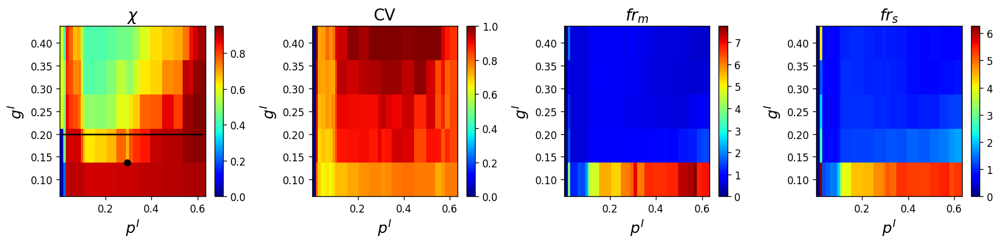

In [3650]:
n_gei = 2
n_taur = 1

n_gi = 1; n_pi = 14
print("gi: %f"%(obj.controls["g_inh"][n_gi]))
draw_summary()

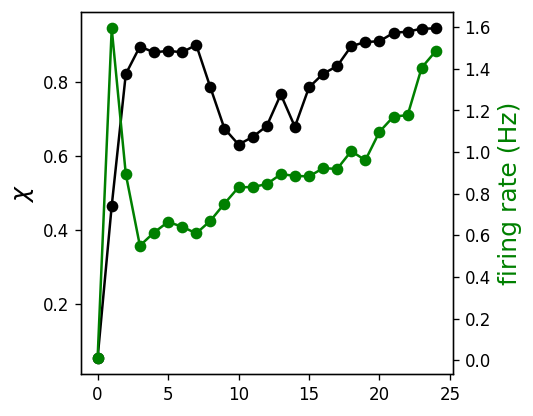

In [3651]:
plt.figure(dpi=120, figsize=(4,4))
plt.plot(np.average(obj.summary["chi"][:,n_gei,n_gi,n_taur,:,0], axis=1), 'ko-')
plt.ylabel(r"$\chi$", fontsize=15)

plt.twinx()
plt.plot(np.average(obj.summary["frs_m"][:,n_gei,n_gi,n_taur,:,0], axis=1), 'go-')
plt.ylabel("firing rate (Hz)", fontsize=15, color='g')
plt.show()

In [3652]:
data = obj.load_detail(n_pi, n_gei, n_gi, n_taur, 0)
for nid in range(3):
    print("chi: %f, frs_m: %f"%(obj.summary["chi"][n_pi, n_gei, n_gi, n_taur, 0, nid], obj.summary["frs_m"][n_pi, n_gei, n_gi, n_taur, 0, nid]))

chi: 0.691990, frs_m: 0.869201
chi: 0.737869, frs_m: 0.407999
chi: 0.592031, frs_m: 2.714000


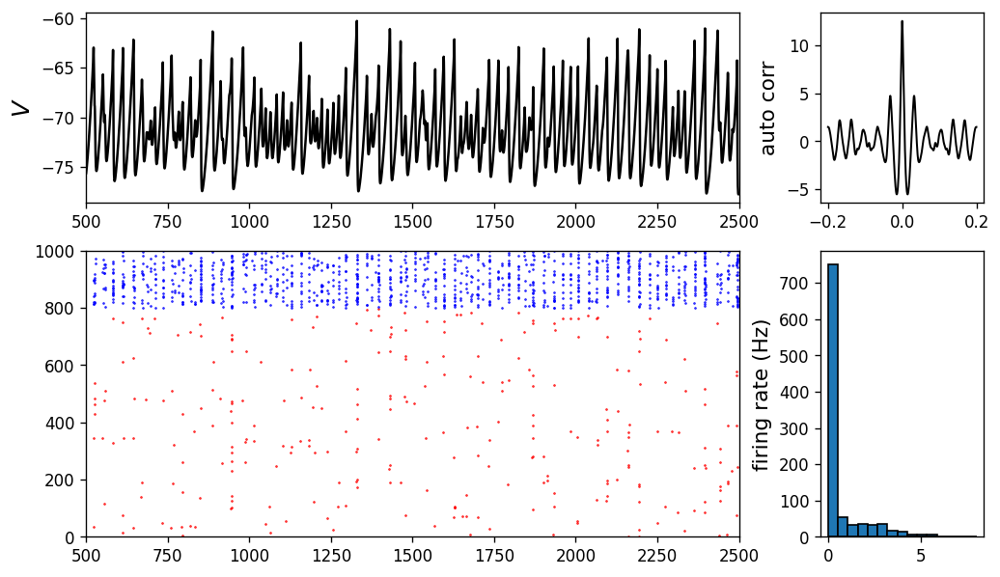

In [3545]:
draw_detail(data)

In [ ]:
# try:
#     del n_taur
# except:
#     pass

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_taur,:,0], axis=2)
    varx = "nid"
    vary = "g_inh"
    
    y = obj.controls[vary]
    x = [yq[int(n)] for n in obj.controls["nid"]]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.ylabel(vary)
    plt.xlabel(r"$p^I$")
    
    
def draw_summary():
    x = [yq[int(n)] for n in obj.controls["nid"]]
    
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.plot([x[0], x[-1]], [0.2, 0.2], 'k')
    plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

# -> need to fit 8Hz

# 1dline_taud

In [2694]:
obj = hhtools.SummaryLoader("./1dline_taud/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 5, 5, 3)
['p_inh', 'taud_set']


In [2695]:
im_osc = np.zeros(obj.summary["chi"].shape[:-1])
for n1 in range(im_osc.shape[0]):
    for n2 in range(im_osc.shape[1]):
        for n3 in range(im_osc.shape[2]):
            data = obj.load_detail(n1, n2, n3)
            im_osc[n1, n2, n3] = hhtools.get_network_frequency(data['vlfp'][0])

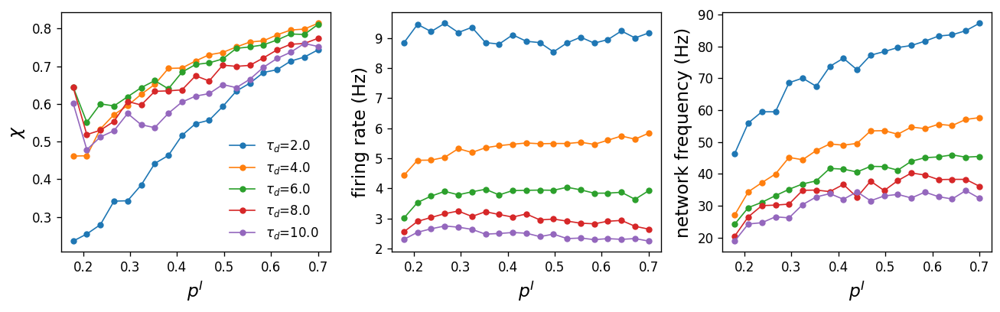

In [2702]:
fig, axs = plt.subplots(1, 3, dpi=120, figsize=(11,3.5))
plt.axes(axs[0])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["chi"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4, label=[r"$\tau_d$=%.1f"%(s) for s in obj.controls["taud_set"]])
plt.legend(loc="lower right", fontsize=10, edgecolor="none")
plt.ylabel(r"$\chi$", fontsize=14)
plt.xlabel(r"$p^I$", fontsize=14)

plt.axes(axs[1])
plt.plot(obj.controls["p_inh"][1:], np.average(obj.summary["frs_m"][:,:,:,0][1:], axis=2), 'o-', lw=1, ms=4)
# plt.ylim([5, 15])
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("firing rate (Hz)", fontsize=14)

plt.axes(axs[2])
plt.plot(obj.controls["p_inh"][1:], np.average(im_osc[1:,:,:], axis=2), 'o-', lw=1, ms=4)
plt.xlabel(r"$p^I$", fontsize=14)
plt.ylabel("network frequency (Hz)", fontsize=14)

plt.tight_layout()
plt.show()

# 1dline_gI

In [2876]:
obj = hhtools.SummaryLoader("./1dline_gI/")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 30, 5, 3)
['p_inh', 'g_inh']


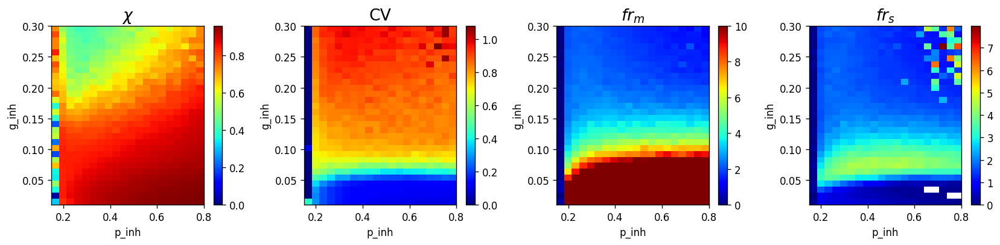

In [2878]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,:,0], axis=2).T
    varx = "p_inh"
    vary = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)


fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
plt.axes(axs[1]); draw_im("cv", vmax=None, vmin=0); plt.title(r"CV", fontsize=16)
plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
plt.tight_layout()
plt.show()

# -> need to fit 8Hz

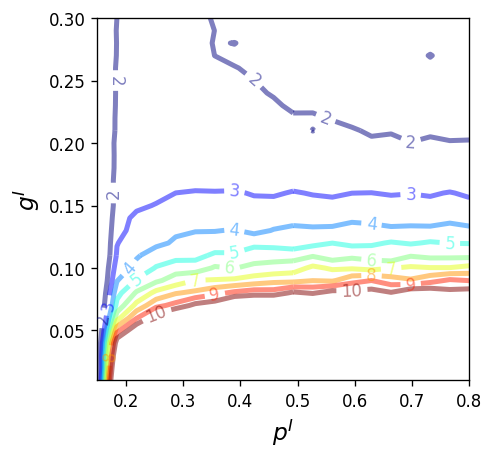

In [2888]:
x = obj.controls["p_inh"]
y = obj.controls["g_inh"]
im_frs = np.average(obj.summary["frs_m"][:,:,:,0], axis=2).T

fig, ax = plt.subplots(1,1, dpi=120, figsize=(4,4))
frs = np.arange(2, 11)
c = plt.contour(x, y, im_frs, frs, linewidths=3, alpha=0.5, cmap="jet", nchunk=10)
ax.clabel(c, inline=1, fontsize=10)
plt.ylabel(r"$g^I$", fontsize=14)
plt.xlabel(r"$p^I$", fontsize=14)
plt.show()

# 1dline_gi_gei_gie

In [4118]:
nu_sample = np.array([600.        ,  1501.0644403 ,  2402.12888059,  3303.19332089,
                      4204.25776118,  5105.32220148,  6006.38664178,  6907.45108207,
                      7808.51552237,  8709.57996266,  9610.64440296, 10511.70884326,
                      11412.77328355, 12313.83772385, 13214.90216414, 14115.96660444,
                      15017.03104474, 15918.09548503, 16819.15992533, 17720.22436562])

pi_sample = np.array([0.13902773, 0.22097366, 0.24675042, 0.28806103, 0.30753848,
                      0.3306489 , 0.3573789 , 0.38212835, 0.40195617, 0.43689235,
                      0.44917938, 0.4680604 , 0.50648781, 0.54161394, 0.57770911,
                      0.62319761, 0.67209814, 0.70023133, 0.75190616, 0.779744])

In [4119]:
obj = hhtools.SummaryLoader("./1dline_gi_gei_gie//")
print(obj.summary['chi'].shape)
print(obj.control_names)

nid = [int(i) for i in obj.controls["nid"]]
gie = 0.2 * np.array(obj.controls["gie_ratio"])

(20, 5, 5, 5, 4, 3)
['nid', 'g_inh', 'gei_ratio', 'gie_ratio']


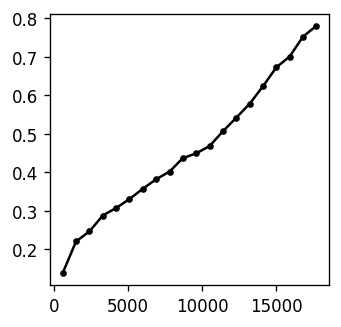

In [4120]:
plt.figure(dpi=120, figsize=(3,3))
plt.plot(nu_sample[nid], pi_sample[nid], 'k.-')
plt.show()

In [4121]:
x_line = pi_sample[nid]

def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,n_gei_ratio,n_gie,:,0], axis=2).T
    vary = "g_inh"
    y = obj.controls[vary]
    
    hhtools.imshow_xy(im, x=x_line, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(r"$p^I$", fontsize=14)
    plt.ylabel(vary)
    

def draw_result():
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.axes(axs[1]); draw_im("cv", vmax=1, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=10, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

gei: 0.020000, gie: 0.040000


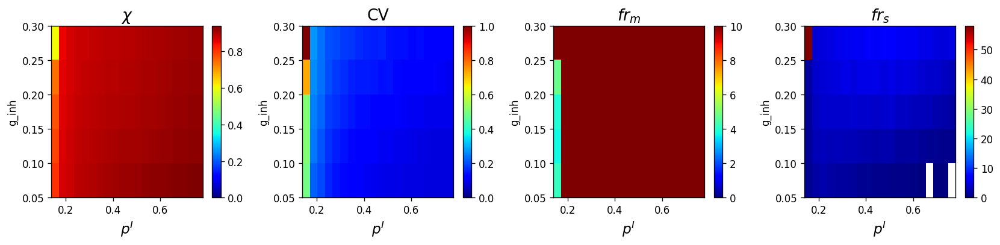

gei: 0.080000, gie: 0.200000


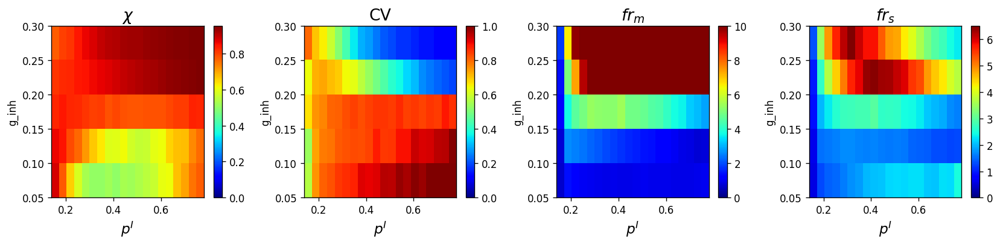

In [4122]:
n_gei_ratio = 0
n_gie = 0
print("gei: %f, gie: %f"%(obj.controls["gei_ratio"][n_gei_ratio]*0.1, gie[n_gie]))
draw_result()

n_gei_ratio = 3
n_gie = 4
print("gei: %f, gie: %f"%(obj.controls["gei_ratio"][n_gei_ratio]*0.1, gie[n_gie]))
draw_result()

In [4133]:
obj.get_id(8, 2, 4, 4, 0)

4296

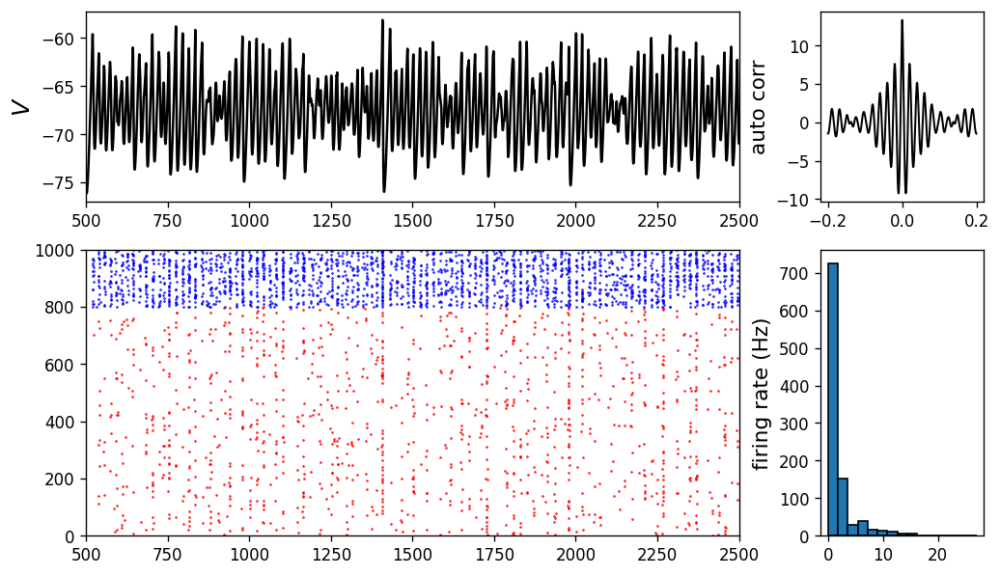

In [4134]:
# data1 = obj.load_detail(10, 4, 0, 0, 0)
n_gei_ratio = 3
n_gie = 4

# data2 = obj.load_detail(10, 1, n_gei_ratio, n_gie, 0)
data = obj.load_detail(10, 0, 4, 1, 0)

# draw_detail(data1)
draw_detail(data)

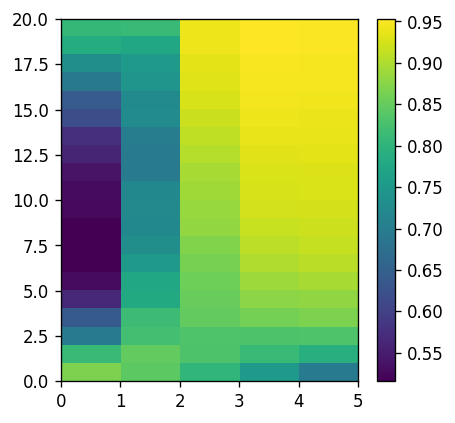

In [4009]:
n_gei_ratio = 3
n_gie_ratio = 3

plt.figure(dpi=120, figsize=(4,4))
hhtools.imshow_xy(np.average(obj.summary["chi"][:,:,n_gei_ratio,n_gie_ratio,:,0], axis=2))
plt.colorbar()
plt.show()

# 1dline_gI_gE

In [4763]:
obj = hhtools.SummaryLoader("./1dline_gI_gE//")
print(obj.summary['chi'].shape)
print(obj.control_names)

(20, 20, 20, 3, 3)
['p_inh', 'g_inh', 'g_exc']


## x-gI

In [4764]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,:,ng_exc,:,0], axis=2)
    vary = "p_inh"
    varx = "g_inh"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    

def draw_result():
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.axes(axs[1]); draw_im("cv", vmax=1, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=80, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

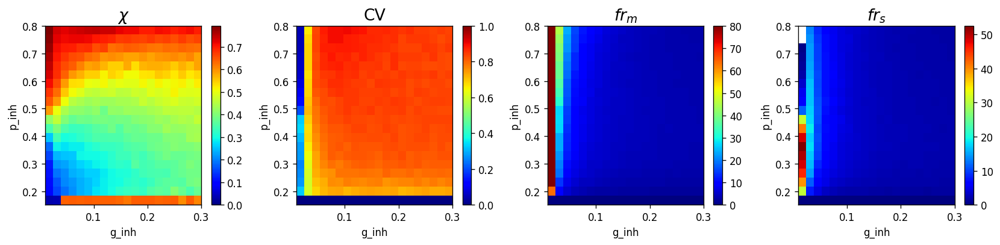

g_exc = 0.025263



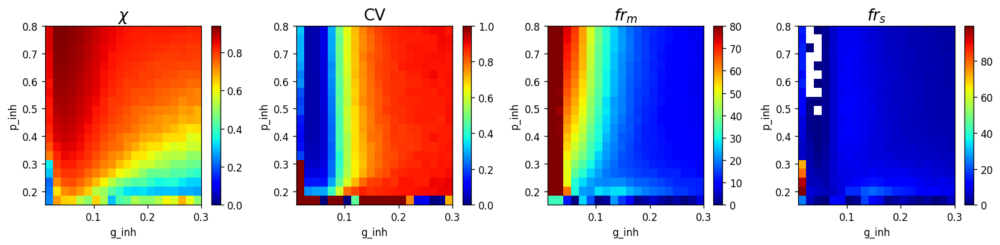

g_exc = 0.162632



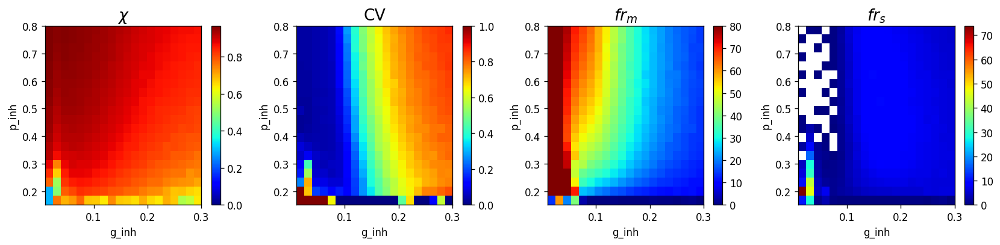

g_exc = 0.300000



In [4765]:
ng_exc = 1
draw_result()
print("g_exc = %f\n"%(obj.controls["g_exc"][ng_exc]))

ng_exc = 10
draw_result()
print("g_exc = %f\n"%(obj.controls["g_exc"][ng_exc]))

ng_exc = 19
draw_result()
print("g_exc = %f\n"%(obj.controls["g_exc"][ng_exc]))

In [3084]:
# -> input이 들어오고 그에 맞춰 gI가 변하는 상황은 가능함: short-term plasticity -> 이게 input에 대한 response를 이해하는데 중요한 factor가 될 지도? (depression / faciliation)

## x-gE

In [4766]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][:,ng_inh,:,:,0], axis=2)
    vary = "p_inh"
    varx = "g_exc"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    

def draw_result():
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.axes(axs[1]); draw_im("cv", vmax=1, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=None, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

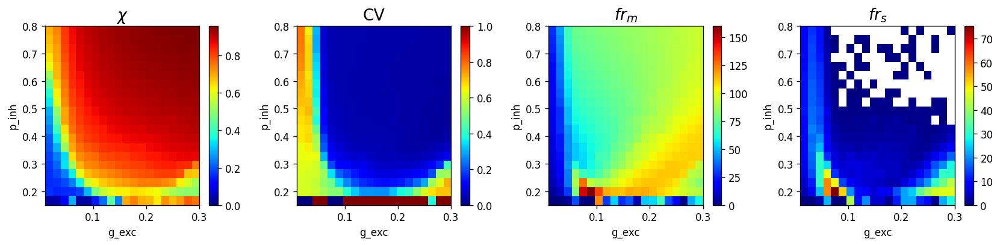

g_inh = 0.025263



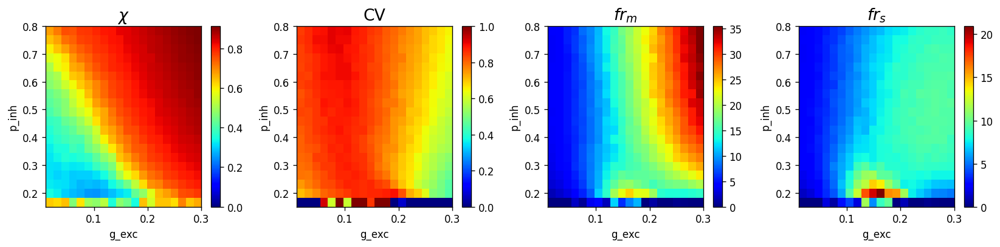

g_inh = 0.162632



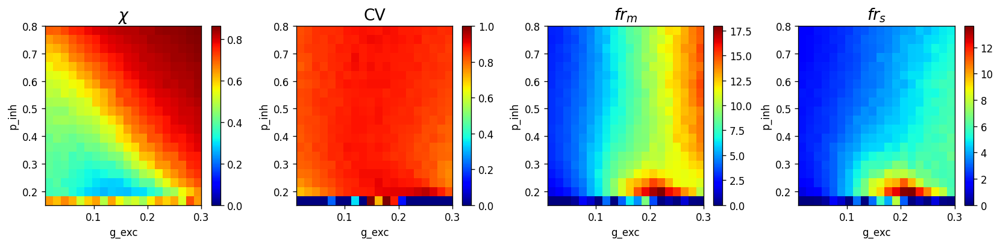

g_inh = 0.300000



In [4767]:
ng_inh = 1
draw_result()
print("g_inh = %f\n"%(obj.controls["g_inh"][ng_inh]))

ng_inh = 10
draw_result()
print("g_inh = %f\n"%(obj.controls["g_inh"][ng_inh]))

ng_inh = 19
draw_result()
print("g_inh = %f\n"%(obj.controls["g_inh"][ng_inh]))

## gI-gE

In [4768]:
def draw_im(var_name, vmax=None, vmin=None):
    im = np.average(obj.summary[var_name][np_inh,:,:,:,0], axis=2)
    vary = "g_inh"
    varx = "g_exc"
    
    y = obj.controls[vary]
    x = obj.controls[varx]
    hhtools.imshow_xy(im, x=x, y=y, cmap="jet", vmax=vmax, vmin=vmin)
    plt.colorbar()
    plt.xlabel(varx)
    plt.ylabel(vary)
    

def draw_result():
    fig, axs = plt.subplots(1, 4, dpi=120, figsize=(14, 3.5))
    plt.axes(axs[0]); draw_im("chi", vmax=None, vmin=0); plt.title(r"$\chi$", fontsize=16)
    plt.axes(axs[1]); draw_im("cv", vmax=1, vmin=0); plt.title(r"CV", fontsize=16)
    plt.axes(axs[2]); draw_im("frs_m", vmax=80, vmin=0);  plt.title(r"$fr_{m}$", fontsize=16)
    plt.axes(axs[3]); draw_im("frs_s", vmax=None, vmin=0);  plt.title(r"$fr_{s}$", fontsize=16)
    plt.tight_layout()
    plt.show()

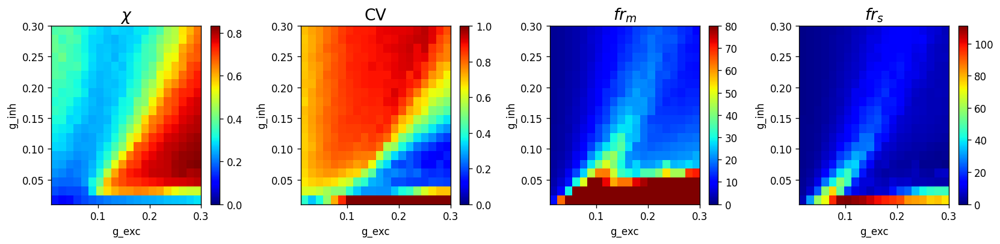

p_inh = 0.184211



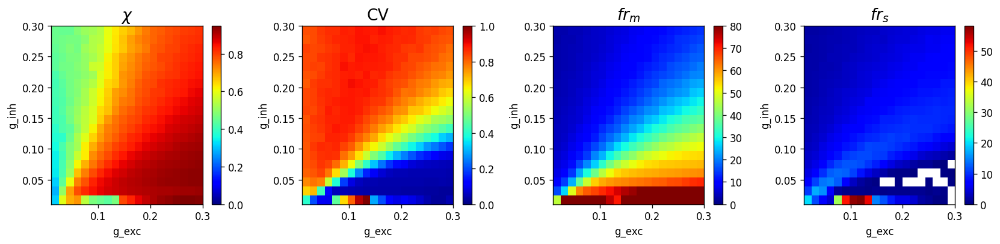

p_inh = 0.492105



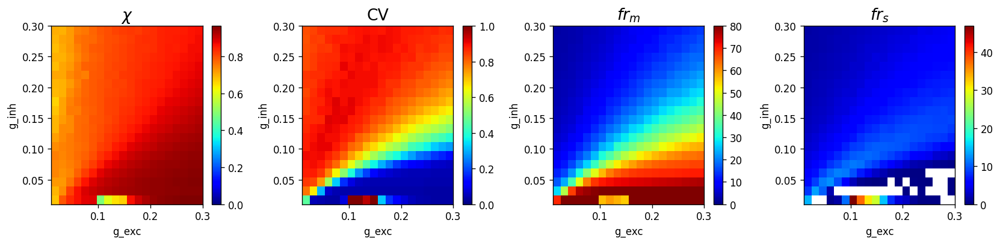

p_inh = 0.800000



In [4769]:
np_inh = 1
draw_result()
print("p_inh = %f\n"%(obj.controls["p_inh"][np_inh]))

np_inh = 10
draw_result()
print("p_inh = %f\n"%(obj.controls["p_inh"][np_inh]))

np_inh = 19
draw_result()
print("p_inh = %f\n"%(obj.controls["p_inh"][np_inh]))